In [118]:
import pandas as pd
import numpy as np
from numpy import mean, std
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split,cross_val_score,LeaveOneOut,GridSearchCV, cross_val_score, cross_val_predict, train_test_split,StratifiedKFold, LeavePOut
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import Normalizer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import math
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.covariance import EmpiricalCovariance
from sklearn.metrics import f1_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.datasets import make_circles
from sklearn import preprocessing
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
from sklearn.cluster import KMeans
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingRegressor
import warnings


warnings.filterwarnings('ignore')

In [119]:
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 500)

### N12 Verileri için Modeller

In [120]:
data_N12 = pd.read_excel('N Verileri.xlsx')
data_N12 = data_N12.iloc[:, :2] # 1. ve 2. kolonları seçelim
data_N12

,N12_FI_X1_iz10_imort,N12_X1_fi
0,0.0,0.000000e+00
1,2.5,-4.049136e-02
2,5.0,-8.098273e-02
3,7.5,-1.214741e-01
4,10.0,-1.619655e-01
5,12.5,-2.024568e-01
6,15.0,-2.429482e-01
7,17.5,-2.834395e-01
8,20.0,-3.239309e-01
9,22.5,-3.644223e-01


In [121]:
data_N12 = data_N12.loc[:131,:] 
data_N12['N12_FI_X1_iz10_imort'] = data_N12['N12_FI_X1_iz10_imort'] / 100 # koordinat değerlerini / 10 yapmam gerekli
data_N12

,N12_FI_X1_iz10_imort,N12_X1_fi
0,0.000,0.000000e+00
1,0.025,-4.049136e-02
2,0.050,-8.098273e-02
3,0.075,-1.214741e-01
4,0.100,-1.619655e-01
5,0.125,-2.024568e-01
6,0.150,-2.429482e-01
7,0.175,-2.834395e-01
8,0.200,-3.239309e-01
9,0.225,-3.644223e-01


In [122]:
data_N12.columns[data_N12.isnull().any()]

Index([], dtype='object')

In [123]:
data_N12.isna().any()

N12_FI_X1_iz10_imort    False
N12_X1_fi               False
dtype: bool

In [124]:
data_N12.describe().T

,count,mean,std,min,25%,50%,75%,max
N12_FI_X1_iz10_imort,132.0,0.500000,0.205413,0.000000,0.350000,0.500000,0.650000,1.000000e+00
N12_X1_fi,132.0,-0.447466,0.126022,-0.532795,-0.522759,-0.497371,-0.437765,6.034765e-09


### veri kontrol edildi, problem yok

In [125]:
X_N12 = data_N12.iloc[:, :1].values
y_N12 = data_N12.iloc[:,1].values

In [126]:
X_N12.shape, y_N12.shape

((132, 1), (132,))

In [127]:
X_train_N12, X_test_N12, y_train_N12, y_test_N12 = train_test_split(X_N12, y_N12, test_size=0.25, random_state=42)

### RandomForestRegressor

[[-0.53 -0.53]
 [-0.52 -0.52]
 [-0.46 -0.46]
 [-0.49 -0.49]
 [-0.53 -0.53]
 [-0.43 -0.42]
 [-0.53 -0.53]
 [-0.09 -0.12]
 [-0.53 -0.53]
 [-0.48 -0.48]
 [-0.52 -0.52]
 [-0.48 -0.48]
 [-0.52 -0.52]
 [-0.14 -0.16]
 [-0.5  -0.5 ]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.52 -0.52]
 [-0.51 -0.51]
 [-0.53 -0.53]
 [-0.44 -0.45]
 [-0.42 -0.4 ]
 [-0.52 -0.51]
 [-0.42 -0.4 ]
 [-0.47 -0.47]
 [-0.53 -0.53]
 [-0.2  -0.16]
 [-0.51 -0.5 ]
 [-0.5  -0.5 ]
 [-0.07  0.  ]
 [-0.42 -0.41]
 [-0.25 -0.2 ]
 [-0.53 -0.53]]
0.9818027110123693
TEST SET
MAE:                 0.003658852662917763
RMSE:                0.010368141483277903
MAPE:                inf
r2:                  0.9931795791990897


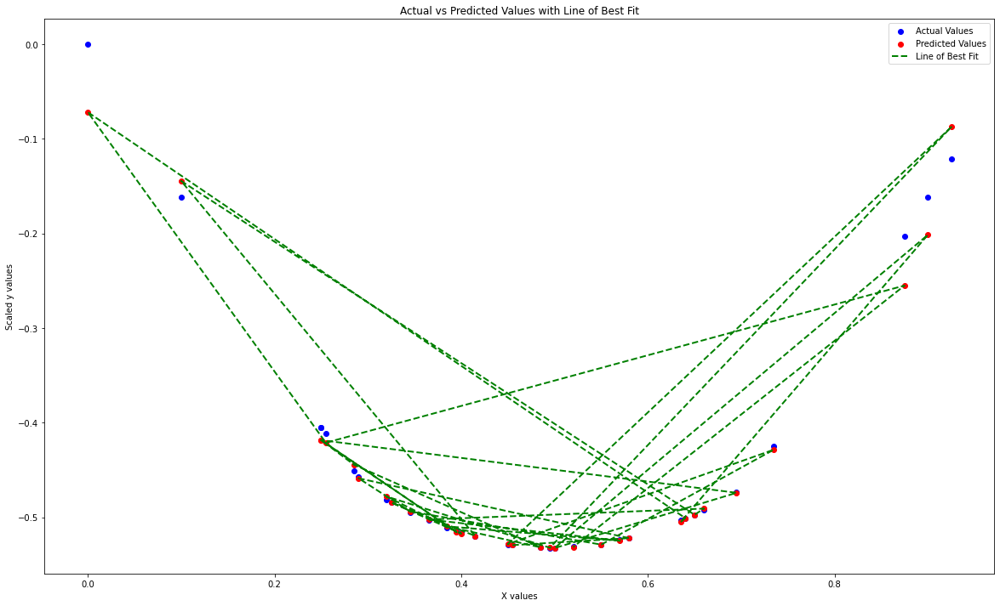

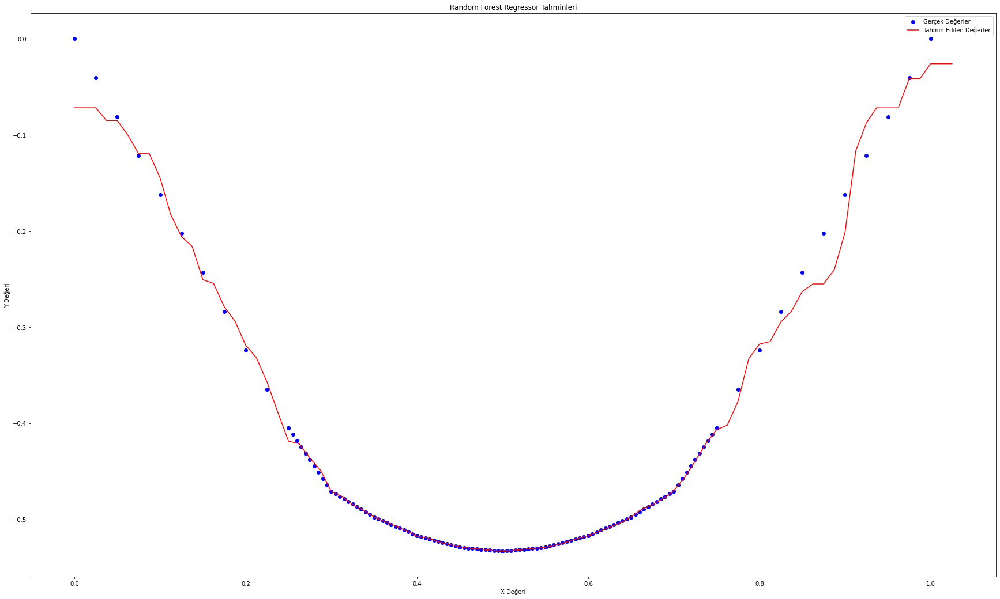

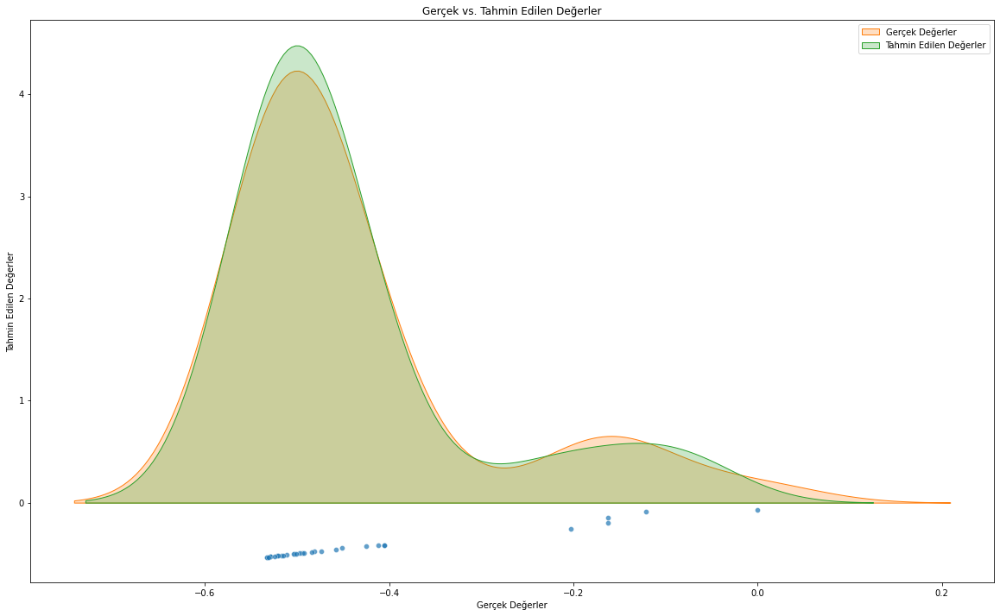

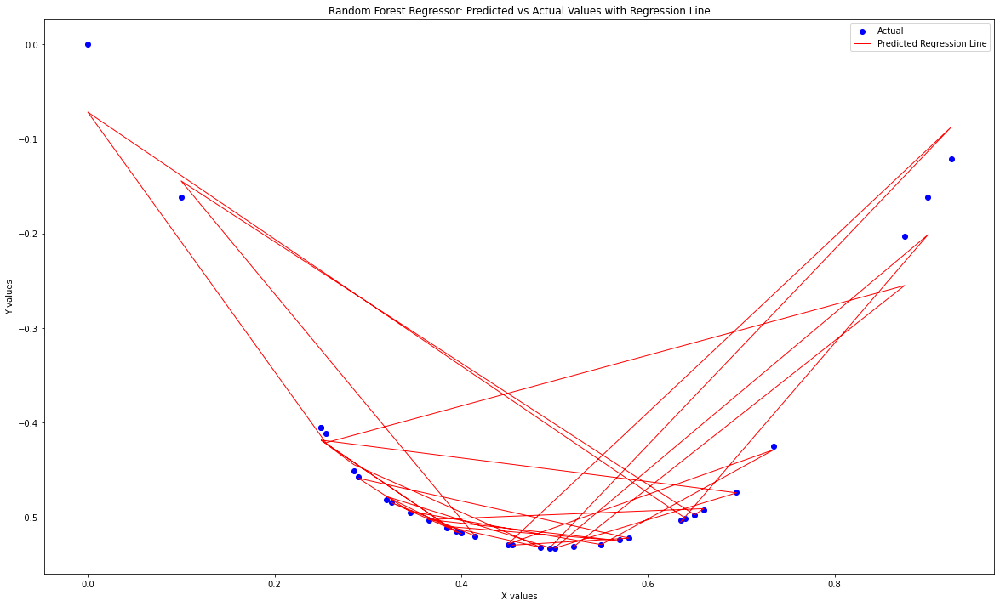

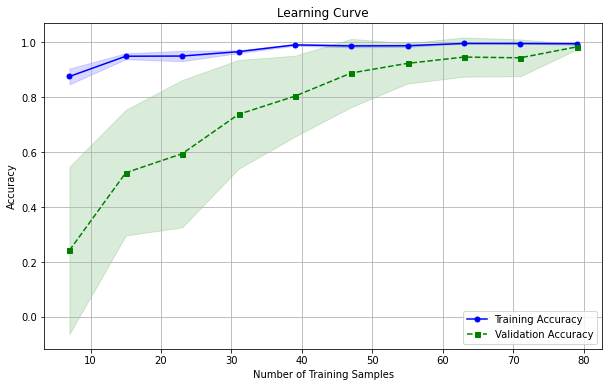

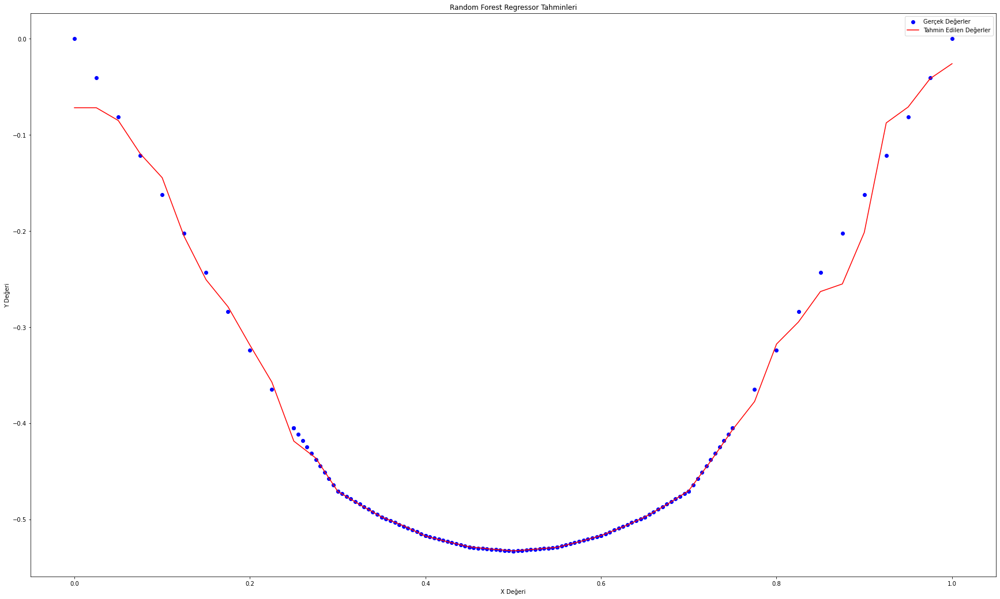

[-0.42]


In [128]:
rf_reg_N12 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_N12.fit(X_train_N12, y_train_N12)

y_pred_N12 = rf_reg_N12.predict(X_test_N12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N12.reshape(len(y_pred_N12),1), y_test_N12.reshape(len(y_test_N12),1)),1))

print(r2_score(y_test_N12, y_pred_N12))

# Use test and show results of test set
y_hat_N12 = rf_reg_N12.predict(X_N12)
mae = metrics.mean_absolute_error(y_N12,y_hat_N12)
mse = metrics.mean_squared_error(y_N12,y_hat_N12)
mape = np.mean(np.abs((y_N12 - y_hat_N12) / y_N12)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_N12.score(X_N12,y_N12))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_N12, y_test_N12, color='blue', label='Actual Values')
plt.scatter(X_test_N12, y_pred_N12, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_N12, y_pred_N12, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N12 = np.arange(0, 1.03125, 0.0125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N12 = rf_reg_N12.predict(X_values_N12)

# Gerçek değerler için aynı işlemi yap
y_true_values_N12 = rf_reg_N12.predict(X_N12)

plt.figure(figsize=(30, 18))
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N12, y_pred_values_N12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N12 = pd.DataFrame({'Gerçek Değerler': y_test_N12, 'Tahmin Edilen Değerler': y_pred_N12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N12 = pd.DataFrame({'Predicted': y_pred_N12, 'Actual': y_test_N12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N12, y_test_N12, color='blue', label='Actual')
plt.plot(X_test_N12, y_pred_N12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_N12, X=X_train_N12, y=y_train_N12, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N12 = np.arange(0, 1.025, 0.025).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N12 = rf_reg_N12.predict(X_values_N12)

# Gerçek değerler için aynı işlemi yap
y_true_values_N12 = rf_reg_N12.predict(X_N12)

plt.figure(figsize=(30, 18))
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N12, y_pred_values_N12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_N12.predict([[0.250]])) #0.250 == -4.049136e-01 gerçek değerde


### XGBRegressor ile deneyelim

[[-0.53 -0.53]
 [-0.52 -0.52]
 [-0.46 -0.46]
 [-0.5  -0.49]
 [-0.53 -0.53]
 [-0.42 -0.42]
 [-0.53 -0.53]
 [-0.08 -0.12]
 [-0.53 -0.53]
 [-0.48 -0.48]
 [-0.52 -0.52]
 [-0.49 -0.48]
 [-0.52 -0.52]
 [-0.2  -0.16]
 [-0.5  -0.5 ]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.52 -0.52]
 [-0.51 -0.51]
 [-0.53 -0.53]
 [-0.44 -0.45]
 [-0.42 -0.4 ]
 [-0.52 -0.51]
 [-0.42 -0.4 ]
 [-0.47 -0.47]
 [-0.53 -0.53]
 [-0.08 -0.16]
 [-0.5  -0.5 ]
 [-0.5  -0.5 ]
 [-0.04  0.  ]
 [-0.42 -0.41]
 [-0.24 -0.2 ]
 [-0.53 -0.53]]
0.9781209985126169
TEST SET
MAE:                 0.0037131113590257595
RMSE:                0.010313806353681457
MAPE:                inf
r2:                  0.9932508778785172


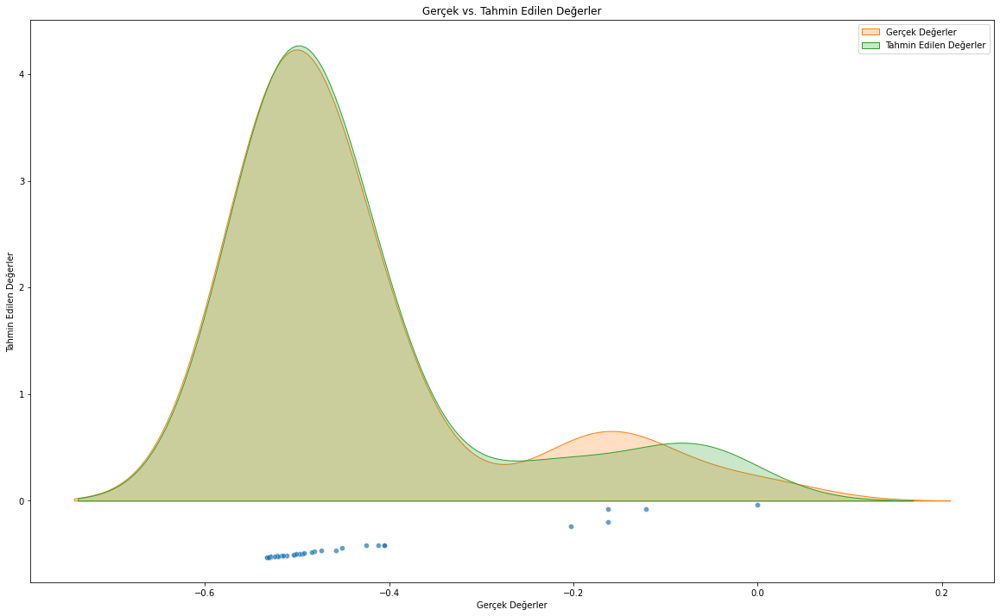

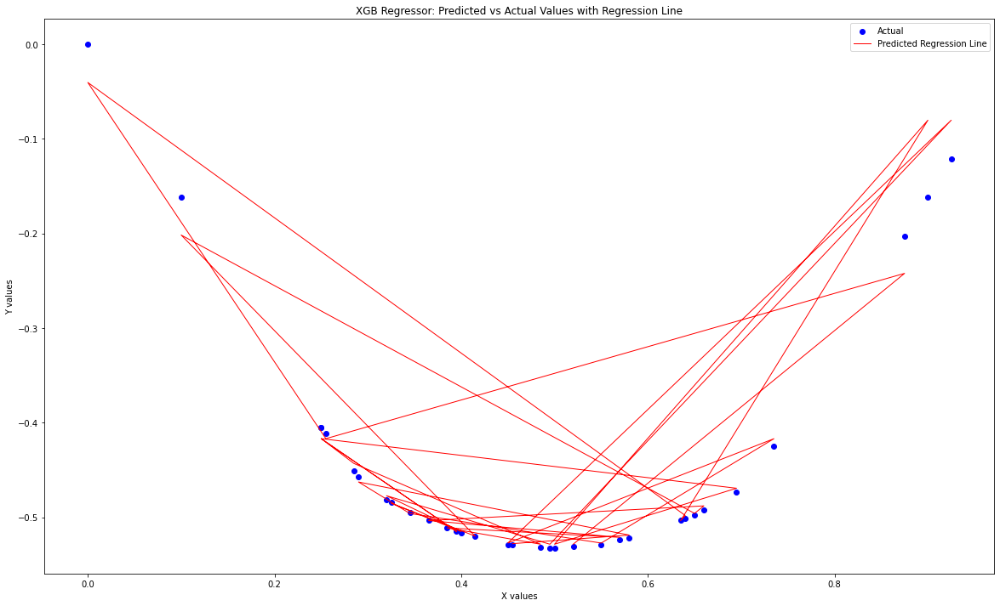

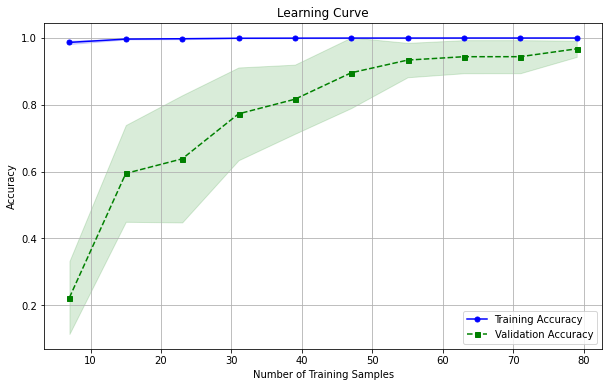

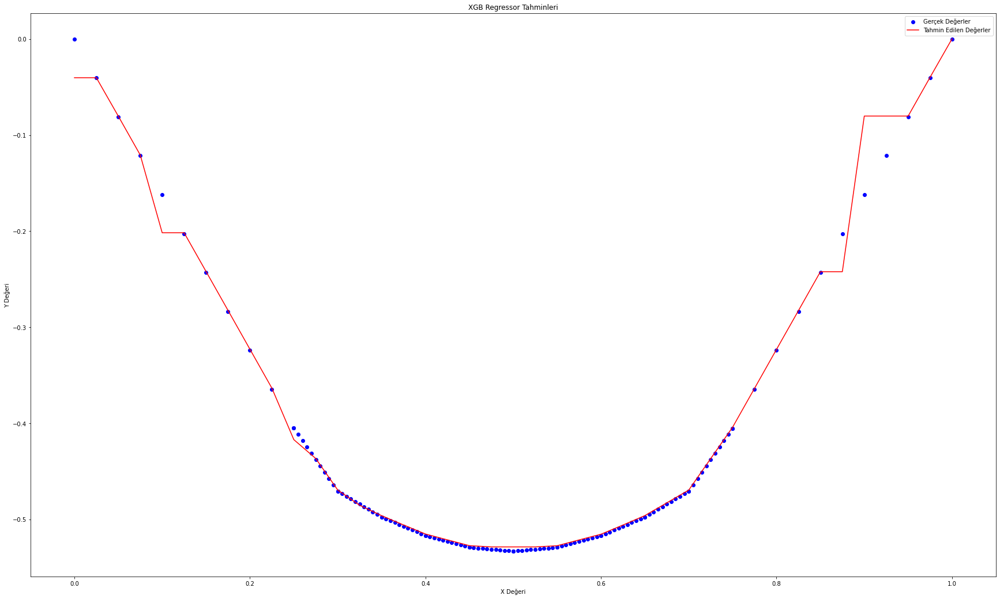

[-0.42]


In [129]:
from xgboost import XGBRegressor


xgb_N12 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_N12.fit(X_train_N12, y_train_N12)

y_pred_N12 = xgb_N12.predict(X_test_N12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N12.reshape(len(y_pred_N12),1), y_test_N12.reshape(len(y_test_N12),1)),1))


print(r2_score(y_test_N12, y_pred_N12))

# Use test and show results of test set
y_hat_N12 = xgb_N12.predict(X_N12)
mae = metrics.mean_absolute_error(y_N12,y_hat_N12)
mse = metrics.mean_squared_error(y_N12,y_hat_N12)
mape = np.mean(np.abs((y_N12 - y_hat_N12) / y_N12)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_N12.score(X_N12,y_N12))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N12 = pd.DataFrame({'Gerçek Değerler': y_test_N12, 'Tahmin Edilen Değerler': y_pred_N12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N12 = pd.DataFrame({'Predicted': y_pred_N12, 'Actual': y_test_N12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N12, y_test_N12, color='blue', label='Actual')
plt.plot(X_test_N12, y_pred_N12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_N12, X=X_train_N12, y=y_train_N12, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N12 = np.arange(0, 1.025, 0.025).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_N12 = xgb_N12.predict(X_values_N12)

# Gerçek değerler için aynı işlemi yap
y_true_values_N12 = xgb_N12.predict(X_N12)

plt.figure(figsize=(30, 18))
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N12, y_pred_values_N12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_N12.predict([[0.250]])) #0.250 == -4.049136e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-0.53 -0.53]
 [-0.52 -0.52]
 [-0.46 -0.46]
 [-0.49 -0.49]
 [-0.53 -0.53]
 [-0.43 -0.42]
 [-0.53 -0.53]
 [-0.08 -0.12]
 [-0.53 -0.53]
 [-0.48 -0.48]
 [-0.52 -0.52]
 [-0.49 -0.48]
 [-0.52 -0.52]
 [-0.12 -0.16]
 [-0.5  -0.5 ]
 [-0.49 -0.49]
 [-0.5  -0.5 ]
 [-0.53 -0.52]
 [-0.51 -0.51]
 [-0.53 -0.53]
 [-0.44 -0.45]
 [-0.42 -0.4 ]
 [-0.52 -0.51]
 [-0.42 -0.4 ]
 [-0.48 -0.47]
 [-0.53 -0.53]
 [-0.24 -0.16]
 [-0.51 -0.5 ]
 [-0.5  -0.5 ]
 [-0.04  0.  ]
 [-0.42 -0.41]
 [-0.24 -0.2 ]
 [-0.53 -0.53]]
0.9779586553592778
TEST SET
MAE:                 0.0027475990201190053
RMSE:                0.010264856602621835
MAPE:                inf
r2:                  0.9933147890800055


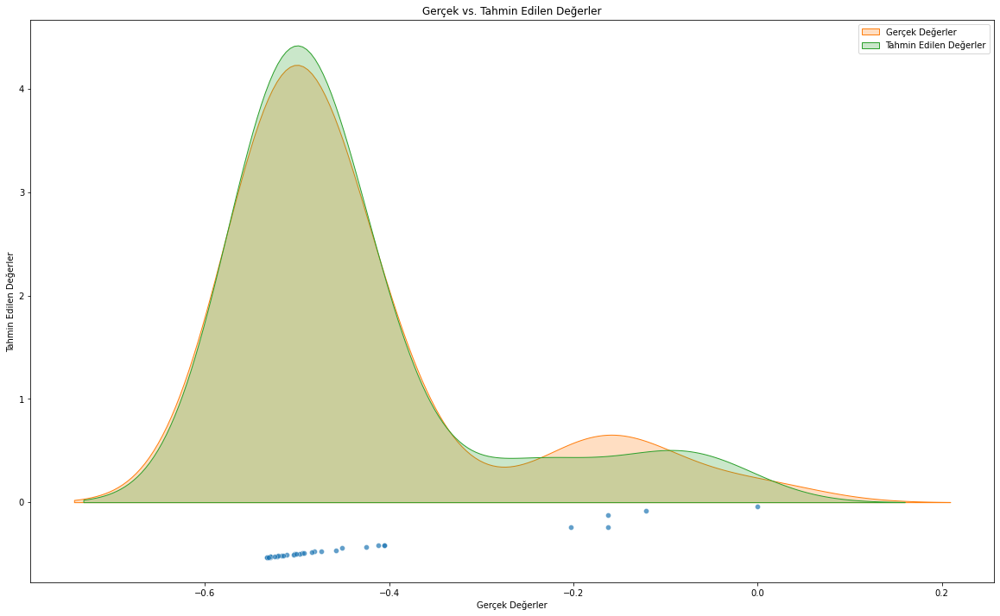

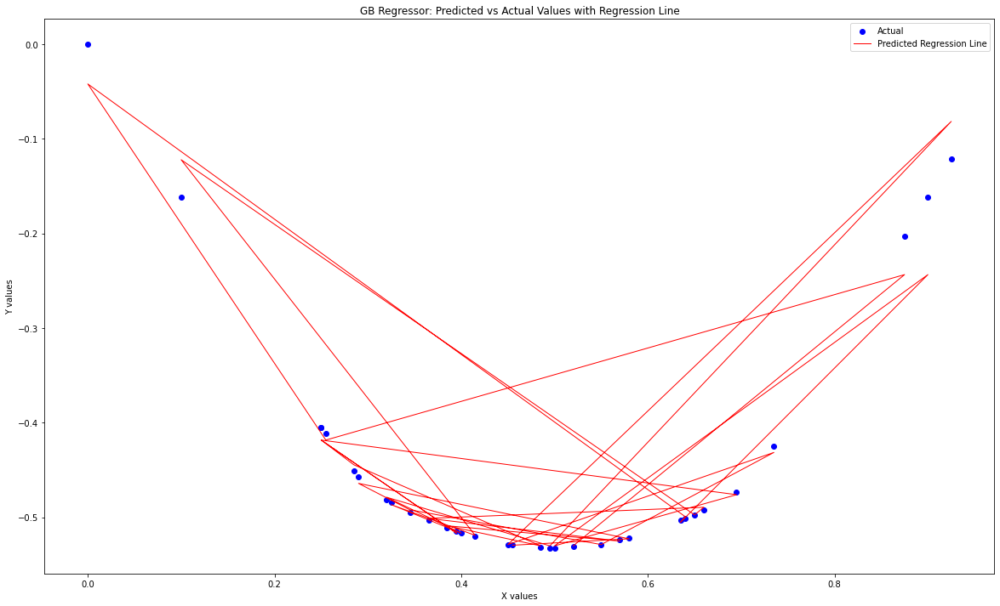

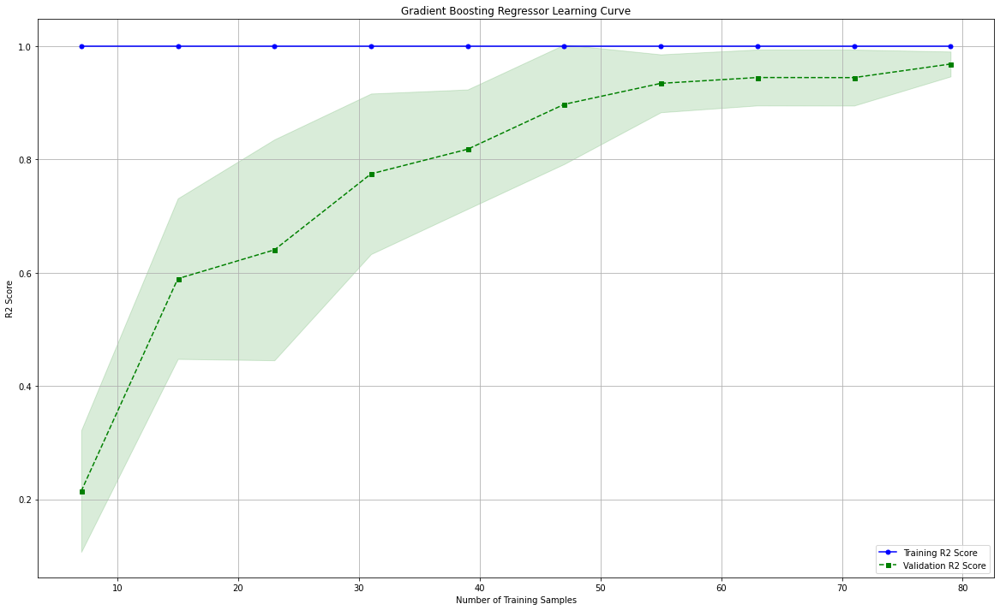

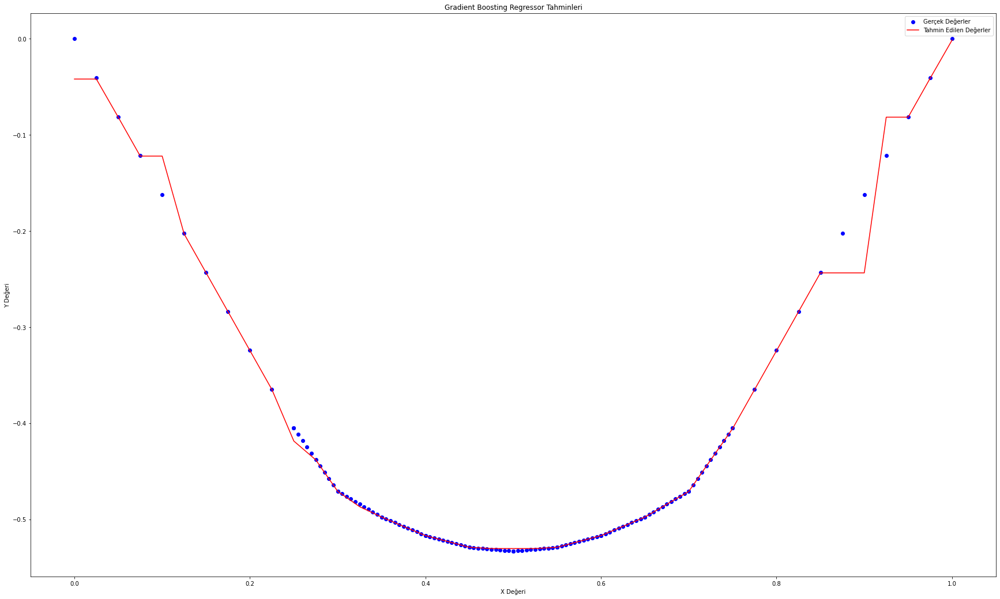

[-0.42]


In [130]:
gb_reg_N12 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_N12.fit(X_train_N12, y_train_N12)

y_pred_N12 = gb_reg_N12.predict(X_test_N12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N12.reshape(len(y_pred_N12),1), y_test_N12.reshape(len(y_test_N12),1)),1))


print(r2_score(y_test_N12, y_pred_N12))

# Use test and show results of test set
y_hat_N12 = gb_reg_N12.predict(X_N12)
mae = metrics.mean_absolute_error(y_N12,y_hat_N12)
mse = metrics.mean_squared_error(y_N12,y_hat_N12)
mape = np.mean(np.abs((y_N12 - y_hat_N12) / y_N12)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_N12.score(X_N12,y_N12))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N12 = pd.DataFrame({'Gerçek Değerler': y_test_N12, 'Tahmin Edilen Değerler': y_pred_N12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N12 = pd.DataFrame({'Predicted': y_pred_N12, 'Actual': y_test_N12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N12, y_test_N12, color='blue', label='Actual')
plt.plot(X_test_N12, y_pred_N12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_N12, X=X_train_N12, y=y_train_N12, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N12 = np.arange(0, 1.025, 0.025).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_N12 = gb_reg_N12.predict(X_values_N12)

# Gerçek değerler için aynı işlemi yap
y_true_values_N12 = gb_reg_N12.predict(X_N12)

plt.figure(figsize=(30, 18))
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N12, y_pred_values_N12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_N12.predict([[0.250]])) #0.250 == -4.049136e-01 gerçek değerde

### SupportVectorRegressor deneyelim

[[-0.48 -0.53]
 [-0.48 -0.52]
 [-0.41 -0.46]
 [-0.45 -0.49]
 [-0.48 -0.53]
 [-0.39 -0.42]
 [-0.48 -0.53]
 [-0.1  -0.12]
 [-0.48 -0.53]
 [-0.44 -0.48]
 [-0.47 -0.52]
 [-0.44 -0.48]
 [-0.48 -0.52]
 [-0.15 -0.16]
 [-0.45 -0.5 ]
 [-0.45 -0.49]
 [-0.46 -0.5 ]
 [-0.48 -0.52]
 [-0.47 -0.51]
 [-0.48 -0.53]
 [-0.41 -0.45]
 [-0.37 -0.4 ]
 [-0.47 -0.51]
 [-0.37 -0.4 ]
 [-0.42 -0.47]
 [-0.48 -0.53]
 [-0.14 -0.16]
 [-0.46 -0.5 ]
 [-0.46 -0.5 ]
 [-0.09  0.  ]
 [-0.37 -0.41]
 [-0.18 -0.2 ]
 [-0.48 -0.53]]
0.8973928618863507
TEST SET
MAE:                 0.04215770505682456
RMSE:                0.04326908390236985
MAPE:                inf
r2:                  0.8812141414174955


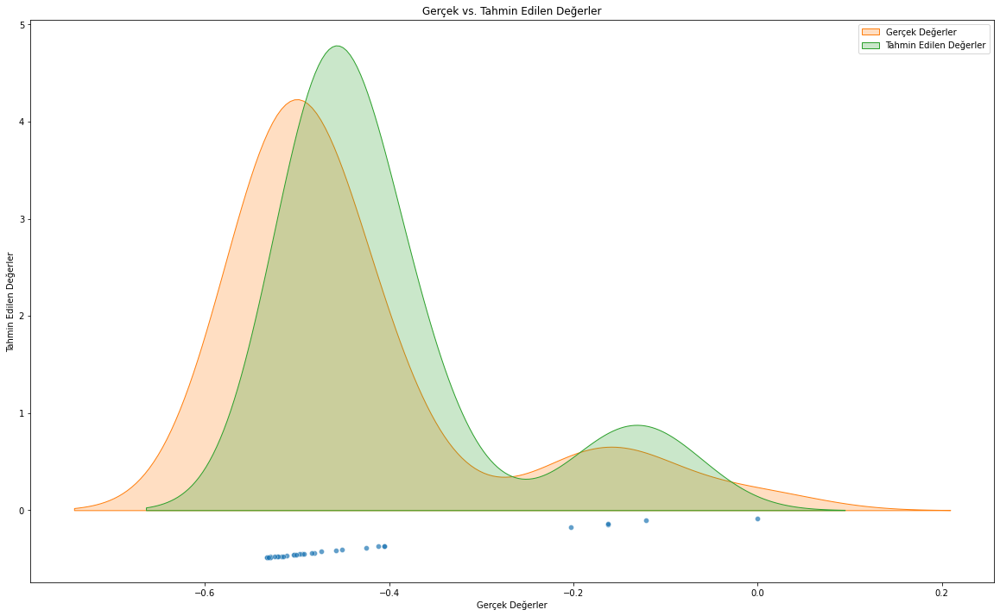

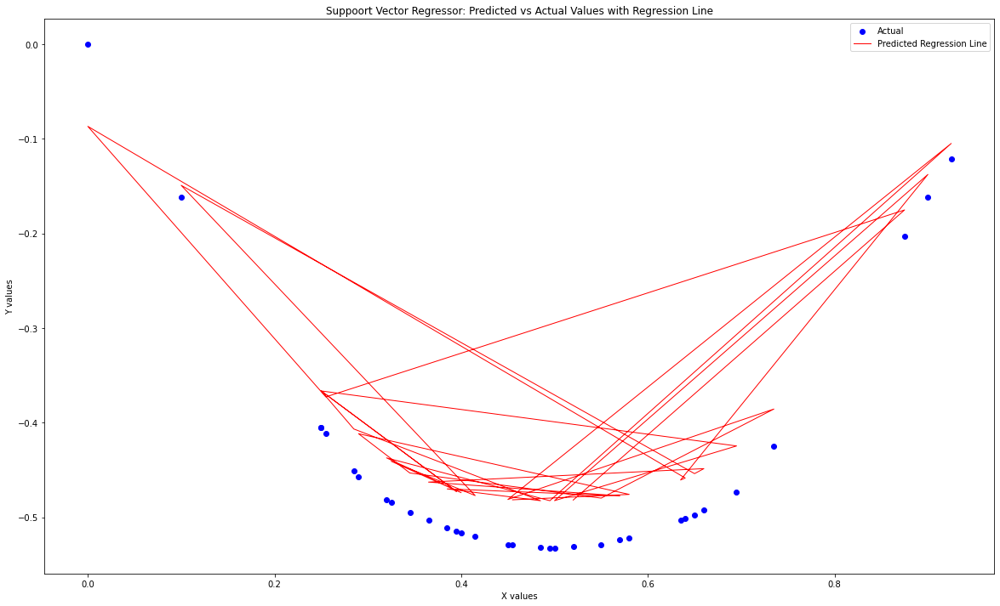

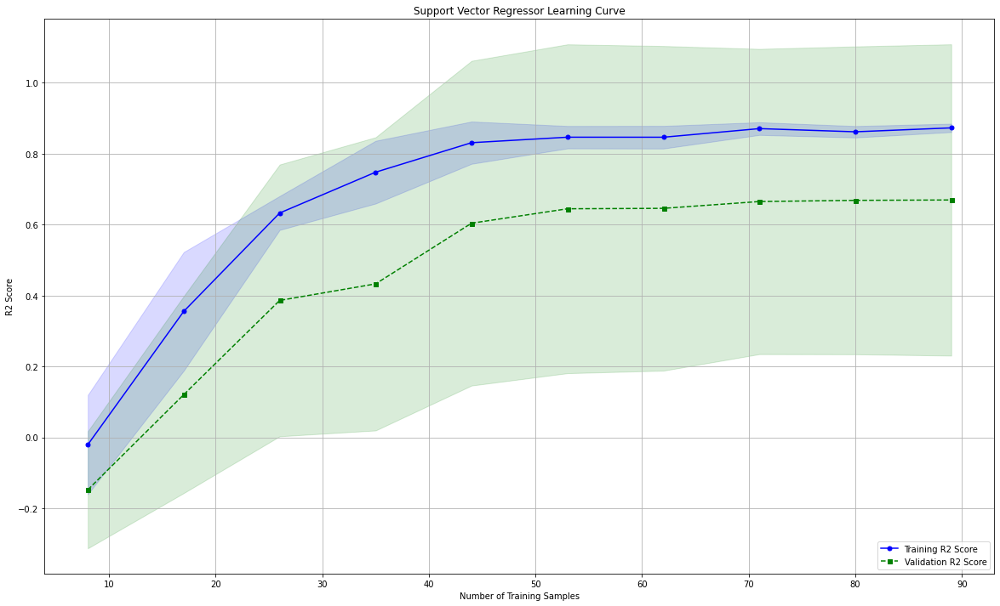

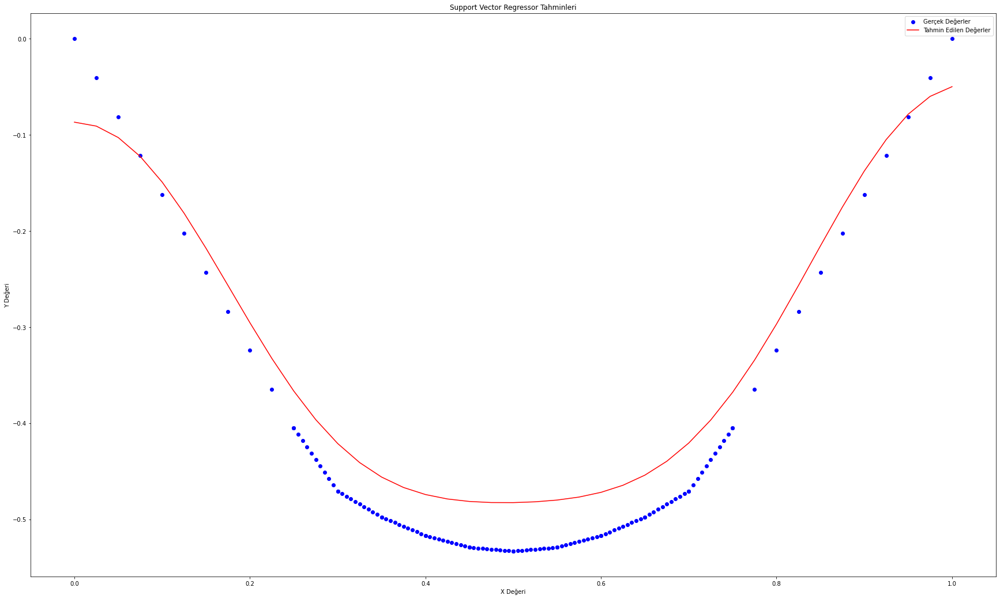

[-0.37]


In [131]:
svr_reg_N12 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_N12.fit(X_train_N12, y_train_N12)

y_pred_N12 = svr_reg_N12.predict(X_test_N12)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N12.reshape(len(y_pred_N12),1), y_test_N12.reshape(len(y_test_N12),1)),1))


print(r2_score(y_test_N12, y_pred_N12))


# Use test and show results of test set
y_hat_N12 = svr_reg_N12.predict(X_N12)
mae = metrics.mean_absolute_error(y_N12,y_hat_N12)
mse = metrics.mean_squared_error(y_N12,y_hat_N12)
mape = np.mean(np.abs((y_N12 - y_hat_N12) / y_N12)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_N12.score(X_N12,y_N12))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N12 = pd.DataFrame({'Gerçek Değerler': y_test_N12, 'Tahmin Edilen Değerler': y_pred_N12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N12 = pd.DataFrame({'Predicted': y_pred_N12, 'Actual': y_test_N12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N12, y_test_N12, color='blue', label='Actual')
plt.plot(X_test_N12, y_pred_N12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_N12, X=X_train_N12, y=y_train_N12, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N12 = np.arange(0, 1.025, 0.025).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N12 = svr_reg_N12.predict(X_values_N12)

# Gerçek değerler için aynı işlemi yap
y_true_values_N12 = svr_reg_N12.predict(X_N12)

plt.figure(figsize=(30, 18))
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N12, y_pred_values_N12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_N12.predict([[0.250]])) #0.250 == -4.049136e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.9991500070073669
MAE (Polynomial Regression):  0.00287594419135545
RMSE (Polynomial Regression):  0.004026904718789917
MAPE (Polynomial Regression):  inf


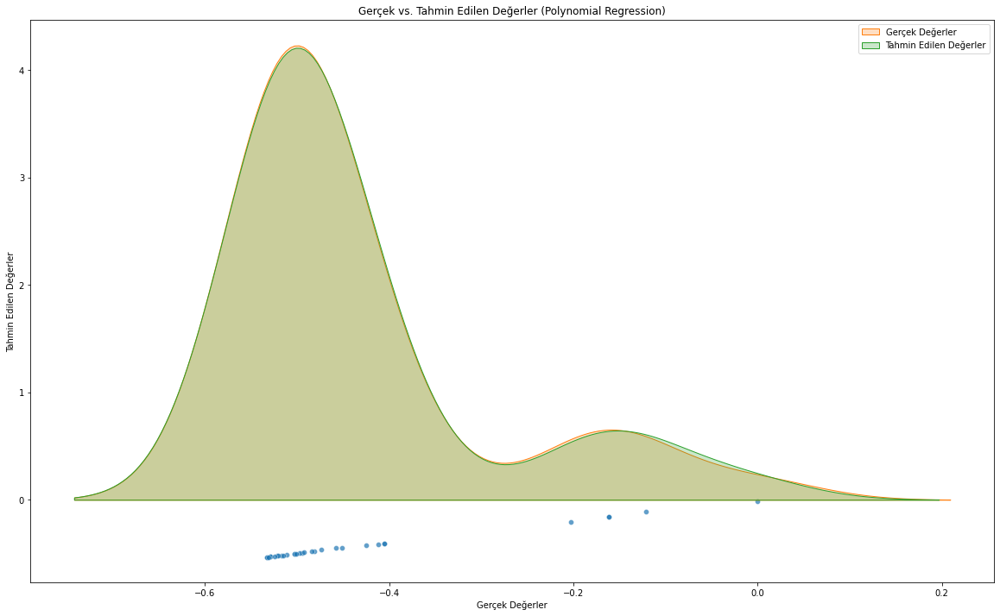

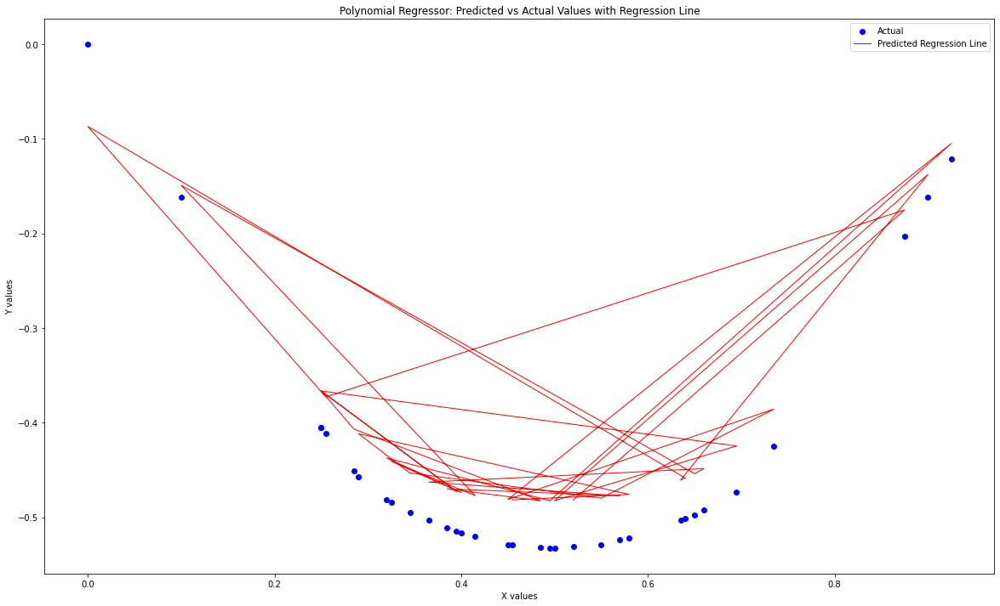

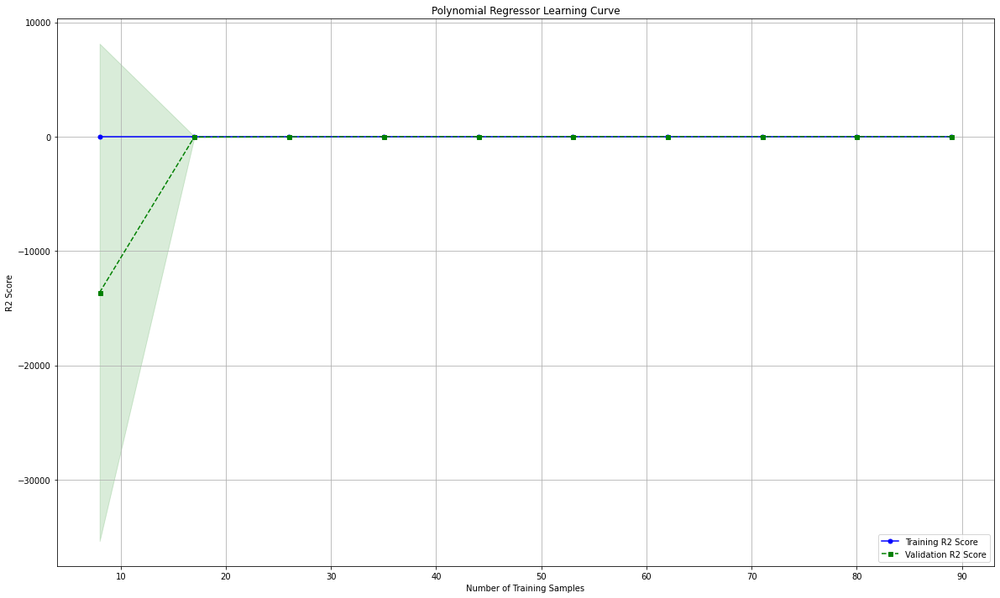

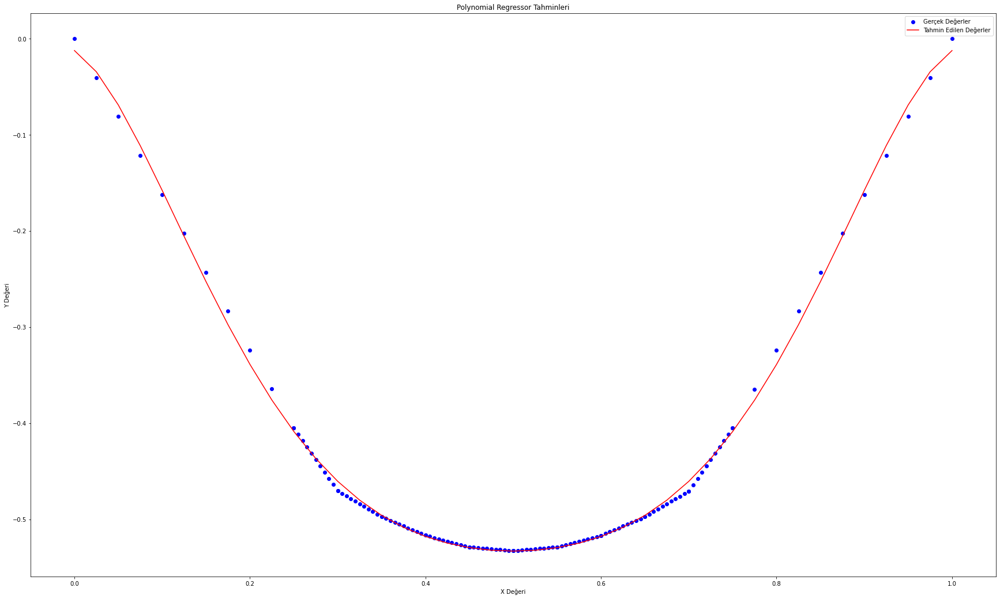

[-0.41]


In [132]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_N12 = PolynomialFeatures(degree=7)
X_poly_N12 = poly_N12.fit_transform(X_N12)

# Lineer Regresyon modeli oluşturma
poly_reg_N12 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_N12.fit(X_N12, y_N12)

# Tahminler yapma
y_pred_poly_N12 = poly_reg_N12.predict(X_test_N12)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_N12, y_pred_poly_N12))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_N12, y_pred_poly_N12))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_N12, y_pred_poly_N12)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_N12 - y_pred_poly_N12) / y_test_N12)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_N12 = pd.DataFrame({'Gerçek Değerler': y_test_N12, 'Tahmin Edilen Değerler': y_pred_poly_N12})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_N12, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N12['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_N12 = pd.DataFrame({'Predicted': y_pred_N12, 'Actual': y_test_N12})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N12, y_test_N12, color='blue', label='Actual')
plt.plot(X_test_N12, y_pred_N12, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_N12, X=X_train_N12, y=y_train_N12, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N12 = np.arange(0, 1.025, 0.025).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N12 = poly_reg_N12.predict(X_values_N12)

# Gerçek değerler için aynı işlemi yap
y_true_values_N12 = poly_reg_N12.predict(X_N12)

plt.figure(figsize=(30, 18))
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N12, y_pred_values_N12, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_N12.predict([[0.250]])) #0.250 == -4.049136e-01 gerçek değerde

### Multi-Layer Perceptron


In [133]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_N12, y_train_N12,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test_N12)

Epoch 1/100
3/3 [==============================] - 1s 62ms/step - loss: 0.2210 - mae: 0.4573 - val_loss: 0.2032 - val_mae: 0.4258
Epoch 2/100
3/3 [==============================] - 0s 14ms/step - loss: 0.2183 - mae: 0.4543 - val_loss: 0.2007 - val_mae: 0.4231
Epoch 3/100
3/3 [==============================] - 0s 14ms/step - loss: 0.2156 - mae: 0.4514 - val_loss: 0.1982 - val_mae: 0.4203
Epoch 4/100
3/3 [==============================] - 0s 13ms/step - loss: 0.2129 - mae: 0.4484 - val_loss: 0.1957 - val_mae: 0.4176
Epoch 5/100
3/3 [==============================] - 0s 14ms/step - loss: 0.2102 - mae: 0.4454 - val_loss: 0.1932 - val_mae: 0.4148
Epoch 6/100
3/3 [==============================] - 0s 14ms/step - loss: 0.2076 - mae: 0.4424 - val_loss: 0.1907 - val_mae: 0.4120
Epoch 7/100
3/3 [==============================] - 0s 13ms/step - loss: 0.2049 - mae: 0.4394 - val_loss: 0.1883 - val_mae: 0.4093
Epoch 8/100
3/3 [==============================] - 0s 14ms/step - loss: 0.2024 - mae: 0.43

3/3 [==============================] - 0s 14ms/step - loss: 0.0948 - mae: 0.2953 - val_loss: 0.0881 - val_mae: 0.2883
Epoch 64/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0935 - mae: 0.2931 - val_loss: 0.0868 - val_mae: 0.2865
Epoch 65/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0921 - mae: 0.2909 - val_loss: 0.0857 - val_mae: 0.2847
Epoch 66/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0908 - mae: 0.2887 - val_loss: 0.0845 - val_mae: 0.2829
Epoch 67/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0895 - mae: 0.2866 - val_loss: 0.0833 - val_mae: 0.2812
Epoch 68/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0882 - mae: 0.2845 - val_loss: 0.0822 - val_mae: 0.2794
Epoch 69/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0869 - mae: 0.2823 - val_loss: 0.0811 - val_mae: 0.2776
Epoch 70/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0857 - mae: 0.2802 - 

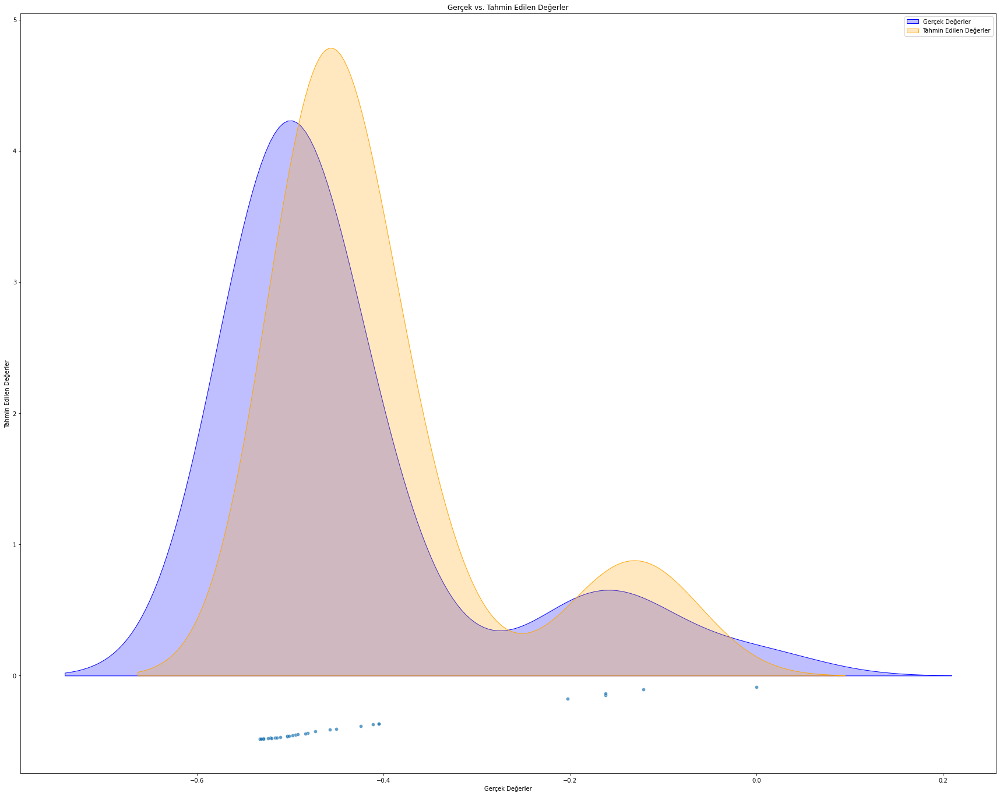

In [134]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_N12 = pd.DataFrame({'Gerçek Değerler': y_test_N12.flatten(), 'Tahmin Edilen Değerler': y_pred_N12.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N12, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N12['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
3/3 [==============================] - 0s 28ms/step - loss: 0.0535 - mae: 0.2214 - val_loss: 0.0557 - val_mae: 0.2322
Epoch 2/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0527 - mae: 0.2197 - val_loss: 0.0550 - val_mae: 0.2307
Epoch 3/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0520 - mae: 0.2182 - val_loss: 0.0543 - val_mae: 0.2292
Epoch 4/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0512 - mae: 0.2166 - val_loss: 0.0536 - val_mae: 0.2276
Epoch 5/50
3/3 [==============================] - 0s 14ms/step - loss: 0.0505 - mae: 0.2151 - val_loss: 0.0530 - val_mae: 0.2262
Epoch 6/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0498 - mae: 0.2135 - val_loss: 0.0523 - val_mae: 0.2247
Epoch 7/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0491 - mae: 0.2121 - val_loss: 0.0517 - val_mae: 0.2232
Epoch 8/50
3/3 [==============================] - 0s 13ms/step - loss: 0.0484 - mae: 0.2106 - val

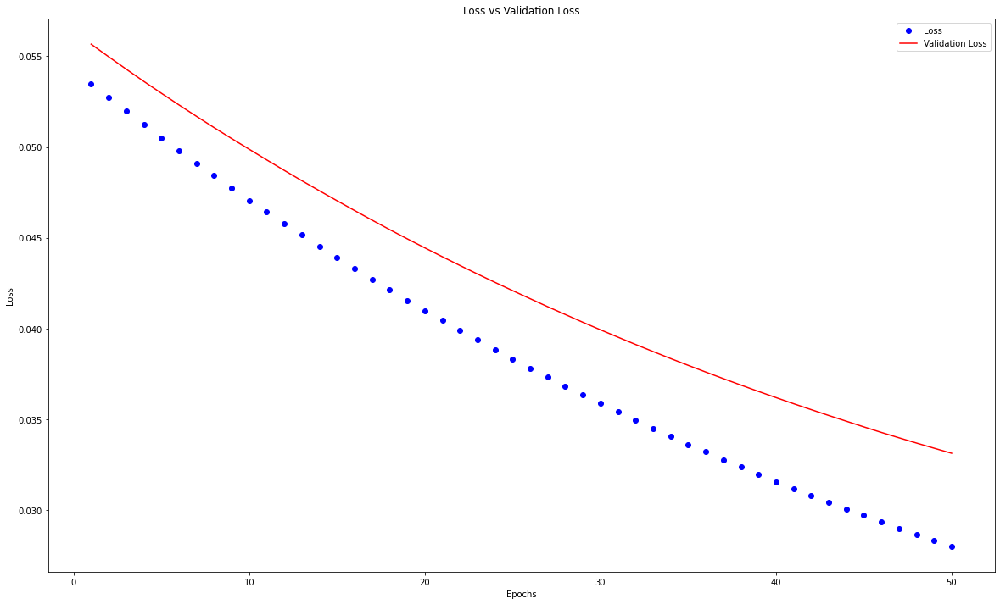

In [135]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_N12, y_train_N12, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması

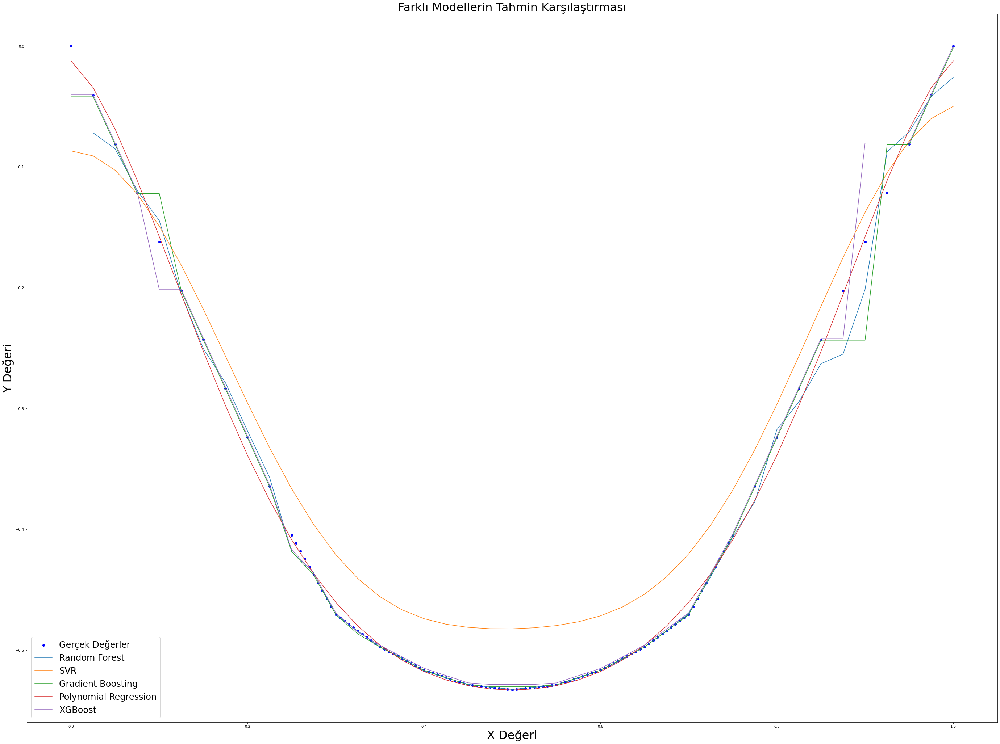

In [136]:
y_pred_rf_N12 = rf_reg_N12.predict(X_values_N12)
y_pred_svr_N12 = svr_reg_N12.predict(X_values_N12)  
y_pred_gb_N12 = gb_reg_N12.predict(X_values_N12)
y_pred_poly_N12 = poly_reg_N12.predict(X_values_N12)
y_pred_xgb_N12 = xgb_N12.predict(X_values_N12)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_N12, y_N12, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_N12, y_pred_rf_N12, label='Random Forest')
plt.plot(X_values_N12, y_pred_svr_N12, label='SVR')
plt.plot(X_values_N12, y_pred_gb_N12, label='Gradient Boosting')
plt.plot(X_values_N12, y_pred_poly_N12, label='Polynomial Regression')
plt.plot(X_values_N12, y_pred_xgb_N12, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

### N14 Verileri için Modeller

In [137]:
data_N14 = pd.read_excel('N verileri.xlsx')
data_N14 = data_N14.iloc[:, 2:4] # 3. ve 4. kolonları seçelim
data_N14

,N14_FI_X1_iz10_imort,N14_X1_fi
0,0.00,0.000000e+00
1,1.25,0.000000e+00
2,2.50,0.000000e+00
3,3.75,0.000000e+00
4,5.00,0.000000e+00
5,6.25,0.000000e+00
6,7.50,0.000000e+00
7,8.75,0.000000e+00
8,10.00,0.000000e+00
9,11.25,0.000000e+00


In [138]:
data_N14 = data_N14.loc[:153,:] 
data_N14['N14_FI_X1_iz10_imort'] = data_N14['N14_FI_X1_iz10_imort'] / 100 # koordinat değerlerini / 10 yapmam gerekli
data_N14

,N14_FI_X1_iz10_imort,N14_X1_fi
0,0.0000,0.000000e+00
1,0.0125,0.000000e+00
2,0.0250,0.000000e+00
3,0.0375,0.000000e+00
4,0.0500,0.000000e+00
5,0.0625,0.000000e+00
6,0.0750,0.000000e+00
7,0.0875,0.000000e+00
8,0.1000,0.000000e+00
9,0.1125,0.000000e+00


In [139]:
data_N14.columns[data_N14.isnull().any()]

Index([], dtype='object')

In [140]:
data_N14.isna().any()

N14_FI_X1_iz10_imort    False
N14_X1_fi               False
dtype: bool

In [141]:
data_N14.describe().T

,count,mean,std,min,25%,50%,75%,max
N14_FI_X1_iz10_imort,154.0,0.500000,0.238793,0.000000,0.32625,0.500000,0.67375,1.000000e+00
N14_X1_fi,154.0,-0.364675,0.186186,-0.509713,-0.49531,-0.456783,-0.30882,5.752827e-09


### veri kontrol edildi, problem yok


In [142]:
X_N14 = data_N14.iloc[:, :1].values
y_N14 = data_N14.iloc[:,1].values

In [143]:
X_N14.shape, y_N14.shape

((154, 1), (154,))

In [144]:
X_train_N14, X_test_N14, y_train_N14, y_test_N14 = train_test_split(X_N14, y_N14, test_size=0.25, random_state=42)

### RandomForestRegressor

[[-1.29e-01 -1.54e-01]
 [-4.98e-01 -4.98e-01]
 [ 0.00e+00  0.00e+00]
 [-4.81e-01 -4.80e-01]
 [-4.72e-01 -4.72e-01]
 [-5.04e-01 -5.06e-01]
 [-2.65e-01 -2.70e-01]
 [-4.72e-01 -4.74e-01]
 [-4.49e-01 -4.51e-01]
 [-4.92e-01 -4.93e-01]
 [-5.06e-01 -5.06e-01]
 [-8.96e-03  5.75e-09]
 [-3.29e-01 -3.09e-01]
 [ 0.00e+00  0.00e+00]
 [-5.06e-01 -5.06e-01]
 [-5.01e-01 -4.99e-01]
 [-4.42e-01 -4.45e-01]
 [-1.05e-02 -3.86e-02]
 [ 0.00e+00  0.00e+00]
 [-4.61e-01 -4.60e-01]
 [-4.20e-01 -4.25e-01]
 [-4.68e-01 -4.69e-01]
 [-2.79e-01 -2.70e-01]
 [-5.06e-01 -5.06e-01]
 [-1.89e-01 -2.32e-01]
 [-4.25e-01 -4.30e-01]
 [-4.96e-01 -4.95e-01]
 [-4.41e-01 -4.36e-01]
 [-5.10e-01 -5.09e-01]
 [-5.04e-01 -5.06e-01]
 [-5.88e-02 -7.72e-02]
 [-4.51e-01 -4.48e-01]
 [-5.07e-01 -5.07e-01]
 [-4.11e-01 -4.08e-01]
 [-3.88e-01 -3.86e-01]
 [ 0.00e+00  0.00e+00]
 [-4.93e-01 -4.94e-01]
 [-3.87e-01 -3.86e-01]
 [-4.90e-01 -4.89e-01]]
0.9966289975022898
TEST SET
MAE:                 0.0023316366698995813
RMSE:                0.00611675

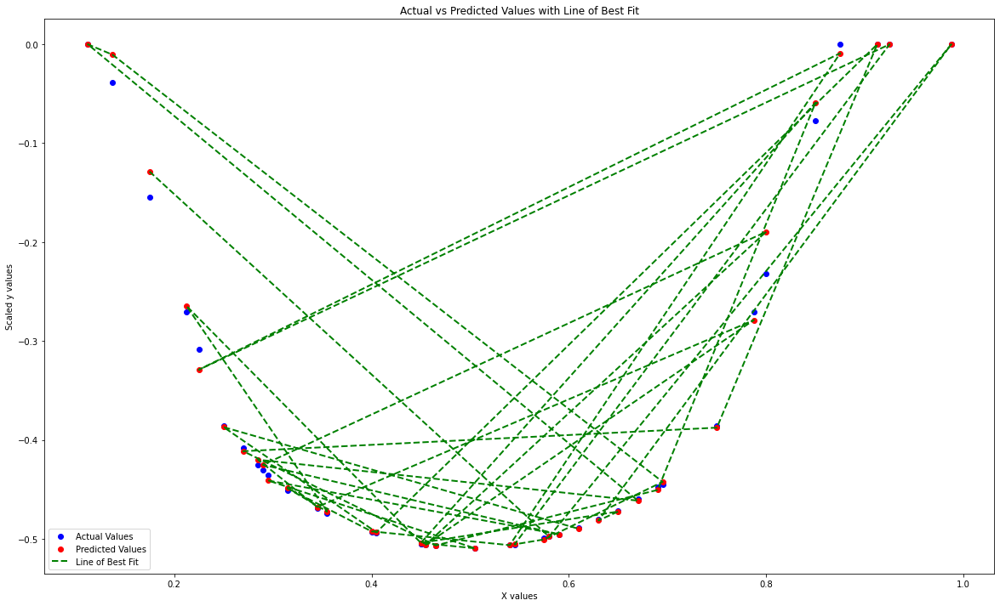

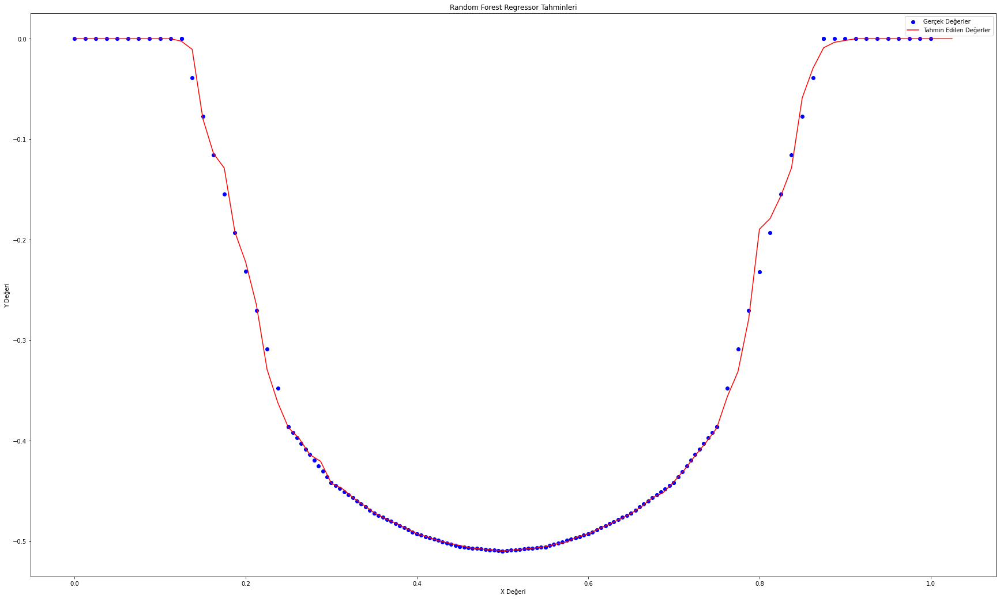

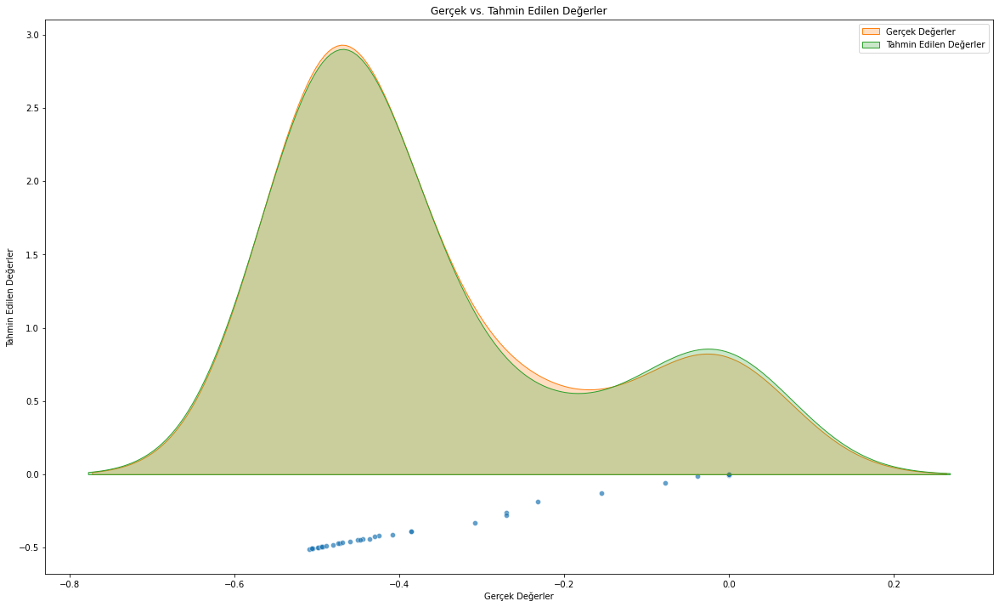

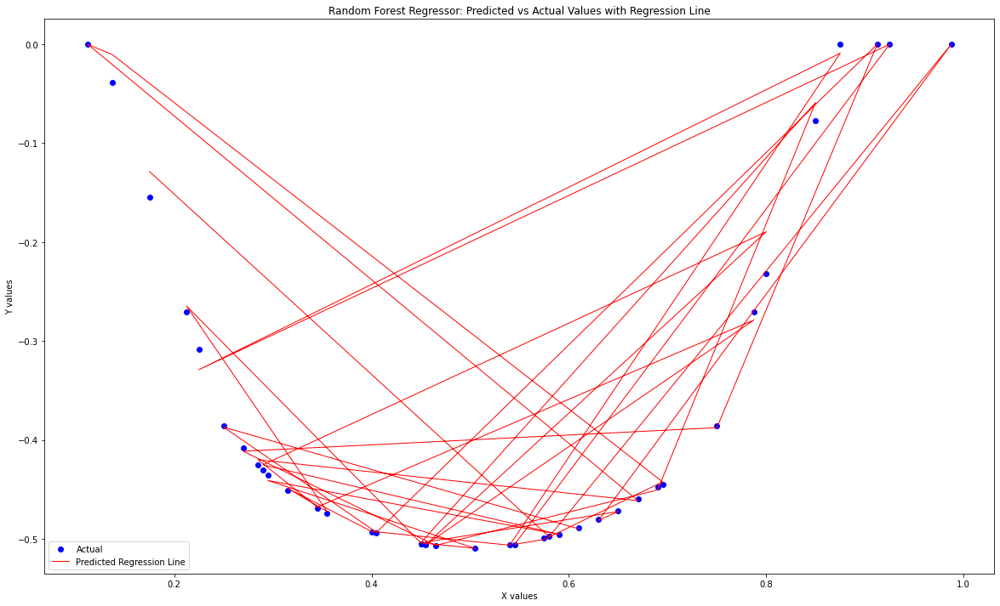

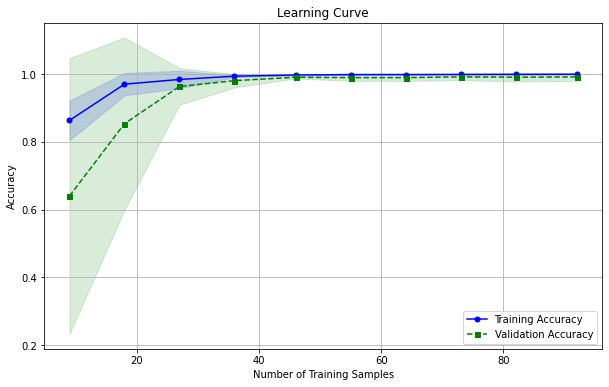

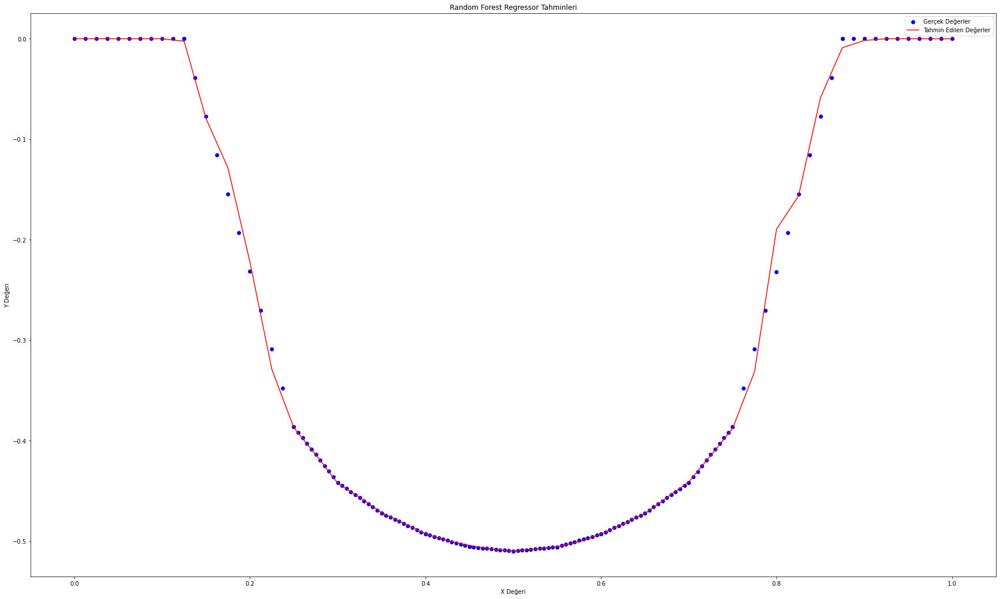

[-0.39]


In [145]:
rf_reg_N14 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_N14.fit(X_train_N14, y_train_N14)

y_pred_N14 = rf_reg_N14.predict(X_test_N14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N14.reshape(len(y_pred_N14),1), y_test_N14.reshape(len(y_test_N14),1)),1))

print(r2_score(y_test_N14, y_pred_N14))

# Use test and show results of test set
y_hat_N14 = rf_reg_N14.predict(X_N14)
mae = metrics.mean_absolute_error(y_N14,y_hat_N14)
mse = metrics.mean_squared_error(y_N14,y_hat_N14)
mape = np.mean(np.abs((y_N14 - y_hat_N14) / y_N14)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_N14.score(X_N14,y_N14))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_N14, y_test_N14, color='blue', label='Actual Values')
plt.scatter(X_test_N14, y_pred_N14, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_N14, y_pred_N14, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N14 = np.arange(0, 1.03125, 0.0125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N14 = rf_reg_N14.predict(X_values_N14)

# Gerçek değerler için aynı işlemi yap
y_true_values_N14 = rf_reg_N14.predict(X_N14)

plt.figure(figsize=(30, 18))
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N14, y_pred_values_N14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N14 = pd.DataFrame({'Gerçek Değerler': y_test_N14, 'Tahmin Edilen Değerler': y_pred_N14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N14 = pd.DataFrame({'Predicted': y_pred_N14, 'Actual': y_test_N14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N14, y_test_N14, color='blue', label='Actual')
plt.plot(X_test_N14, y_pred_N14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_N14, X=X_train_N14, y=y_train_N14, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N14 = np.arange(0, 1.025, 0.025).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N14 = rf_reg_N14.predict(X_values_N14)

# Gerçek değerler için aynı işlemi yap
y_true_values_N14 = rf_reg_N14.predict(X_N14)

plt.figure(figsize=(30, 18))
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N14, y_pred_values_N14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_N14.predict([[0.250]])) #0.250 == -3.860118e-01 gerçek değerde

### XGBRegressor ile deneyelim

[[-1.92e-01 -1.54e-01]
 [-4.95e-01 -4.98e-01]
 [ 6.25e-04  0.00e+00]
 [-4.77e-01 -4.80e-01]
 [-4.71e-01 -4.72e-01]
 [-5.03e-01 -5.06e-01]
 [-2.31e-01 -2.70e-01]
 [-4.71e-01 -4.74e-01]
 [-4.52e-01 -4.51e-01]
 [-4.91e-01 -4.93e-01]
 [-5.05e-01 -5.06e-01]
 [ 6.25e-04  5.75e-09]
 [-3.46e-01 -3.09e-01]
 [ 6.25e-04  0.00e+00]
 [-5.04e-01 -5.06e-01]
 [-4.99e-01 -4.99e-01]
 [-4.40e-01 -4.45e-01]
 [-7.62e-02 -3.86e-02]
 [ 6.92e-04  0.00e+00]
 [-4.55e-01 -4.60e-01]
 [-4.18e-01 -4.25e-01]
 [-4.71e-01 -4.69e-01]
 [-3.08e-01 -2.70e-01]
 [-5.05e-01 -5.06e-01]
 [-1.92e-01 -2.32e-01]
 [-4.18e-01 -4.30e-01]
 [-4.95e-01 -4.95e-01]
 [-4.40e-01 -4.36e-01]
 [-5.06e-01 -5.09e-01]
 [-5.03e-01 -5.06e-01]
 [-3.77e-02 -7.72e-02]
 [-4.49e-01 -4.48e-01]
 [-5.05e-01 -5.07e-01]
 [-4.13e-01 -4.08e-01]
 [-3.85e-01 -3.86e-01]
 [ 6.25e-04  0.00e+00]
 [-4.94e-01 -4.94e-01]
 [-3.85e-01 -3.86e-01]
 [-4.85e-01 -4.89e-01]]
0.9915831753827523
TEST SET
MAE:                 0.0032953457178924225
RMSE:                0.00843815

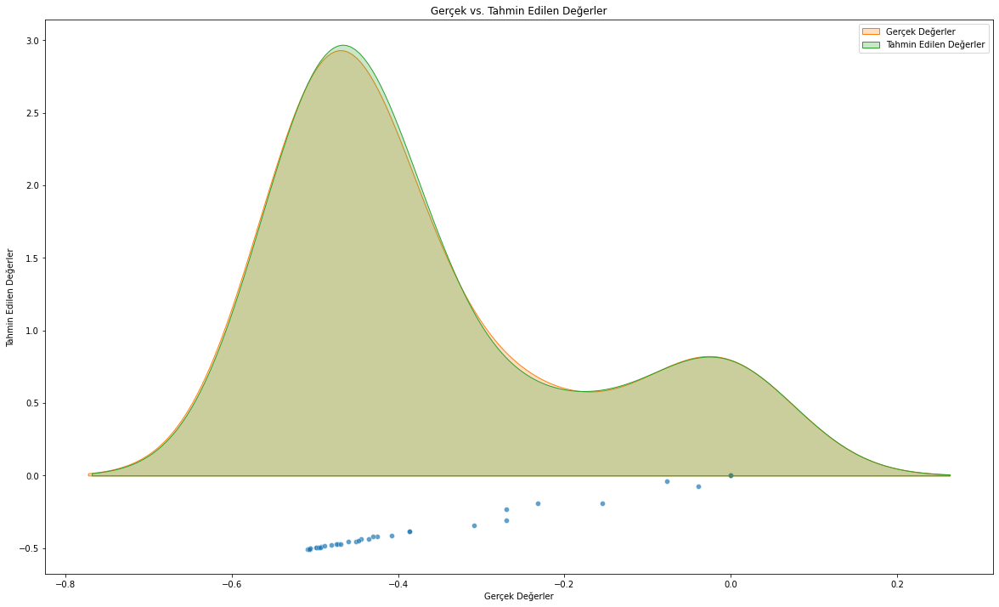

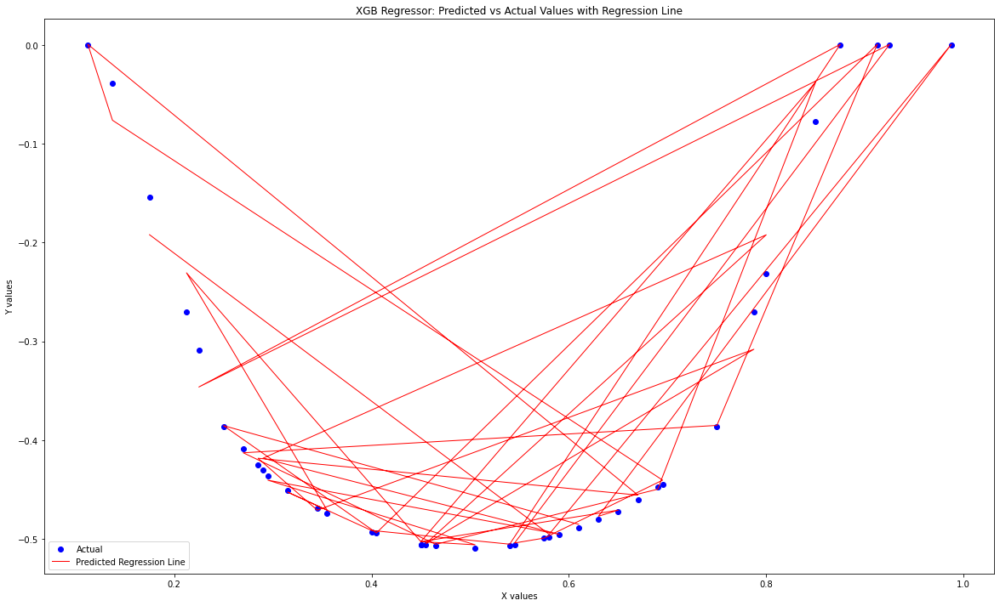

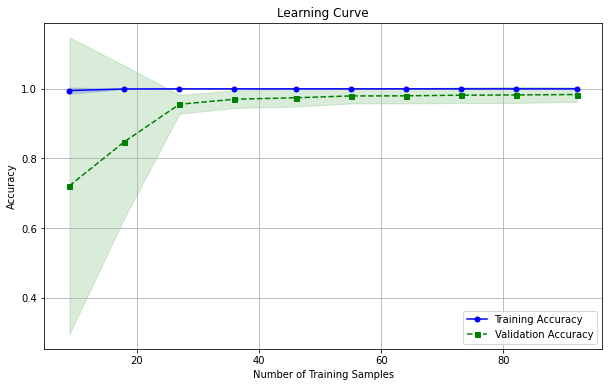

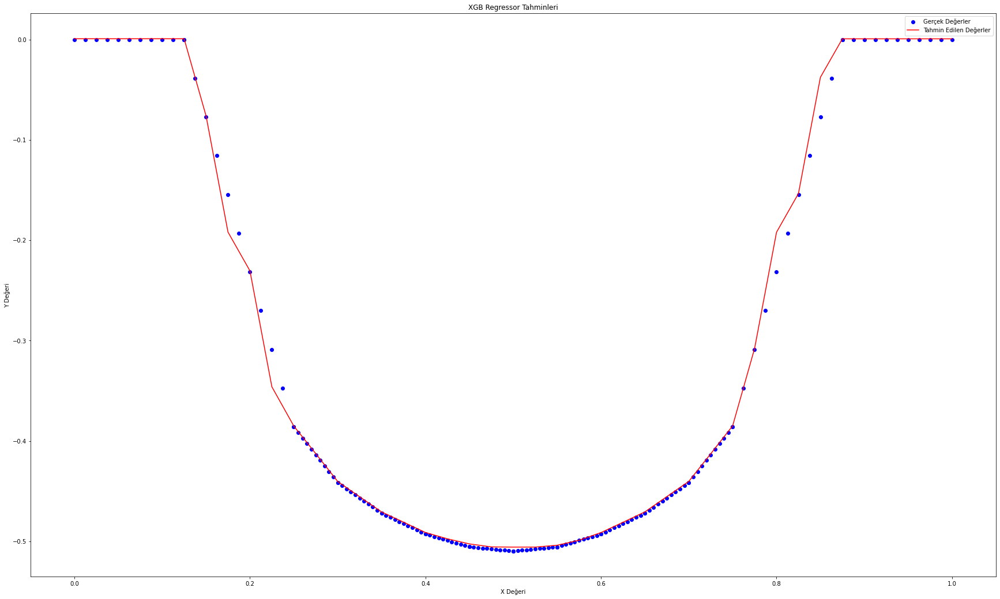

[-0.39]


In [146]:
from xgboost import XGBRegressor


xgb_N14 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_N14.fit(X_train_N14, y_train_N14)

y_pred_N14 = xgb_N14.predict(X_test_N14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N14.reshape(len(y_pred_N14),1), y_test_N14.reshape(len(y_test_N14),1)),1))


print(r2_score(y_test_N14, y_pred_N14))

# Use test and show results of test set
y_hat_N14 = xgb_N14.predict(X_N14)
mae = metrics.mean_absolute_error(y_N14,y_hat_N14)
mse = metrics.mean_squared_error(y_N14,y_hat_N14)
mape = np.mean(np.abs((y_N14 - y_hat_N14) / y_N14)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_N14.score(X_N14,y_N14))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N14 = pd.DataFrame({'Gerçek Değerler': y_test_N14, 'Tahmin Edilen Değerler': y_pred_N14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N14 = pd.DataFrame({'Predicted': y_pred_N14, 'Actual': y_test_N14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N14, y_test_N14, color='blue', label='Actual')
plt.plot(X_test_N14, y_pred_N14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_N14, X=X_train_N14, y=y_train_N14, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N14 = np.arange(0, 1.025, 0.025).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_N14 = xgb_N14.predict(X_values_N14)

# Gerçek değerler için aynı işlemi yap
y_true_values_N14 = xgb_N14.predict(X_N14)

plt.figure(figsize=(30, 18))
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N14, y_pred_values_N14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_N14.predict([[0.250]])) #0.250 == -3.860118e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-1.16e-01 -1.54e-01]
 [-4.96e-01 -4.98e-01]
 [-6.58e-04  0.00e+00]
 [-4.82e-01 -4.80e-01]
 [-4.72e-01 -4.72e-01]
 [-5.04e-01 -5.06e-01]
 [-2.32e-01 -2.70e-01]
 [-4.72e-01 -4.74e-01]
 [-4.48e-01 -4.51e-01]
 [-4.93e-01 -4.93e-01]
 [-5.06e-01 -5.06e-01]
 [-6.58e-04  5.75e-09]
 [-3.48e-01 -3.09e-01]
 [-6.58e-04  0.00e+00]
 [-5.05e-01 -5.06e-01]
 [-5.00e-01 -4.99e-01]
 [-4.42e-01 -4.45e-01]
 [-5.47e-04 -3.86e-02]
 [-5.47e-04  0.00e+00]
 [-4.63e-01 -4.60e-01]
 [-4.20e-01 -4.25e-01]
 [-4.66e-01 -4.69e-01]
 [-3.09e-01 -2.70e-01]
 [-5.06e-01 -5.06e-01]
 [-1.93e-01 -2.32e-01]
 [-4.20e-01 -4.30e-01]
 [-4.96e-01 -4.95e-01]
 [-4.42e-01 -4.36e-01]
 [-5.07e-01 -5.09e-01]
 [-5.04e-01 -5.06e-01]
 [-3.90e-02 -7.72e-02]
 [-4.51e-01 -4.48e-01]
 [-5.06e-01 -5.07e-01]
 [-4.14e-01 -4.08e-01]
 [-3.86e-01 -3.86e-01]
 [-6.58e-04  0.00e+00]
 [-4.93e-01 -4.94e-01]
 [-3.86e-01 -3.86e-01]
 [-4.91e-01 -4.89e-01]]
0.9916403012799819
TEST SET
MAE:                 0.002434188478608126
RMSE:                0.008321675

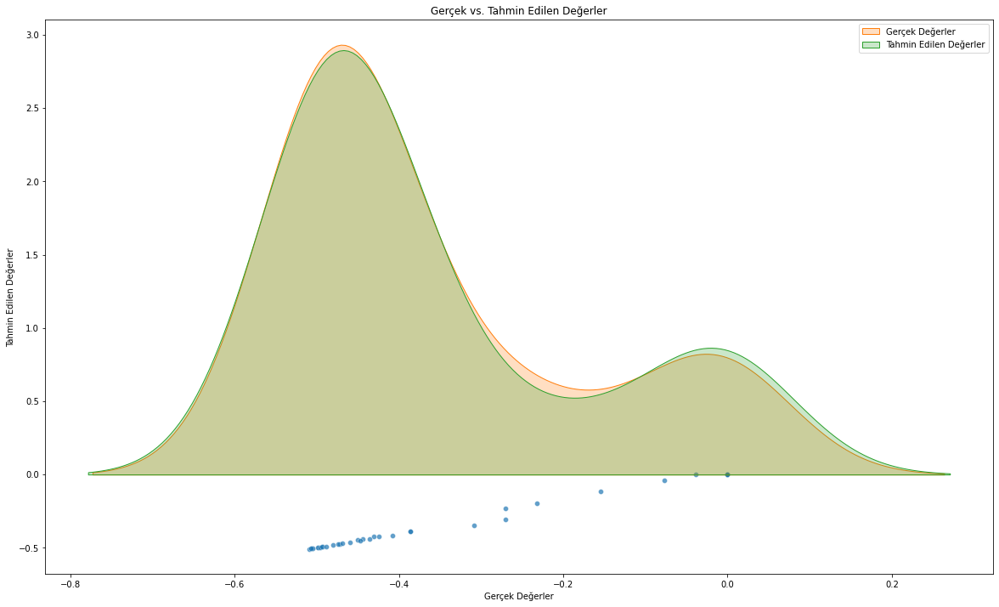

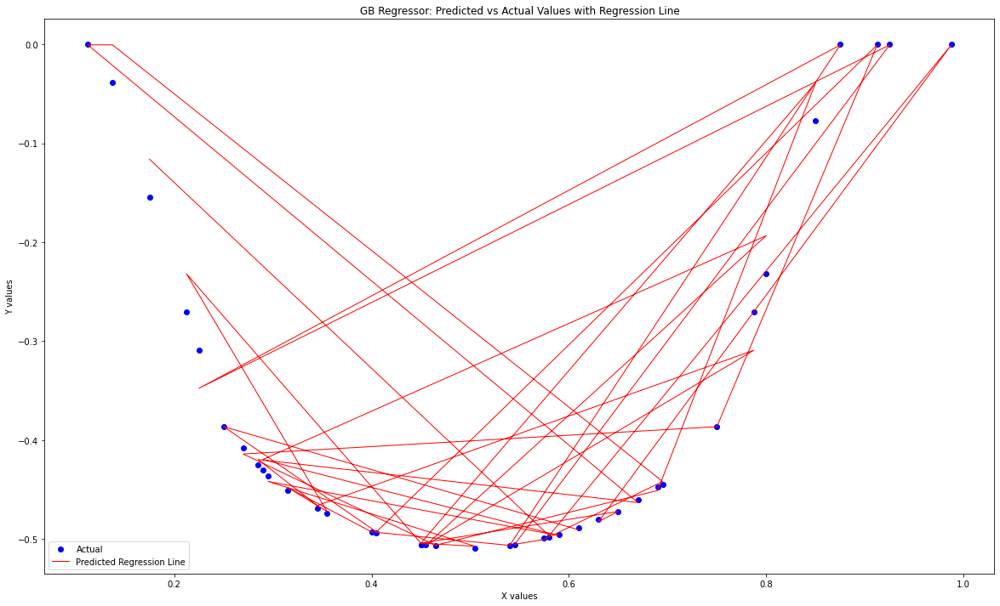

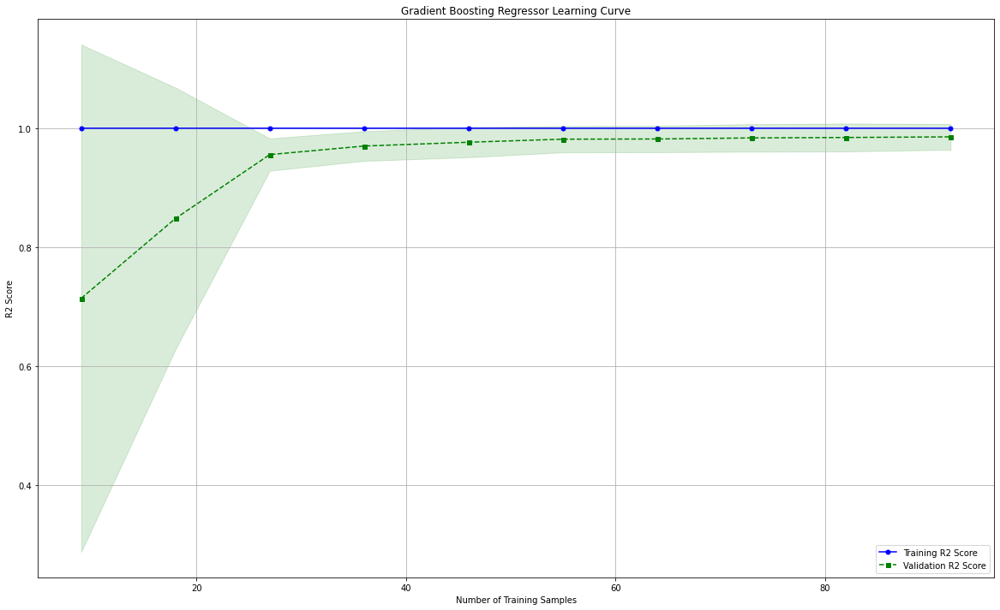

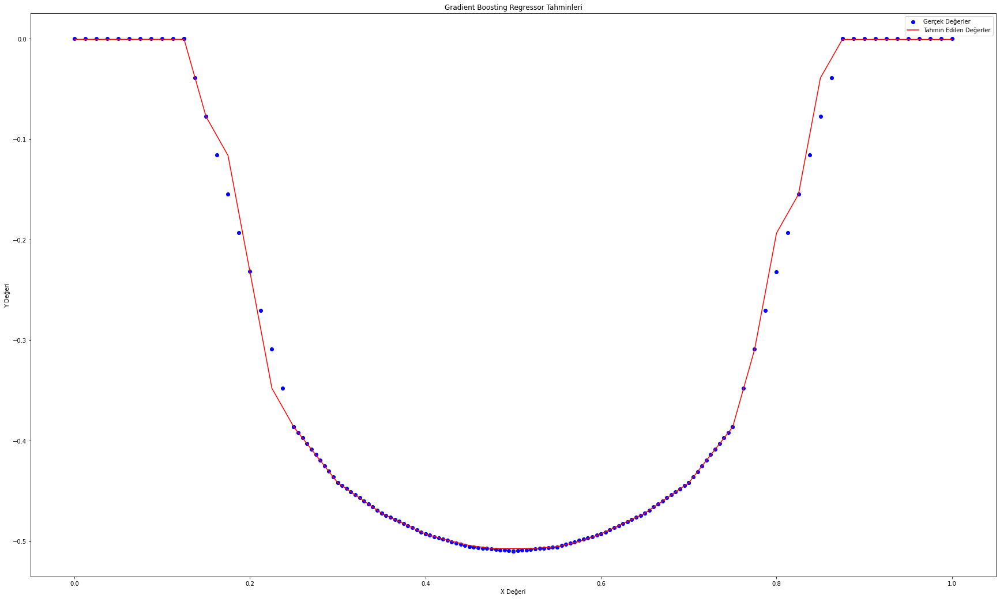

[-0.39]


In [147]:
gb_reg_N14 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_N14.fit(X_train_N14, y_train_N14)

y_pred_N14 = gb_reg_N14.predict(X_test_N14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N14.reshape(len(y_pred_N14),1), y_test_N14.reshape(len(y_test_N14),1)),1))


print(r2_score(y_test_N14, y_pred_N14))

# Use test and show results of test set
y_hat_N14 = gb_reg_N14.predict(X_N14)
mae = metrics.mean_absolute_error(y_N14,y_hat_N14)
mse = metrics.mean_squared_error(y_N14,y_hat_N14)
mape = np.mean(np.abs((y_N14 - y_hat_N14) / y_N14)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_N14.score(X_N14,y_N14))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N14 = pd.DataFrame({'Gerçek Değerler': y_test_N14, 'Tahmin Edilen Değerler': y_pred_N14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N14 = pd.DataFrame({'Predicted': y_pred_N14, 'Actual': y_test_N14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N14, y_test_N14, color='blue', label='Actual')
plt.plot(X_test_N14, y_pred_N14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_N14, X=X_train_N14, y=y_train_N14, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N14 = np.arange(0, 1.025, 0.025).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_N14 = gb_reg_N14.predict(X_values_N14)

# Gerçek değerler için aynı işlemi yap
y_true_values_N14 = gb_reg_N14.predict(X_N14)

plt.figure(figsize=(30, 18))
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N14, y_pred_values_N14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_N14.predict([[0.250]])) #0.250 == -3.860118e-01 gerçek değerde

### SupportVectorRegressor deneyelim

[[-1.59e-01 -1.54e-01]
 [-4.95e-01 -4.98e-01]
 [ 4.91e-02  0.00e+00]
 [-4.86e-01 -4.80e-01]
 [-4.76e-01 -4.72e-01]
 [-4.95e-01 -5.06e-01]
 [-2.50e-01 -2.70e-01]
 [-4.80e-01 -4.74e-01]
 [-4.45e-01 -4.51e-01]
 [-4.95e-01 -4.93e-01]
 [-4.94e-01 -5.06e-01]
 [-5.04e-02  5.75e-09]
 [-2.80e-01 -3.09e-01]
 [ 2.31e-02  0.00e+00]
 [-4.94e-01 -5.06e-01]
 [-4.95e-01 -4.99e-01]
 [-4.31e-01 -4.45e-01]
 [-7.48e-02 -3.86e-02]
 [-2.76e-02  0.00e+00]
 [-4.60e-01 -4.60e-01]
 [-4.02e-01 -4.25e-01]
 [-4.73e-01 -4.69e-01]
 [-2.50e-01 -2.70e-01]
 [-4.94e-01 -5.06e-01]
 [-2.20e-01 -2.32e-01]
 [-4.10e-01 -4.30e-01]
 [-4.95e-01 -4.95e-01]
 [-4.18e-01 -4.36e-01]
 [-4.92e-01 -5.09e-01]
 [-4.95e-01 -5.06e-01]
 [-1.02e-01 -7.72e-02]
 [-4.38e-01 -4.48e-01]
 [-4.94e-01 -5.07e-01]
 [-3.76e-01 -4.08e-01]
 [-3.36e-01 -3.86e-01]
 [ 8.91e-03  0.00e+00]
 [-4.95e-01 -4.94e-01]
 [-3.36e-01 -3.86e-01]
 [-4.92e-01 -4.89e-01]]
0.9851348620444588
TEST SET
MAE:                 0.017351511002399185
RMSE:                0.023289395

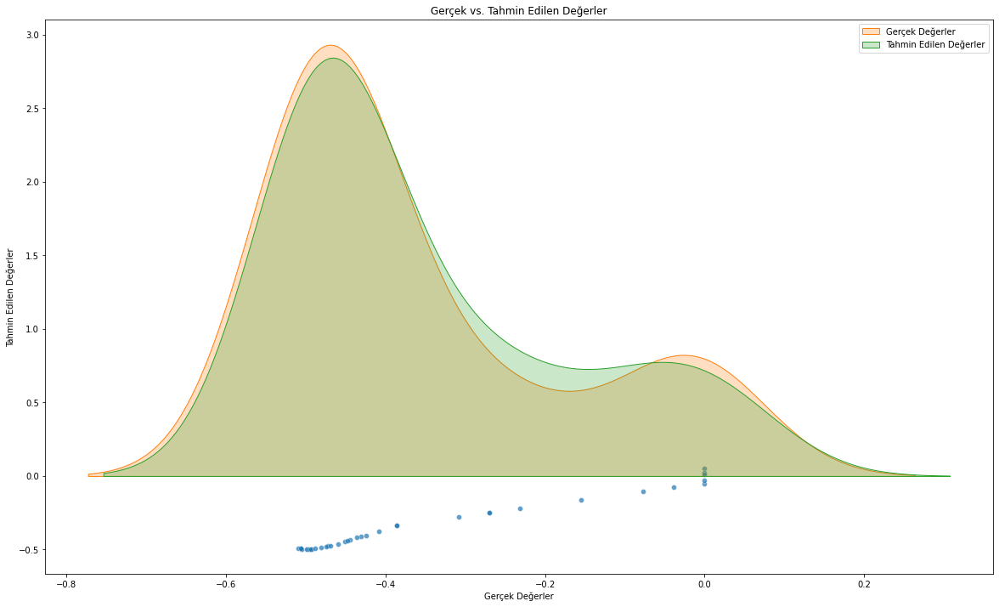

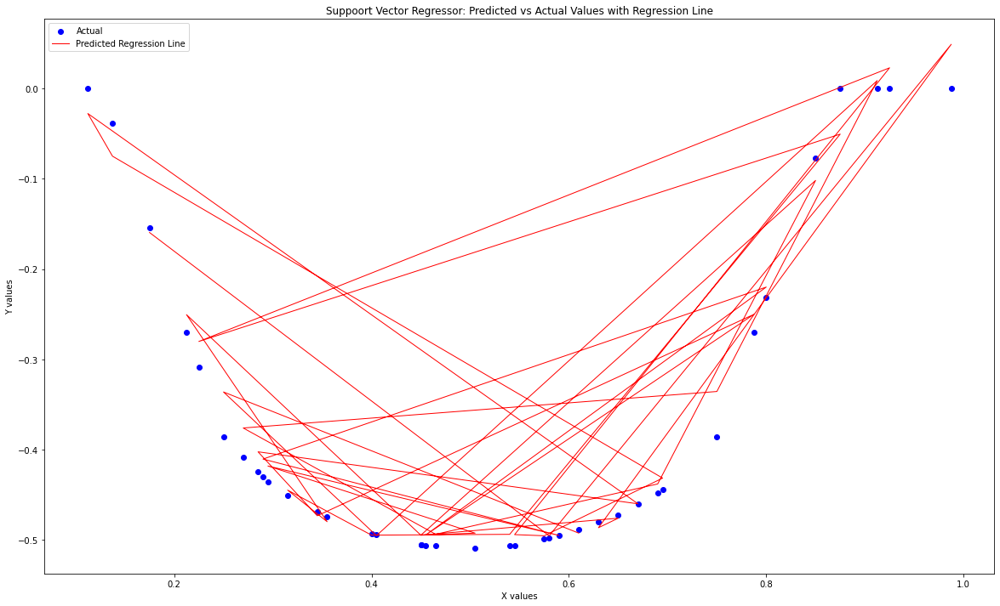

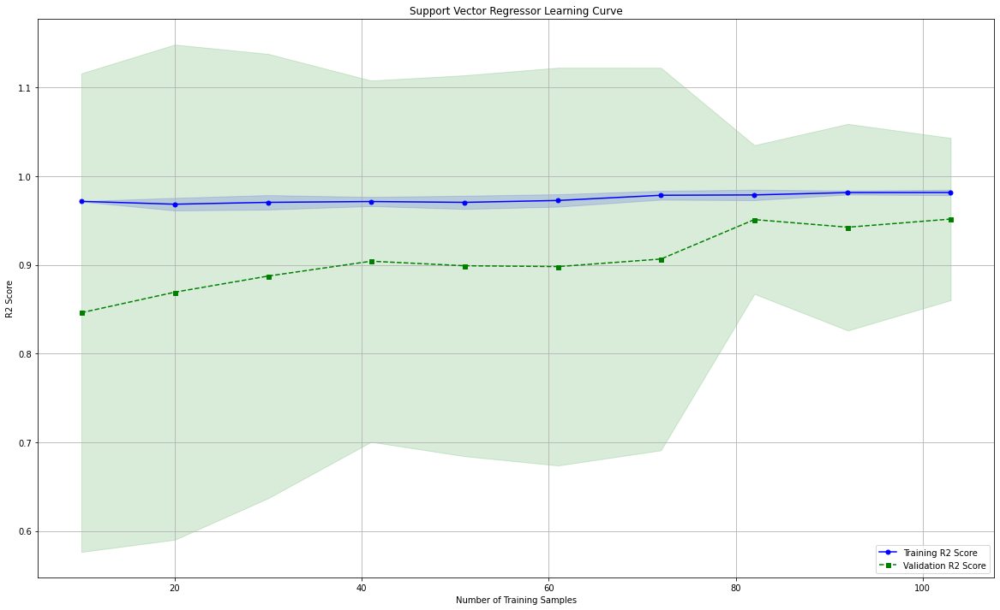

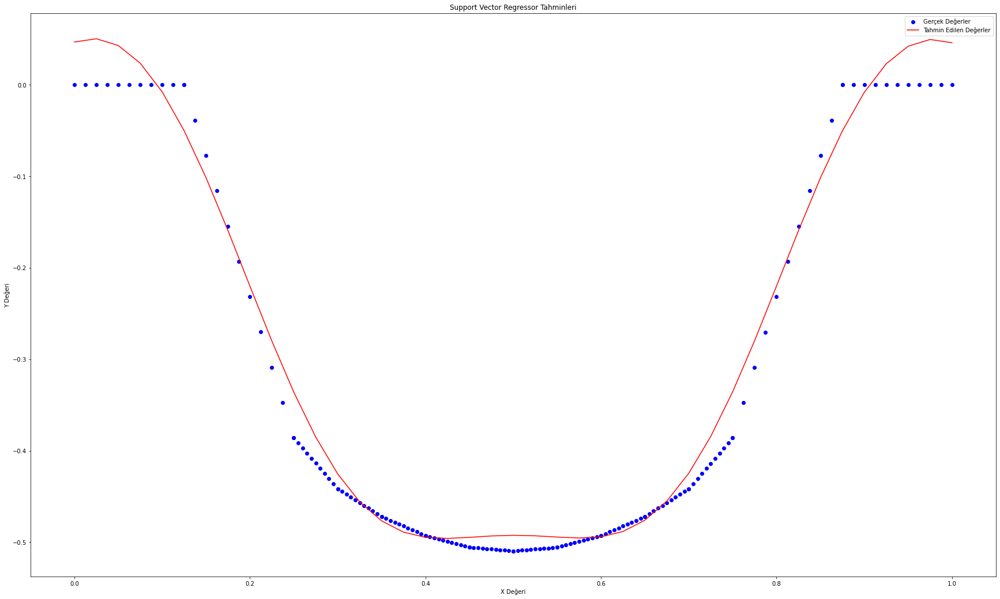

[-0.34]


In [148]:
svr_reg_N14 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_N14.fit(X_train_N14, y_train_N14)

y_pred_N14 = svr_reg_N14.predict(X_test_N14)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N14.reshape(len(y_pred_N14),1), y_test_N14.reshape(len(y_test_N14),1)),1))


print(r2_score(y_test_N14, y_pred_N14))


# Use test and show results of test set
y_hat_N14 = svr_reg_N14.predict(X_N14)
mae = metrics.mean_absolute_error(y_N14,y_hat_N14)
mse = metrics.mean_squared_error(y_N14,y_hat_N14)
mape = np.mean(np.abs((y_N14 - y_hat_N14) / y_N14)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_N14.score(X_N14,y_N14))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N14 = pd.DataFrame({'Gerçek Değerler': y_test_N14, 'Tahmin Edilen Değerler': y_pred_N14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N14 = pd.DataFrame({'Predicted': y_pred_N14, 'Actual': y_test_N14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N14, y_test_N14, color='blue', label='Actual')
plt.plot(X_test_N14, y_pred_N14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_N14, X=X_train_N14, y=y_train_N14, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N14 = np.arange(0, 1.025, 0.025).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N14 = svr_reg_N14.predict(X_values_N14)

# Gerçek değerler için aynı işlemi yap
y_true_values_N14 = svr_reg_N14.predict(X_N14)

plt.figure(figsize=(30, 18))
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N14, y_pred_values_N14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_N14.predict([[0.250]])) #0.250 == -3.860118e-01 gerçek değerde

### PolynomialRegressor ile deneyelim

R2 Score (Polynomial Regression):  0.9890702622512647
MAE (Polynomial Regression):  0.01260713197635261
RMSE (Polynomial Regression):  0.018875520100009653
MAPE (Polynomial Regression):  inf


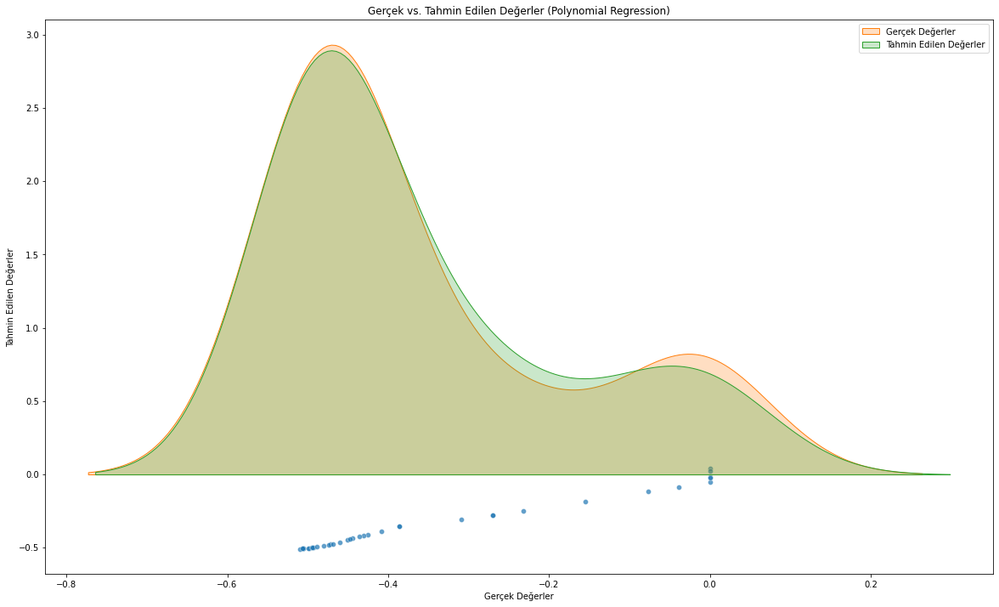

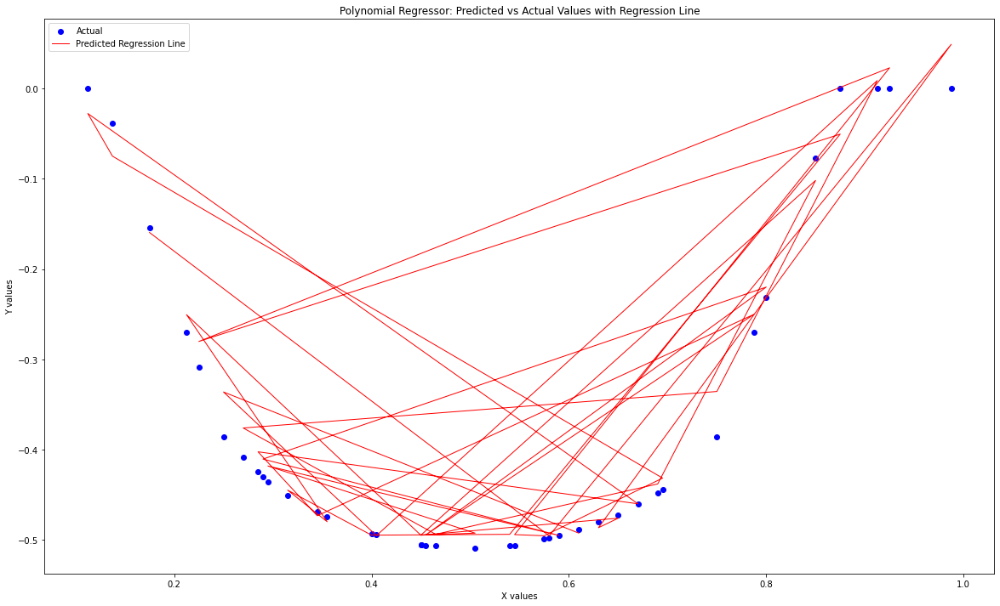

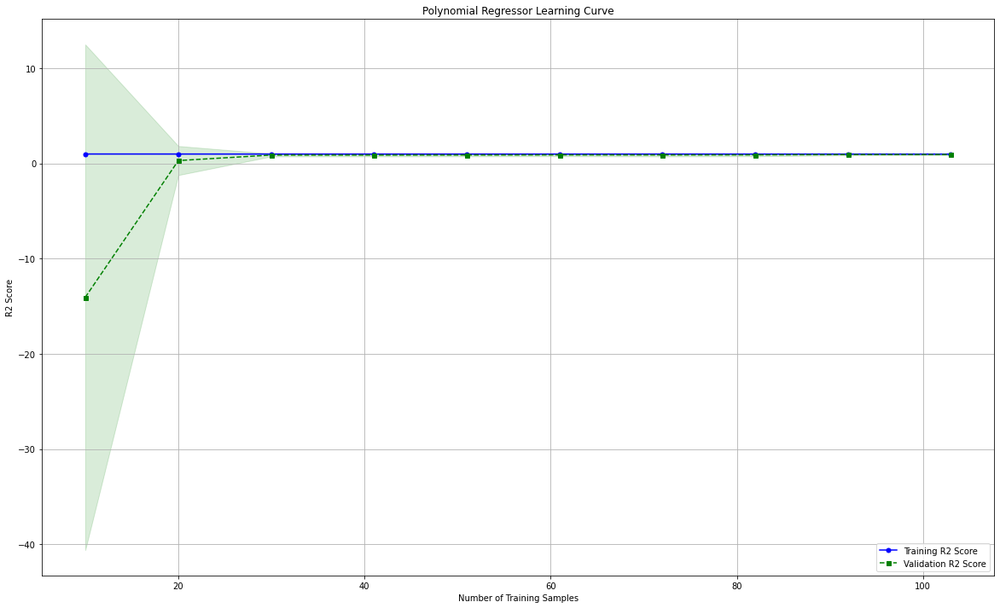

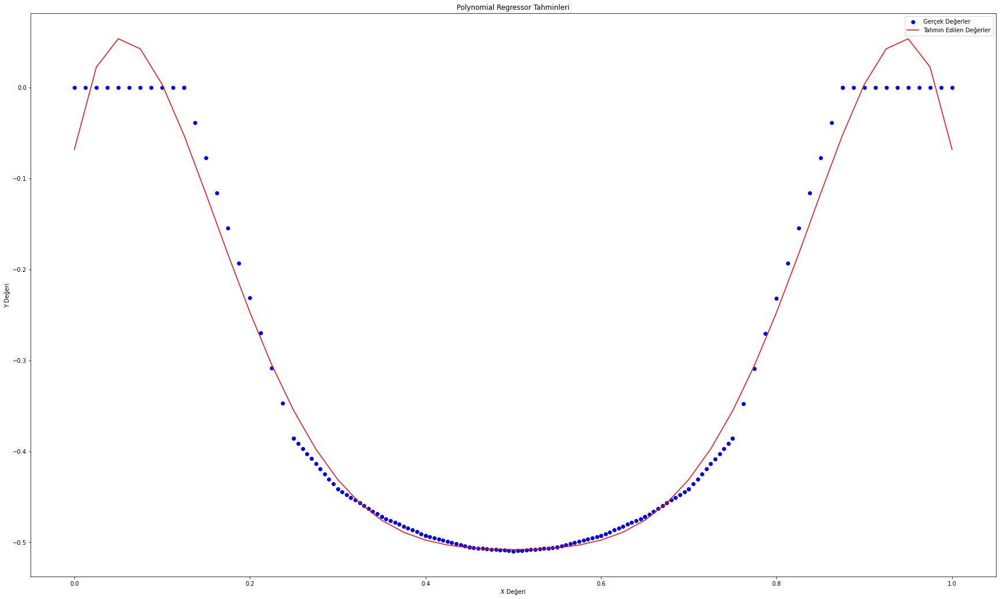

[-0.36]


In [149]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_N14 = PolynomialFeatures(degree=7)
X_poly_N14 = poly_N14.fit_transform(X_N14)

# Lineer Regresyon modeli oluşturma
poly_reg_N14 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_N14.fit(X_N14, y_N14)

# Tahminler yapma
y_pred_poly_N14 = poly_reg_N14.predict(X_test_N14)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_N14, y_pred_poly_N14))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_N14, y_pred_poly_N14))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_N14, y_pred_poly_N14)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_N14 - y_pred_poly_N14) / y_test_N14)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_N14 = pd.DataFrame({'Gerçek Değerler': y_test_N14, 'Tahmin Edilen Değerler': y_pred_poly_N14})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_N14, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N14['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_N14 = pd.DataFrame({'Predicted': y_pred_N14, 'Actual': y_test_N14})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N14, y_test_N14, color='blue', label='Actual')
plt.plot(X_test_N14, y_pred_N14, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_N14, X=X_train_N14, y=y_train_N14, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N14 = np.arange(0, 1.025, 0.025).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N14 = poly_reg_N14.predict(X_values_N14)

# Gerçek değerler için aynı işlemi yap
y_true_values_N14 = poly_reg_N14.predict(X_N14)

plt.figure(figsize=(30, 18))
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N14, y_pred_values_N14, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_N14.predict([[0.250]])) #0.250 == -3.860118e-01 gerçek değerde

### Multi-Layer Perceptron

In [150]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_N14, y_train_N14,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test_N14)

Epoch 1/100
3/3 [==============================] - 1s 62ms/step - loss: 0.1671 - mae: 0.3635 - val_loss: 0.1708 - val_mae: 0.3702
Epoch 2/100
3/3 [==============================] - 0s 13ms/step - loss: 0.1646 - mae: 0.3612 - val_loss: 0.1681 - val_mae: 0.3679
Epoch 3/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1620 - mae: 0.3587 - val_loss: 0.1655 - val_mae: 0.3655
Epoch 4/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1594 - mae: 0.3563 - val_loss: 0.1627 - val_mae: 0.3630
Epoch 5/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1567 - mae: 0.3538 - val_loss: 0.1600 - val_mae: 0.3604
Epoch 6/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1539 - mae: 0.3510 - val_loss: 0.1571 - val_mae: 0.3578
Epoch 7/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1512 - mae: 0.3483 - val_loss: 0.1541 - val_mae: 0.3550
Epoch 8/100
3/3 [==============================] - 0s 14ms/step - loss: 0.1481 - mae: 0.34

3/3 [==============================] - 0s 14ms/step - loss: 0.0344 - mae: 0.1537 - val_loss: 0.0362 - val_mae: 0.1508
Epoch 64/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0344 - mae: 0.1539 - val_loss: 0.0362 - val_mae: 0.1510
Epoch 65/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0344 - mae: 0.1546 - val_loss: 0.0362 - val_mae: 0.1525
Epoch 66/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0344 - mae: 0.1558 - val_loss: 0.0363 - val_mae: 0.1532
Epoch 67/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0344 - mae: 0.1560 - val_loss: 0.0363 - val_mae: 0.1530
Epoch 68/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0343 - mae: 0.1555 - val_loss: 0.0363 - val_mae: 0.1522
Epoch 69/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0343 - mae: 0.1548 - val_loss: 0.0363 - val_mae: 0.1514
Epoch 70/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0343 - mae: 0.1542 - 

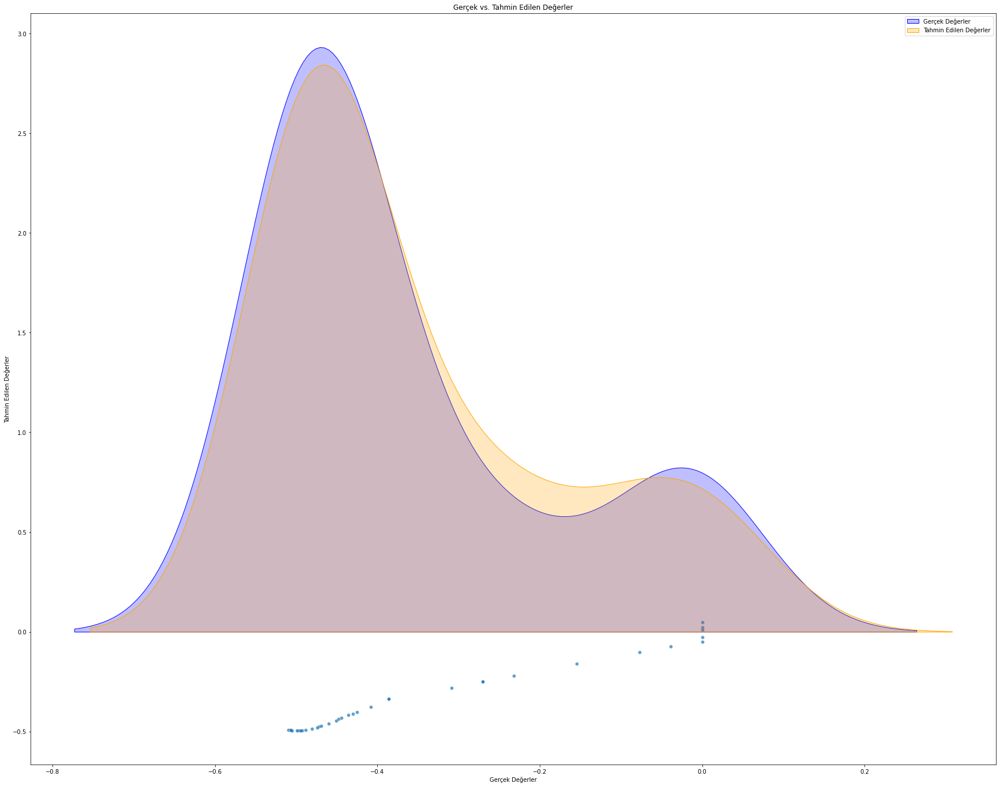

In [151]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_N14 = pd.DataFrame({'Gerçek Değerler': y_test_N14.flatten(), 'Tahmin Edilen Değerler': y_pred_N14.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N14, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N14['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
4/4 [==============================] - 0s 21ms/step - loss: 0.0356 - mae: 0.1536 - val_loss: 0.0281 - val_mae: 0.1385
Epoch 2/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0356 - mae: 0.1576 - val_loss: 0.0288 - val_mae: 0.1451
Epoch 3/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0357 - mae: 0.1611 - val_loss: 0.0292 - val_mae: 0.1476
Epoch 4/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0358 - mae: 0.1628 - val_loss: 0.0293 - val_mae: 0.1486
Epoch 5/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0358 - mae: 0.1626 - val_loss: 0.0290 - val_mae: 0.1462
Epoch 6/50
4/4 [==============================] - 0s 12ms/step - loss: 0.0357 - mae: 0.1615 - val_loss: 0.0289 - val_mae: 0.1455
Epoch 7/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0357 - mae: 0.1609 - val_loss: 0.0289 - val_mae: 0.1454
Epoch 8/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0357 - mae: 0.1610 - val_lo

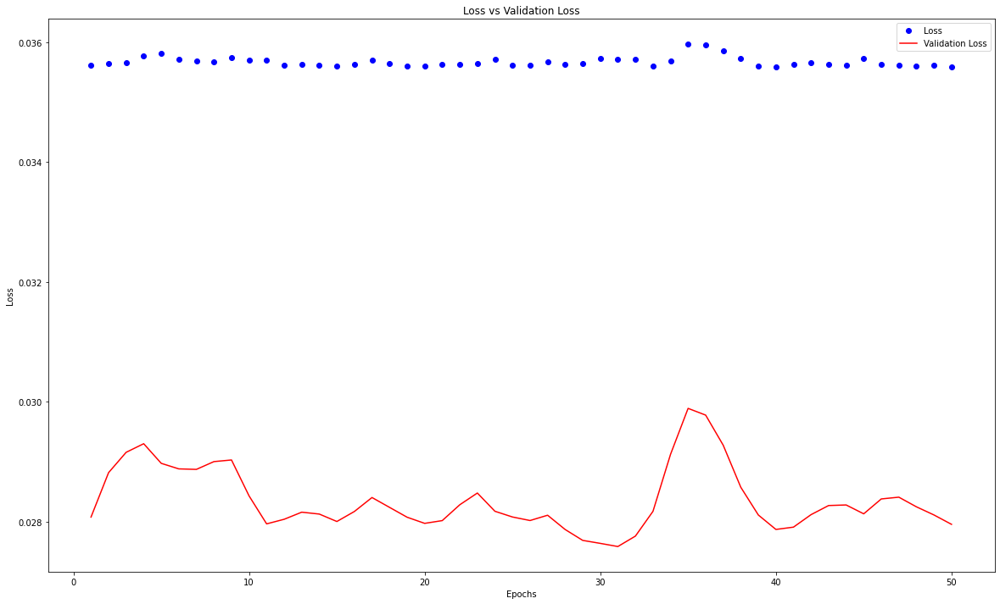

In [152]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_N14, y_train_N14, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması


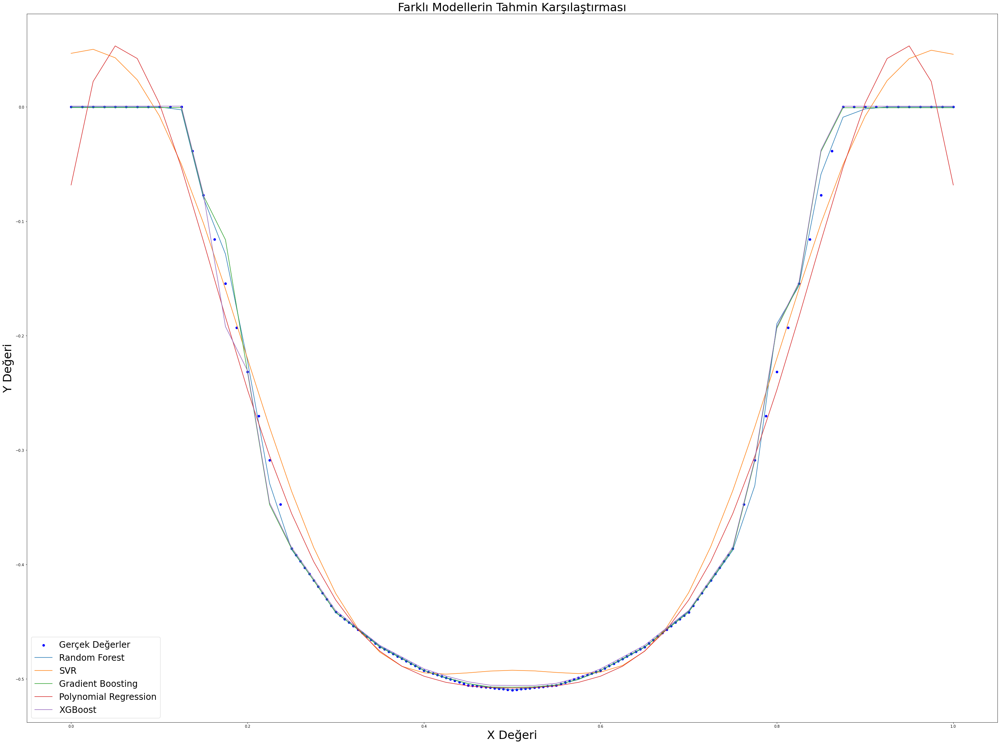

In [36]:
y_pred_rf_N14 = rf_reg_N14.predict(X_values_N14)
y_pred_svr_N14 = svr_reg_N14.predict(X_values_N14)  
y_pred_gb_N14 = gb_reg_N14.predict(X_values_N14)
y_pred_poly_N14 = poly_reg_N14.predict(X_values_N14)
y_pred_xgb_N14 = xgb_N14.predict(X_values_N14)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_N14, y_N14, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_N14, y_pred_rf_N14, label='Random Forest')
plt.plot(X_values_N14, y_pred_svr_N14, label='SVR')
plt.plot(X_values_N14, y_pred_gb_N14, label='Gradient Boosting')
plt.plot(X_values_N14, y_pred_poly_N14, label='Polynomial Regression')
plt.plot(X_values_N14, y_pred_xgb_N14, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

### N16 Verileri için Modeller

In [154]:
data_N16 = pd.read_excel('N verileri.xlsx')
data_N16 = data_N16.iloc[:, 4:6] # 5. ve 6. kolonları seçelim
data_N16

,N16_FI_X1_iz10_imort,N16_X1_fi
0,0.000000,0.000000e+00
1,0.833333,0.000000e+00
2,1.666667,0.000000e+00
3,2.500000,0.000000e+00
4,3.333333,0.000000e+00
5,4.166667,0.000000e+00
6,5.000000,0.000000e+00
7,5.833333,0.000000e+00
8,6.666667,0.000000e+00
9,7.500000,0.000000e+00


In [155]:
data_N16 = data_N16.loc[:175,:] 
data_N16['N16_FI_X1_iz10_imort'] = data_N16['N16_FI_X1_iz10_imort'] / 100 # koordinat değerlerini / 10 yapmam gerekli
data_N16

,N16_FI_X1_iz10_imort,N16_X1_fi
0,0.000000,0.000000e+00
1,0.008333,0.000000e+00
2,0.016667,0.000000e+00
3,0.025000,0.000000e+00
4,0.033333,0.000000e+00
5,0.041667,0.000000e+00
6,0.050000,0.000000e+00
7,0.058333,0.000000e+00
8,0.066667,0.000000e+00
9,0.075000,0.000000e+00


In [156]:
data_N16.columns[data_N16.isnull().any()]

Index([], dtype='object')

In [157]:
data_N16.isna().any()

N16_FI_X1_iz10_imort    False
N16_X1_fi               False
dtype: bool

In [158]:
data_N16.describe().T

,count,mean,std,min,25%,50%,75%,max
N16_FI_X1_iz10_imort,176.0,0.500000,0.261084,0.000000,0.300000,0.500000,0.7,1.000000e+00
N16_X1_fi,176.0,-0.321568,0.213140,-0.512019,-0.495291,-0.444078,0.0,5.881093e-09


### veri kontrol edildi, problem yok


In [159]:
X_N16 = data_N16.iloc[:, :1].values
y_N16 = data_N16.iloc[:,1].values

In [160]:
X_N16.shape, y_N16.shape

((176, 1), (176,))

In [161]:
X_train_N16, X_test_N16, y_train_N16, y_test_N16 = train_test_split(X_N16, y_N16, test_size=0.25, random_state=42)

### RandomForestRegressor

[[-1.26e-03  0.00e+00]
 [-4.45e-01 -4.47e-01]
 [-4.14e-01 -4.10e-01]
 [-2.86e-01 -3.16e-01]
 [-4.95e-01 -4.97e-01]
 [ 0.00e+00  0.00e+00]
 [-4.75e-01 -4.77e-01]
 [ 3.28e-10  0.00e+00]
 [-4.95e-01 -4.95e-01]
 [-4.03e-01 -4.05e-01]
 [-8.81e-02 -7.89e-02]
 [ 3.28e-10  0.00e+00]
 [-4.30e-01 -4.34e-01]
 [-4.80e-01 -4.79e-01]
 [ 0.00e+00  0.00e+00]
 [-4.94e-01 -4.93e-01]
 [-4.90e-01 -4.89e-01]
 [-5.10e-01 -5.10e-01]
 [ 0.00e+00  0.00e+00]
 [-4.87e-01 -4.87e-01]
 [-1.58e-04  0.00e+00]
 [-4.93e-01 -4.95e-01]
 [-4.84e-01 -4.85e-01]
 [ 3.28e-10  0.00e+00]
 [ 3.28e-10  0.00e+00]
 [-1.41e-01 -1.18e-01]
 [-4.82e-01 -4.81e-01]
 [-4.93e-01 -4.95e-01]
 [-5.11e-01 -5.11e-01]
 [-4.74e-01 -4.75e-01]
 [-2.31e-01 -2.76e-01]
 [-4.58e-01 -4.56e-01]
 [-3.82e-01 -3.55e-01]
 [-3.95e-01 -3.55e-01]
 [ 0.00e+00  0.00e+00]
 [-4.42e-01 -4.39e-01]
 [-6.31e-04  0.00e+00]
 [-4.22e-01 -4.24e-01]
 [-5.08e-01 -5.08e-01]
 [ 3.28e-10  0.00e+00]
 [-4.17e-01 -4.19e-01]
 [-4.96e-01 -4.97e-01]
 [-5.11e-01 -5.11e-01]
 [-4.99e-01

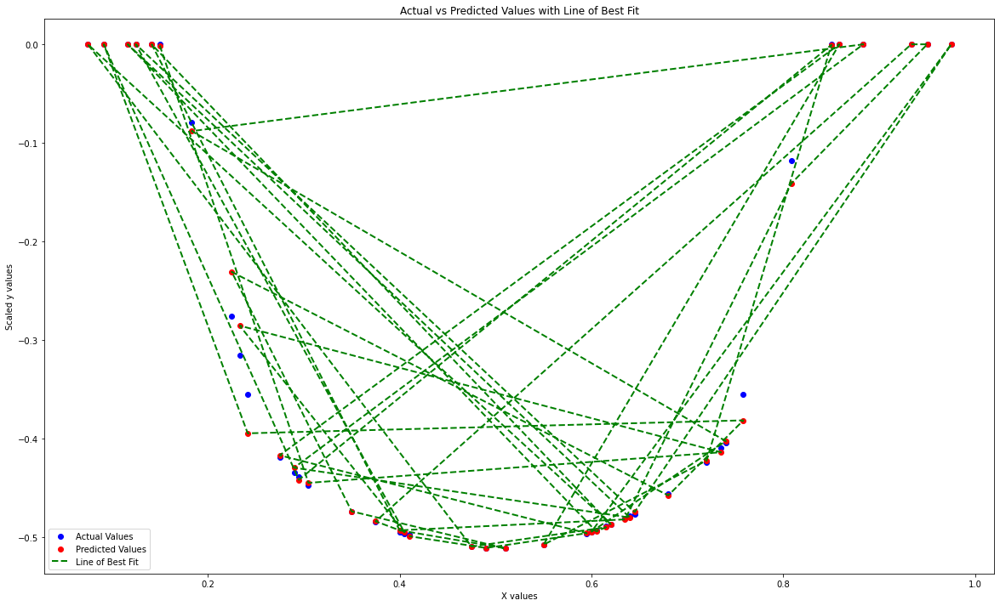

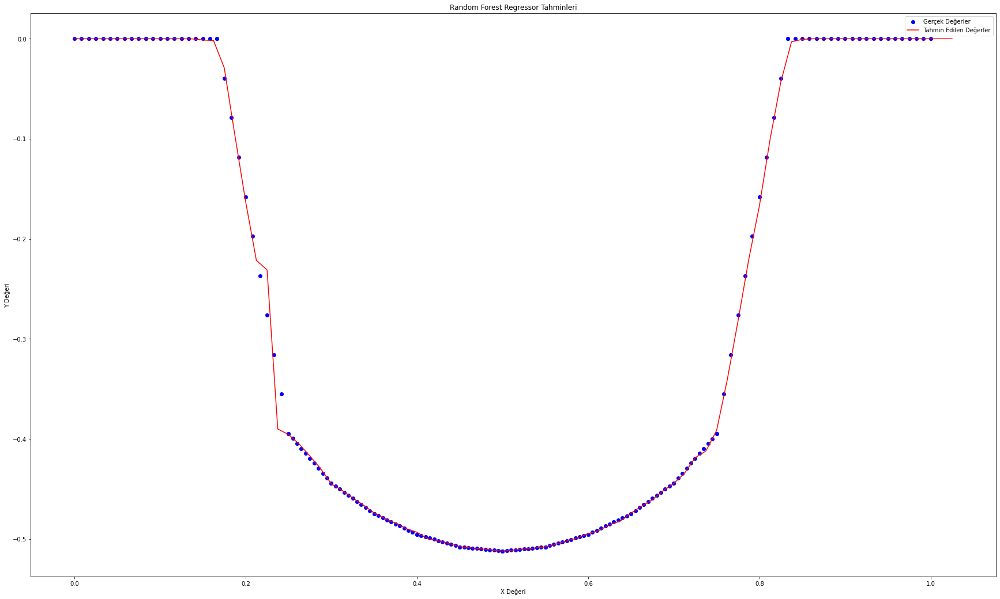

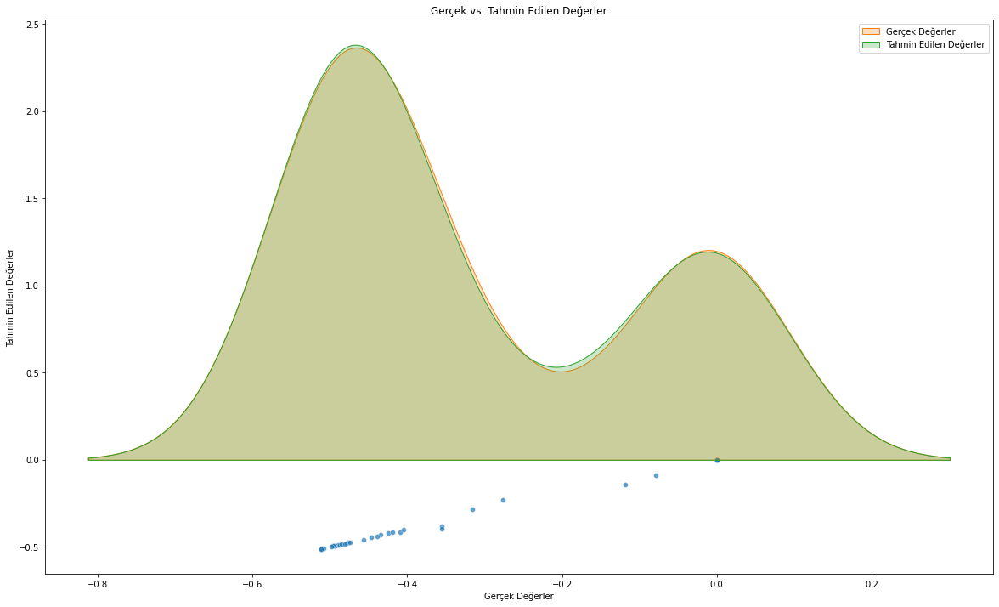

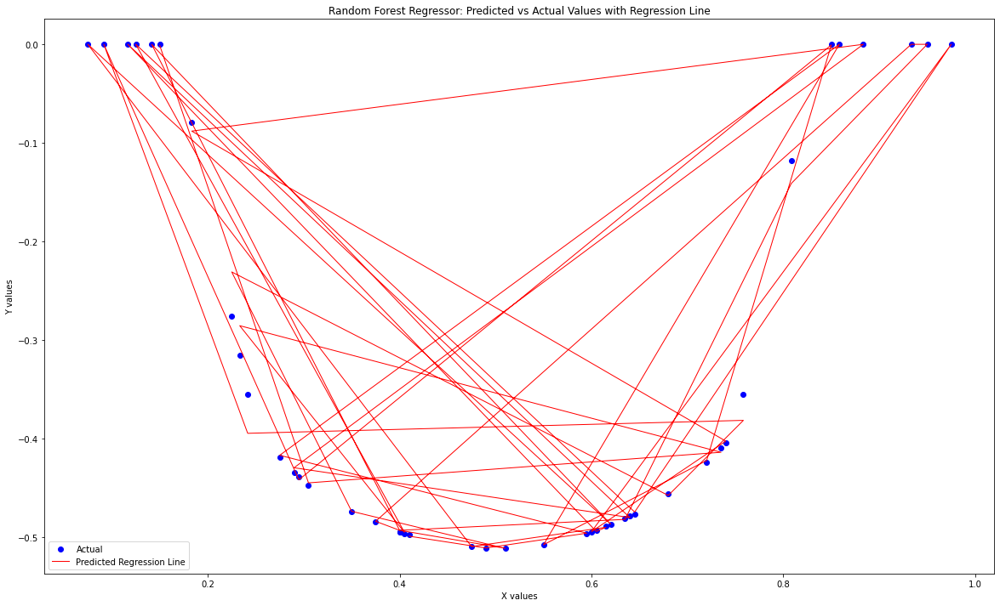

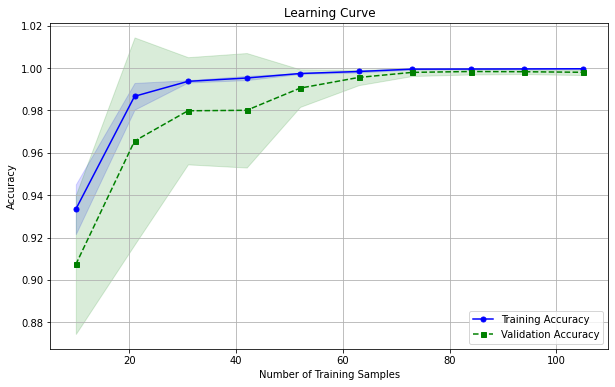

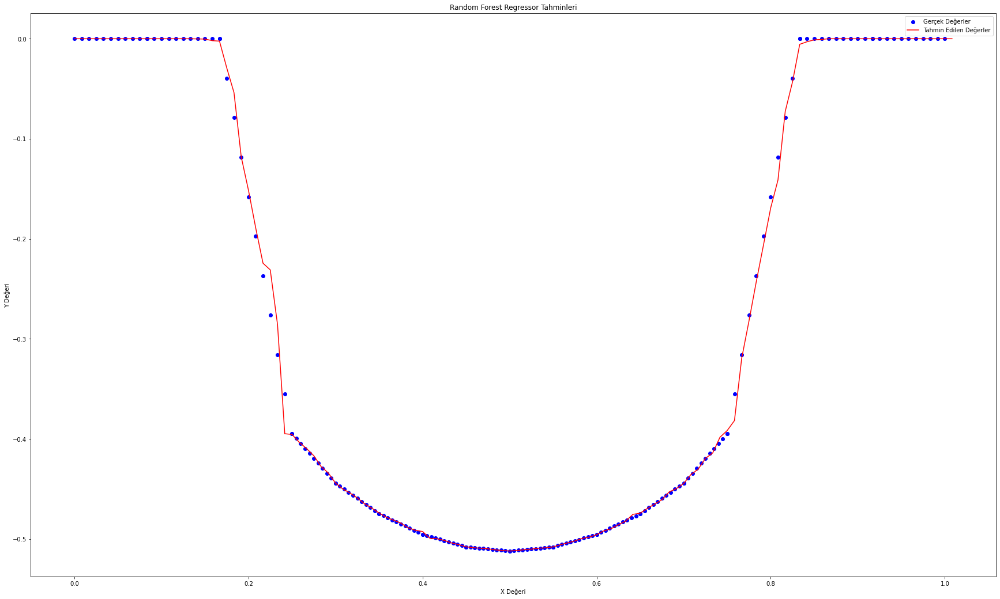

[-0.4]


In [162]:
rf_reg_N16 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_N16.fit(X_train_N16, y_train_N16)

y_pred_N16 = rf_reg_N16.predict(X_test_N16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N16.reshape(len(y_pred_N16),1), y_test_N16.reshape(len(y_test_N16),1)),1))

print(r2_score(y_test_N16, y_pred_N16))

# Use test and show results of test set
y_hat_N16 = rf_reg_N16.predict(X_N16)
mae = metrics.mean_absolute_error(y_N16,y_hat_N16)
mse = metrics.mean_squared_error(y_N16,y_hat_N16)
mape = np.mean(np.abs((y_N16 - y_hat_N16) / y_N16)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_N16.score(X_N16,y_N16))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_N16, y_test_N16, color='blue', label='Actual Values')
plt.scatter(X_test_N16, y_pred_N16, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_N16, y_pred_N16, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N16 = np.arange(0, 1.03125, 0.0125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N16 = rf_reg_N16.predict(X_values_N16)

# Gerçek değerler için aynı işlemi yap
y_true_values_N16 = rf_reg_N16.predict(X_N16)

plt.figure(figsize=(30, 18))
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N16, y_pred_values_N16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N16 = pd.DataFrame({'Gerçek Değerler': y_test_N16, 'Tahmin Edilen Değerler': y_pred_N16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N16 = pd.DataFrame({'Predicted': y_pred_N16, 'Actual': y_test_N16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N16, y_test_N16, color='blue', label='Actual')
plt.plot(X_test_N16, y_pred_N16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_N16, X=X_train_N16, y=y_train_N16, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N16 = np.arange(0, 1.008333, 0.008333).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N16 = rf_reg_N16.predict(X_values_N16)

# Gerçek değerler için aynı işlemi yap
y_true_values_N16 = rf_reg_N16.predict(X_N16)

plt.figure(figsize=(30, 18))
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N16, y_pred_values_N16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_N16.predict([[0.250]])) #0.250 == -3.945994e-01 gerçek değerde

### XGBRegressor ile deneyelim


[[ 0.    0.  ]
 [-0.45 -0.45]
 [-0.41 -0.41]
 [-0.39 -0.32]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.47 -0.48]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [-0.4  -0.4 ]
 [-0.12 -0.08]
 [ 0.    0.  ]
 [-0.43 -0.43]
 [-0.47 -0.48]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.49 -0.49]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.48 -0.49]
 [ 0.    0.  ]
 [-0.49 -0.5 ]
 [-0.49 -0.48]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.08 -0.12]
 [-0.48 -0.48]
 [-0.49 -0.5 ]
 [-0.51 -0.51]
 [-0.47 -0.47]
 [-0.24 -0.28]
 [-0.45 -0.46]
 [-0.32 -0.36]
 [-0.39 -0.36]
 [ 0.    0.  ]
 [-0.44 -0.44]
 [ 0.    0.  ]
 [-0.42 -0.42]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.42 -0.42]
 [-0.49 -0.5 ]
 [-0.51 -0.51]
 [-0.5  -0.5 ]]
0.9928110817095346
TEST SET
MAE:                 0.003024252866479024
RMSE:                0.00906177762255405
MAPE:                inf
r2:                  0.9981821011005914


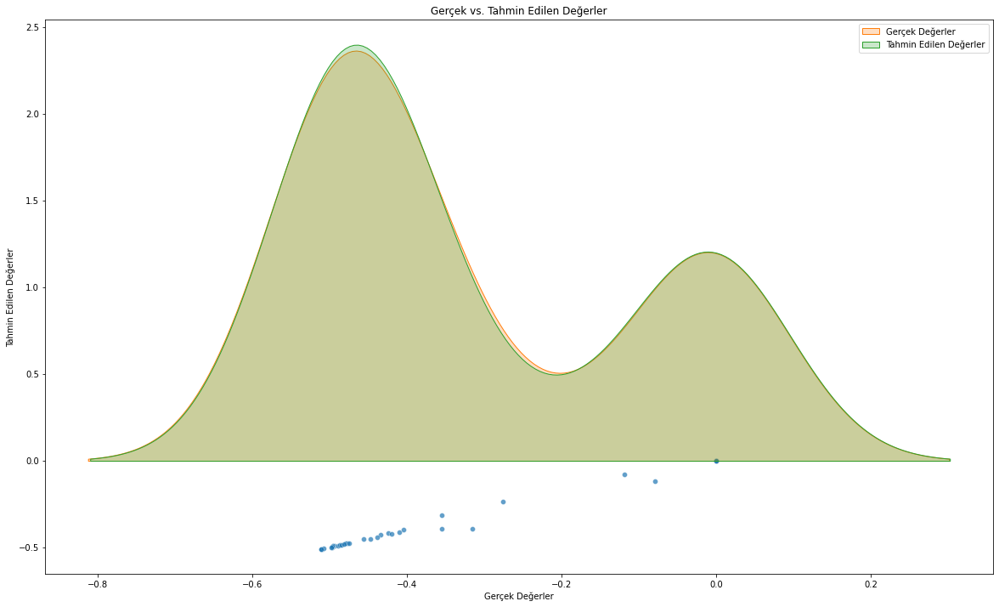

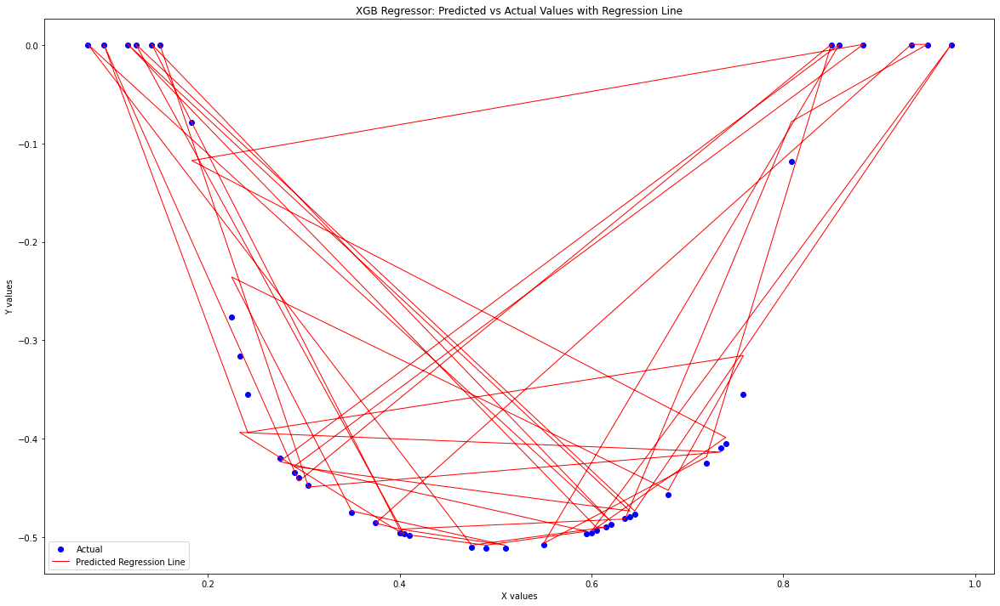

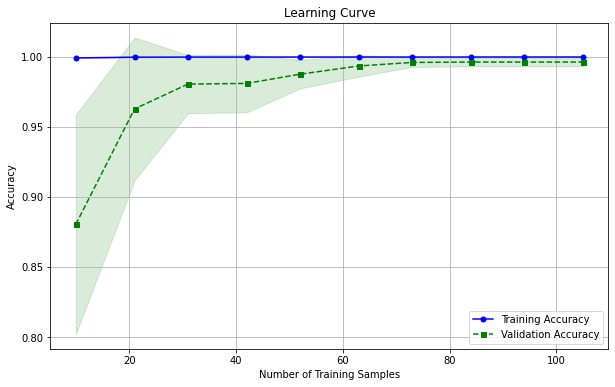

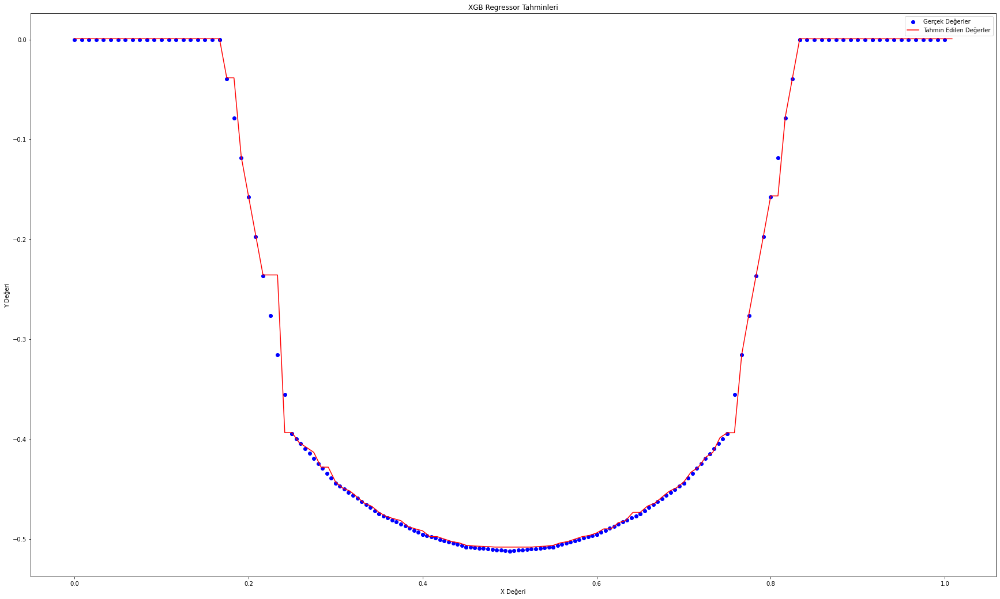

[-0.39]


In [163]:
from xgboost import XGBRegressor


xgb_N16 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_N16.fit(X_train_N16, y_train_N16)

y_pred_N16 = xgb_N16.predict(X_test_N16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N16.reshape(len(y_pred_N16),1), y_test_N16.reshape(len(y_test_N16),1)),1))


print(r2_score(y_test_N16, y_pred_N16))

# Use test and show results of test set
y_hat_N16 = xgb_N16.predict(X_N16)
mae = metrics.mean_absolute_error(y_N16,y_hat_N16)
mse = metrics.mean_squared_error(y_N16,y_hat_N16)
mape = np.mean(np.abs((y_N16 - y_hat_N16) / y_N16)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_N16.score(X_N16,y_N16))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N16 = pd.DataFrame({'Gerçek Değerler': y_test_N16, 'Tahmin Edilen Değerler': y_pred_N16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N16 = pd.DataFrame({'Predicted': y_pred_N16, 'Actual': y_test_N16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N16, y_test_N16, color='blue', label='Actual')
plt.plot(X_test_N16, y_pred_N16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_N16, X=X_train_N16, y=y_train_N16, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N16 = np.arange(0, 1.0083335, 0.008333).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_N16 = xgb_N16.predict(X_values_N16)

# Gerçek değerler için aynı işlemi yap
y_true_values_N16 = xgb_N16.predict(X_N16)

plt.figure(figsize=(30, 18))
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N16, y_pred_values_N16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_N16.predict([[0.250]])) #0.250 == -3.945994e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-4.90e-04  0.00e+00]
 [-4.44e-01 -4.47e-01]
 [-4.15e-01 -4.10e-01]
 [-2.37e-01 -3.16e-01]
 [-4.93e-01 -4.97e-01]
 [-4.90e-04  0.00e+00]
 [-4.75e-01 -4.77e-01]
 [-4.94e-04  0.00e+00]
 [-4.95e-01 -4.95e-01]
 [-4.00e-01 -4.05e-01]
 [-1.19e-01 -7.89e-02]
 [-4.94e-04  0.00e+00]
 [-4.29e-01 -4.34e-01]
 [-4.83e-01 -4.79e-01]
 [-4.90e-04  0.00e+00]
 [-4.95e-01 -4.93e-01]
 [-4.91e-01 -4.89e-01]
 [-5.09e-01 -5.10e-01]
 [-4.90e-04  0.00e+00]
 [-4.85e-01 -4.87e-01]
 [-4.90e-04  0.00e+00]
 [-4.93e-01 -4.95e-01]
 [-4.83e-01 -4.85e-01]
 [-4.94e-04  0.00e+00]
 [-4.94e-04  0.00e+00]
 [-1.58e-01 -1.18e-01]
 [-4.83e-01 -4.81e-01]
 [-4.93e-01 -4.95e-01]
 [-5.09e-01 -5.11e-01]
 [-4.75e-01 -4.75e-01]
 [-2.37e-01 -2.76e-01]
 [-4.60e-01 -4.56e-01]
 [-3.95e-01 -3.55e-01]
 [-3.95e-01 -3.55e-01]
 [-4.90e-04  0.00e+00]
 [-4.44e-01 -4.39e-01]
 [-4.94e-04  0.00e+00]
 [-4.20e-01 -4.24e-01]
 [-5.08e-01 -5.08e-01]
 [-4.94e-04  0.00e+00]
 [-4.15e-01 -4.19e-01]
 [-4.95e-01 -4.97e-01]
 [-5.09e-01 -5.11e-01]
 [-4.99e-01

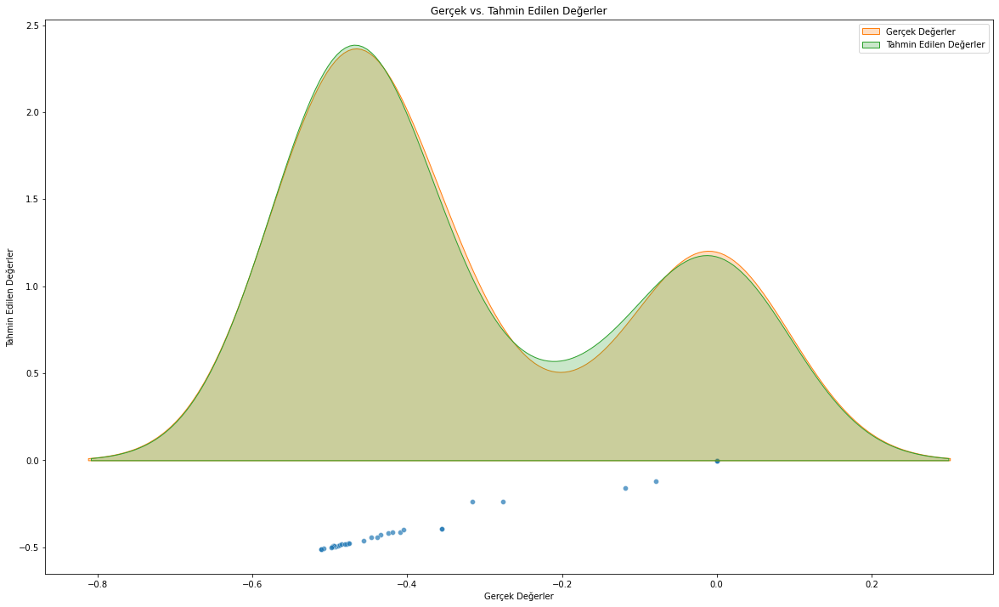

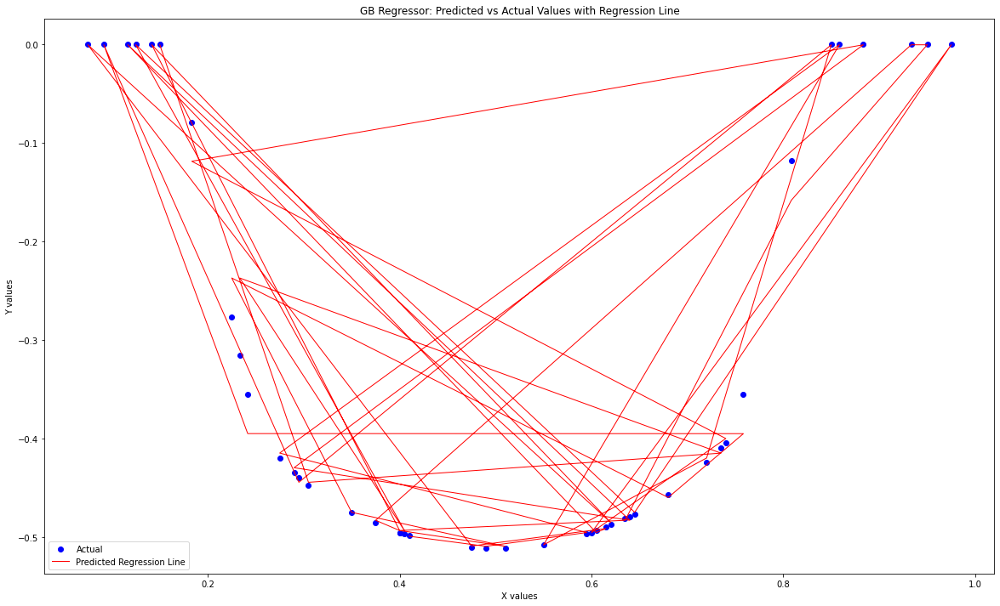

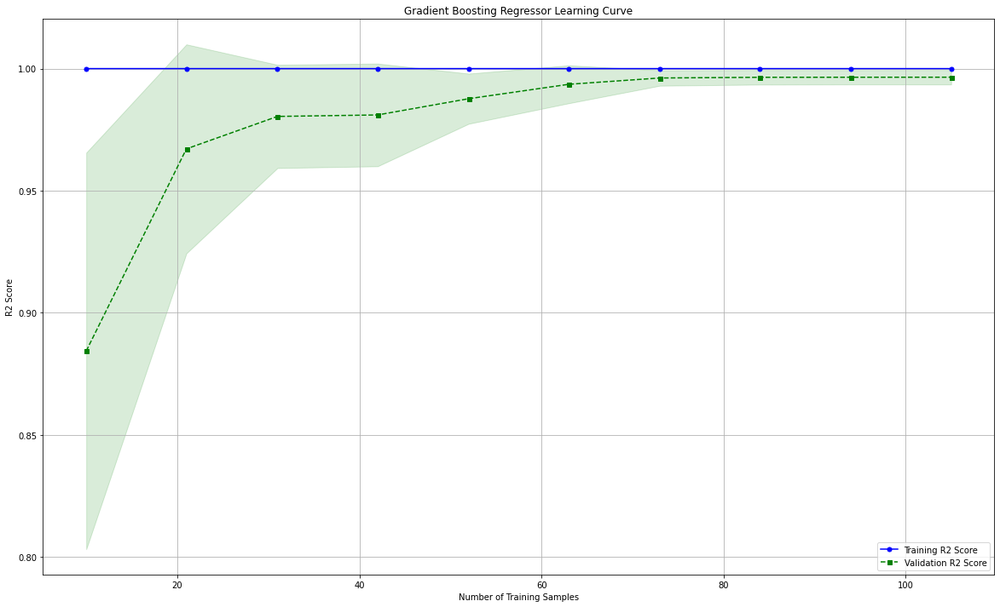

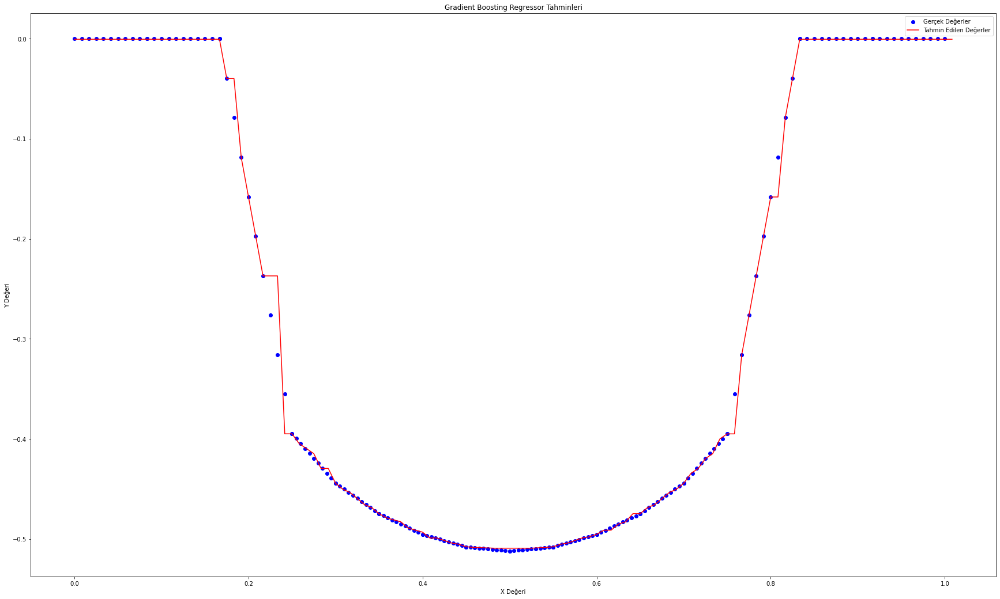

[-0.39]


In [164]:
gb_reg_N16 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_N16.fit(X_train_N16, y_train_N16)

y_pred_N16 = gb_reg_N16.predict(X_test_N16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N16.reshape(len(y_pred_N16),1), y_test_N16.reshape(len(y_test_N16),1)),1))


print(r2_score(y_test_N16, y_pred_N16))

# Use test and show results of test set
y_hat_N16 = gb_reg_N16.predict(X_N16)
mae = metrics.mean_absolute_error(y_N16,y_hat_N16)
mse = metrics.mean_squared_error(y_N16,y_hat_N16)
mape = np.mean(np.abs((y_N16 - y_hat_N16) / y_N16)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_N16.score(X_N16,y_N16))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N16 = pd.DataFrame({'Gerçek Değerler': y_test_N16, 'Tahmin Edilen Değerler': y_pred_N16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N16 = pd.DataFrame({'Predicted': y_pred_N16, 'Actual': y_test_N16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N16, y_test_N16, color='blue', label='Actual')
plt.plot(X_test_N16, y_pred_N16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_N16, X=X_train_N16, y=y_train_N16, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N16 = np.arange(0, 1.008333, 0.008333).reshape(-1, 1)


# Modelin tahmin ettiği değerleri al
y_pred_values_N16 = gb_reg_N16.predict(X_values_N16)

# Gerçek değerler için aynı işlemi yap
y_true_values_N16 = gb_reg_N16.predict(X_N16)

plt.figure(figsize=(30, 18))
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N16, y_pred_values_N16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_N16.predict([[0.250]])) #0.250 == -3.945994e-01 gerçek değerde

### SupportVectorRegressor deneyelim


[[-0.05  0.  ]
 [-0.46 -0.45]
 [-0.36 -0.41]
 [-0.28 -0.32]
 [-0.54 -0.5 ]
 [ 0.    0.  ]
 [-0.52 -0.48]
 [ 0.03  0.  ]
 [-0.54 -0.5 ]
 [-0.34 -0.4 ]
 [-0.13 -0.08]
 [ 0.02  0.  ]
 [-0.43 -0.43]
 [-0.53 -0.48]
 [ 0.02  0.  ]
 [-0.54 -0.49]
 [-0.54 -0.49]
 [-0.54 -0.51]
 [ 0.05  0.  ]
 [-0.54 -0.49]
 [-0.03  0.  ]
 [-0.54 -0.5 ]
 [-0.53 -0.48]
 [ 0.05  0.  ]
 [ 0.05  0.  ]
 [-0.14 -0.12]
 [-0.53 -0.48]
 [-0.54 -0.5 ]
 [-0.54 -0.51]
 [-0.52 -0.47]
 [-0.25 -0.28]
 [-0.48 -0.46]
 [-0.29 -0.36]
 [-0.3  -0.36]
 [ 0.04  0.  ]
 [-0.44 -0.44]
 [-0.04  0.  ]
 [-0.39 -0.42]
 [-0.54 -0.51]
 [-0.02  0.  ]
 [-0.39 -0.42]
 [-0.54 -0.5 ]
 [-0.54 -0.51]
 [-0.54 -0.5 ]]
0.9642298992017507
TEST SET
MAE:                 0.036129682845508375
RMSE:                0.040279906163751864
MAPE:                inf
r2:                  0.9640813648044756


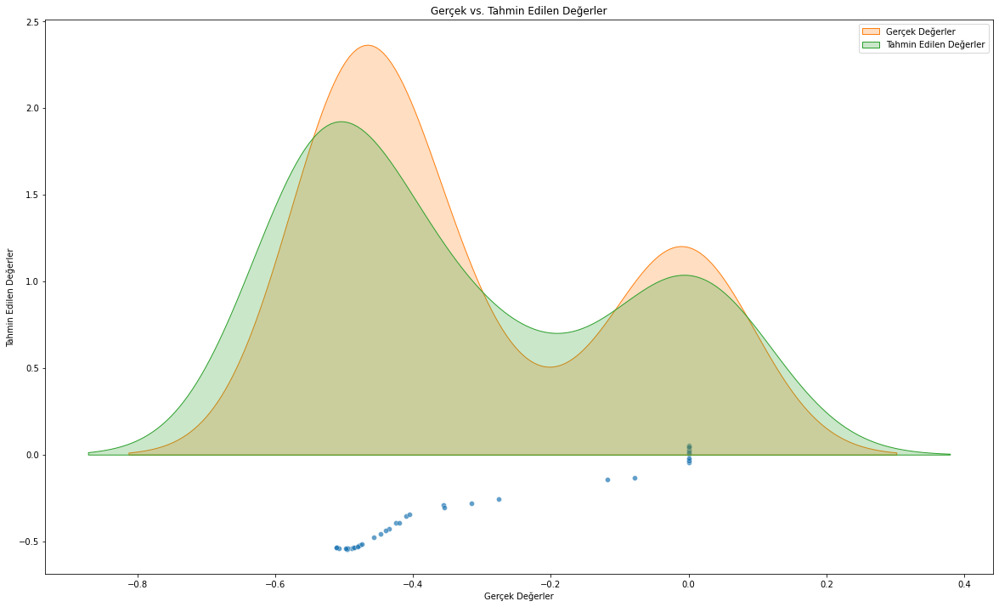

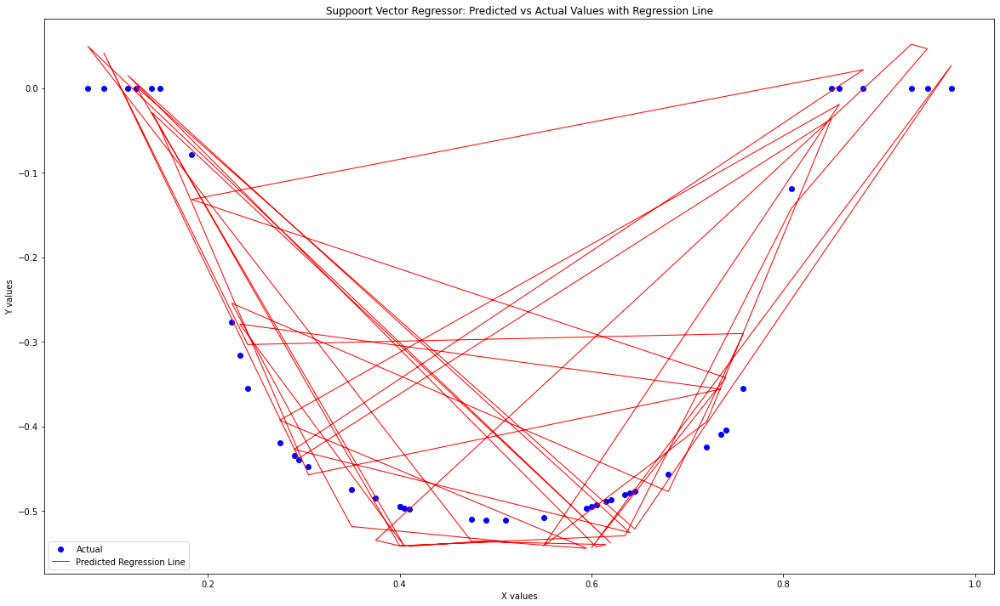

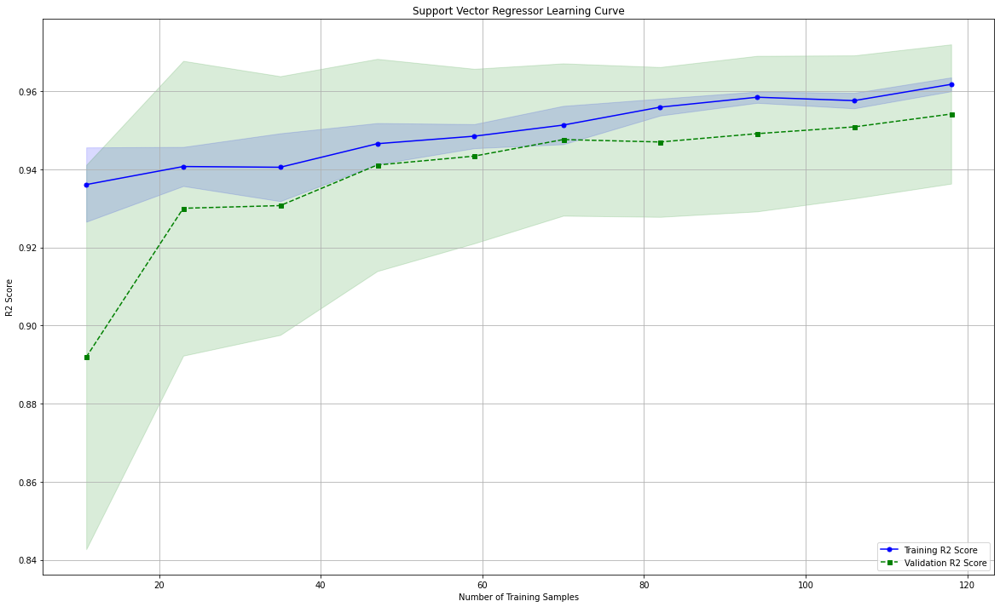

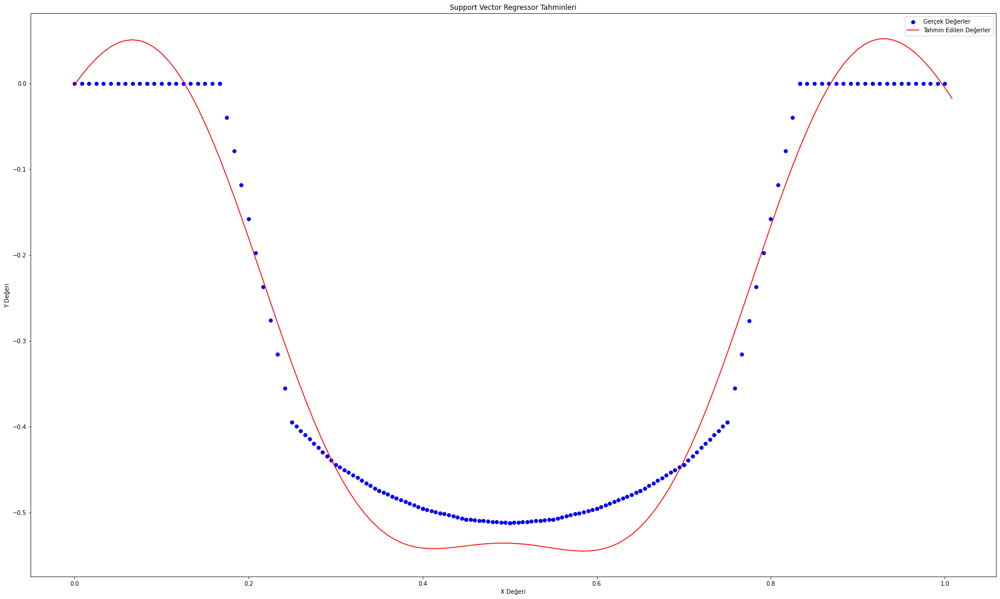

[-0.33]


In [165]:
### SupportVectorRegressor deneyelim
svr_reg_N16 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_N16.fit(X_train_N16, y_train_N16)

y_pred_N16 = svr_reg_N16.predict(X_test_N16)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N16.reshape(len(y_pred_N16),1), y_test_N16.reshape(len(y_test_N16),1)),1))


print(r2_score(y_test_N16, y_pred_N16))


# Use test and show results of test set
y_hat_N16 = svr_reg_N16.predict(X_N16)
mae = metrics.mean_absolute_error(y_N16,y_hat_N16)
mse = metrics.mean_squared_error(y_N16,y_hat_N16)
mape = np.mean(np.abs((y_N16 - y_hat_N16) / y_N16)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_N16.score(X_N16,y_N16))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N16 = pd.DataFrame({'Gerçek Değerler': y_test_N16, 'Tahmin Edilen Değerler': y_pred_N16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N16 = pd.DataFrame({'Predicted': y_pred_N16, 'Actual': y_test_N16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N16, y_test_N16, color='blue', label='Actual')
plt.plot(X_test_N16, y_pred_N16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_N16, X=X_train_N16, y=y_train_N16, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N16 = np.arange(0, 1.008333, 0.008333).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N16 = svr_reg_N16.predict(X_values_N16)

# Gerçek değerler için aynı işlemi yap
y_true_values_N16 = svr_reg_N16.predict(X_N16)

plt.figure(figsize=(30, 18))
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N16, y_pred_values_N16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_N16.predict([[0.250]])) #0.250 == -3.945994e-01 gerçek değerde

### PolynomialRegressor ile deneyelim


R2 Score (Polynomial Regression):  0.966626807393457
MAE (Polynomial Regression):  0.028464950596712158
RMSE (Polynomial Regression):  0.03867661057410763
MAPE (Polynomial Regression):  inf


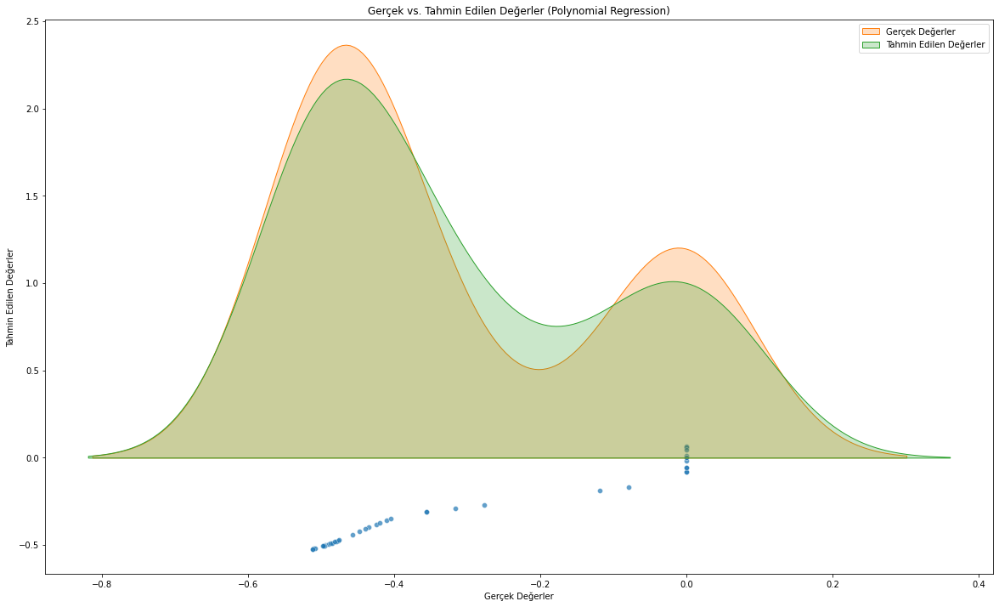

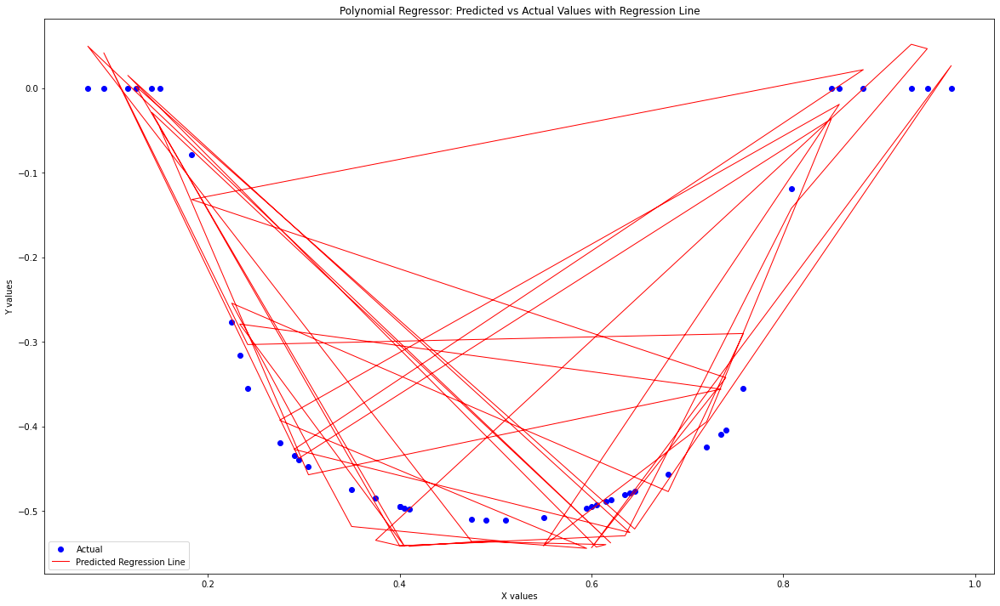

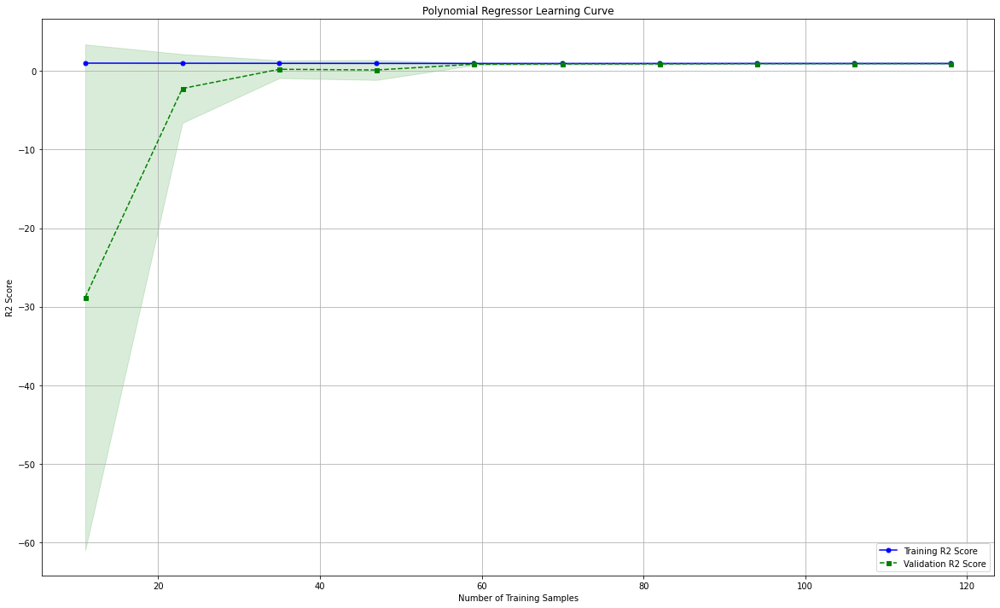

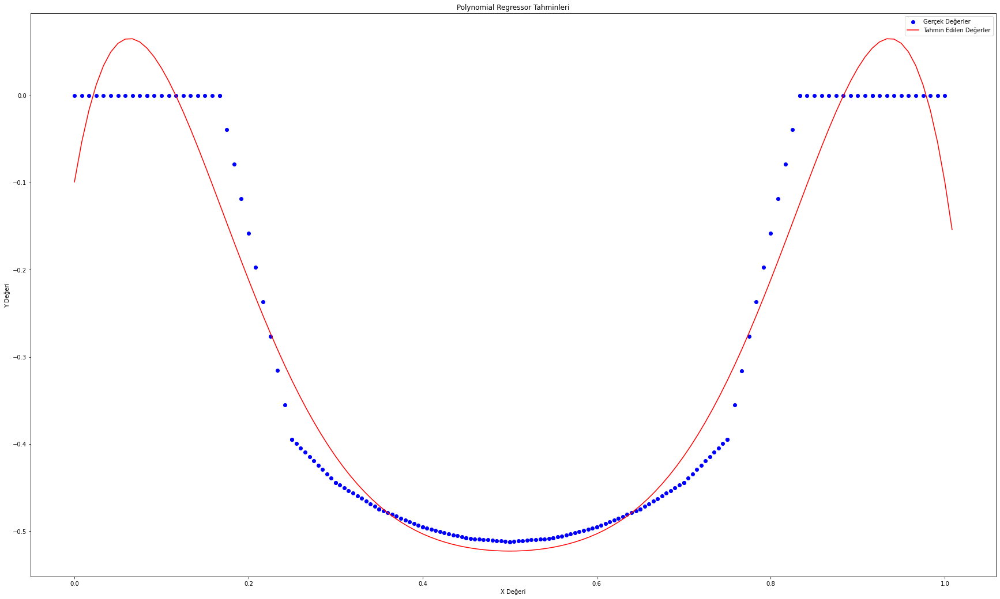

[-0.33]


In [166]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_N16 = PolynomialFeatures(degree=7)
X_poly_N16 = poly_N16.fit_transform(X_N16)

# Lineer Regresyon modeli oluşturma
poly_reg_N16 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_N16.fit(X_N16, y_N16)

# Tahminler yapma
y_pred_poly_N16 = poly_reg_N16.predict(X_test_N16)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_N16, y_pred_poly_N16))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_N16, y_pred_poly_N16))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_N16, y_pred_poly_N16)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_N16 - y_pred_poly_N16) / y_test_N16)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_N16 = pd.DataFrame({'Gerçek Değerler': y_test_N16, 'Tahmin Edilen Değerler': y_pred_poly_N16})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_N16, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N16['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_N16 = pd.DataFrame({'Predicted': y_pred_N16, 'Actual': y_test_N16})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N16, y_test_N16, color='blue', label='Actual')
plt.plot(X_test_N16, y_pred_N16, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_N16, X=X_train_N16, y=y_train_N16, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N16 = np.arange(0, 1.008333, 0.008333).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N16 = poly_reg_N16.predict(X_values_N16)

# Gerçek değerler için aynı işlemi yap
y_true_values_N16 = poly_reg_N16.predict(X_N16)

plt.figure(figsize=(30, 18))
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N16, y_pred_values_N16, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_N16.predict([[0.250]])) #0.250 == -3.860118e-01 gerçek değerde

### Multi-Layer Perceptron

In [167]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_N16, y_train_N16,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test_N16)

Epoch 1/100
4/4 [==============================] - 1s 40ms/step - loss: 0.1473 - mae: 0.3217 - val_loss: 0.1545 - val_mae: 0.3276
Epoch 2/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1447 - mae: 0.3198 - val_loss: 0.1518 - val_mae: 0.3257
Epoch 3/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1420 - mae: 0.3176 - val_loss: 0.1491 - val_mae: 0.3238
Epoch 4/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1394 - mae: 0.3155 - val_loss: 0.1464 - val_mae: 0.3218
Epoch 5/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1367 - mae: 0.3133 - val_loss: 0.1436 - val_mae: 0.3198
Epoch 6/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1340 - mae: 0.3110 - val_loss: 0.1408 - val_mae: 0.3177
Epoch 7/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1313 - mae: 0.3089 - val_loss: 0.1381 - val_mae: 0.3157
Epoch 8/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1287 - mae: 0.30

Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0445 - mae: 0.1842 - val_loss: 0.0495 - val_mae: 0.2008
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0446 - mae: 0.1840 - val_loss: 0.0494 - val_mae: 0.2013
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0444 - mae: 0.1848 - val_loss: 0.0493 - val_mae: 0.2029
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0443 - mae: 0.1865 - val_loss: 0.0492 - val_mae: 0.2049
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0442 - mae: 0.1884 - val_loss: 0.0491 - val_mae: 0.2073
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0441 - mae: 0.1907 - val_loss: 0.0492 - val_mae: 0.2096
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0440 - mae: 0.1919 - val_loss: 0.0492 - val_mae: 0.2095
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0440 - mae: 0.1

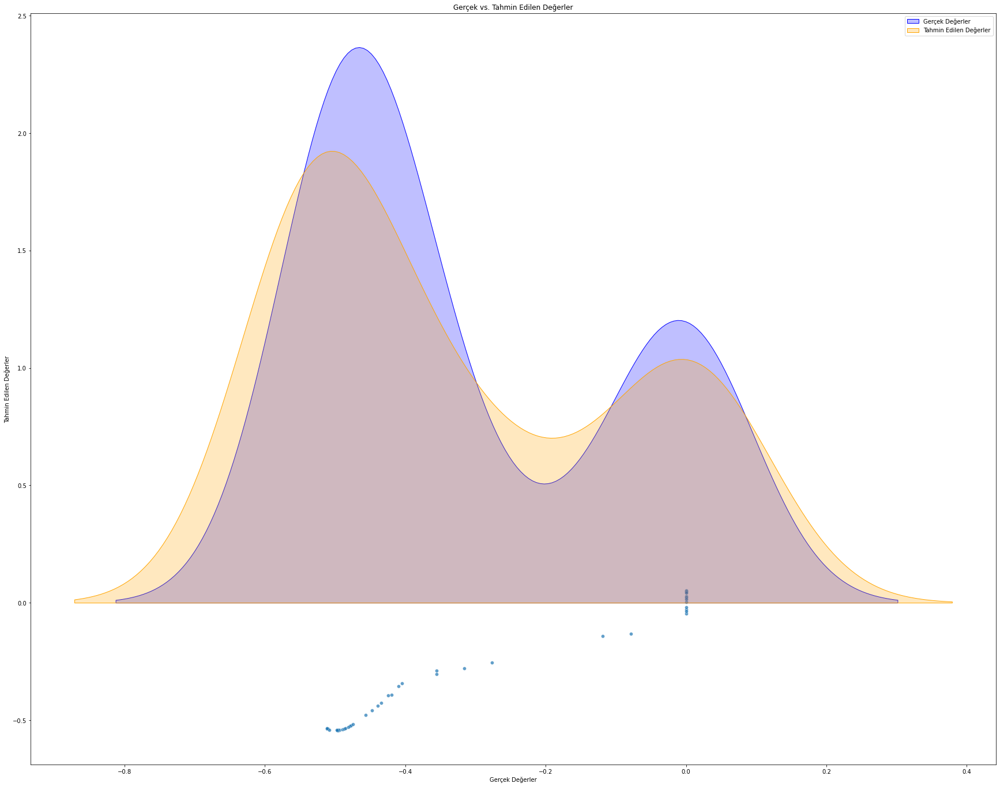

In [168]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_N16 = pd.DataFrame({'Gerçek Değerler': y_test_N16.flatten(), 'Tahmin Edilen Değerler': y_pred_N16.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N16, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N16['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
4/4 [==============================] - 0s 19ms/step - loss: 0.0449 - mae: 0.1922 - val_loss: 0.0485 - val_mae: 0.2098
Epoch 2/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0450 - mae: 0.1911 - val_loss: 0.0483 - val_mae: 0.2091
Epoch 3/50
4/4 [==============================] - 0s 9ms/step - loss: 0.0450 - mae: 0.1909 - val_loss: 0.0484 - val_mae: 0.2093
Epoch 4/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0450 - mae: 0.1912 - val_loss: 0.0485 - val_mae: 0.2101
Epoch 5/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0450 - mae: 0.1917 - val_loss: 0.0486 - val_mae: 0.2108
Epoch 6/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0449 - mae: 0.1922 - val_loss: 0.0488 - val_mae: 0.2118
Epoch 7/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0449 - mae: 0.1927 - val_loss: 0.0489 - val_mae: 0.2125
Epoch 8/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0449 - mae: 0.1933 - val_

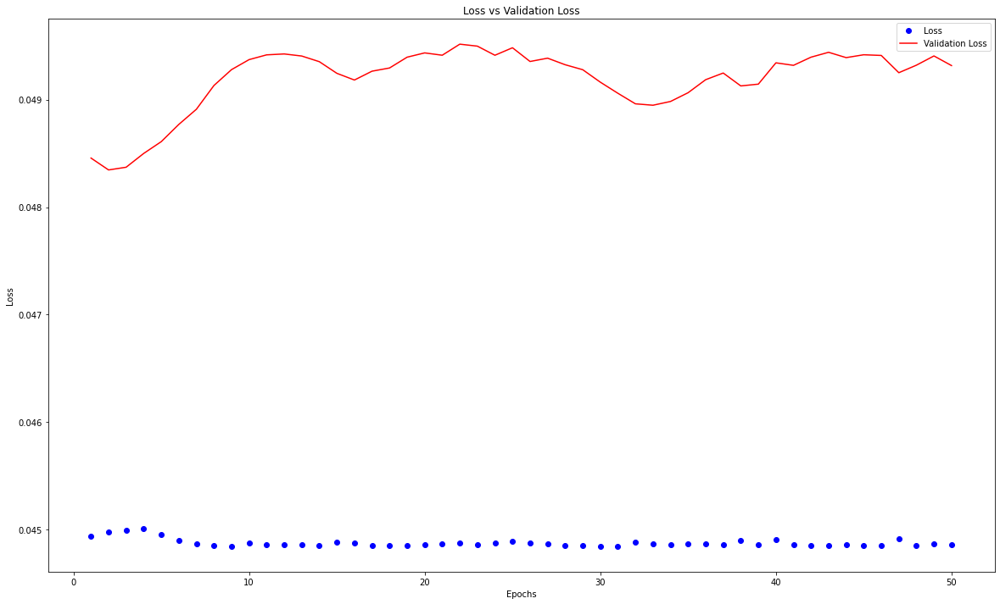

In [169]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_N16, y_train_N16, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması


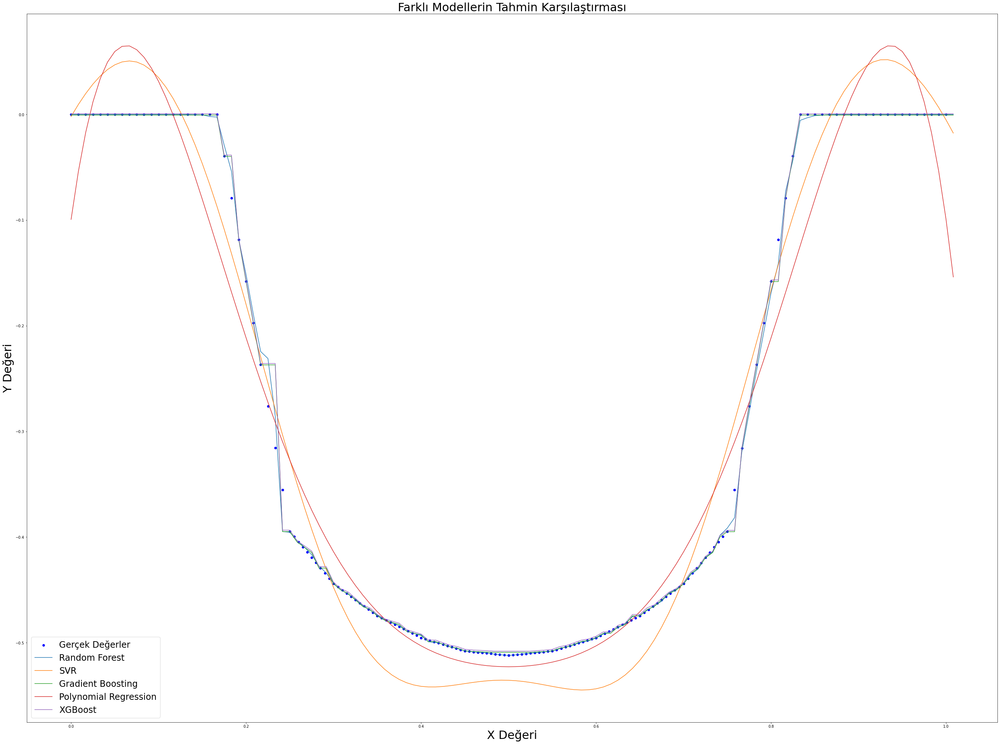

In [170]:
y_pred_rf_N16 = rf_reg_N16.predict(X_values_N16)
y_pred_svr_N16 = svr_reg_N16.predict(X_values_N16)  
y_pred_gb_N16 = gb_reg_N16.predict(X_values_N16)
y_pred_poly_N16 = poly_reg_N16.predict(X_values_N16)
y_pred_xgb_N16 = xgb_N16.predict(X_values_N16)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_N16, y_N16, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_N16, y_pred_rf_N16, label='Random Forest')
plt.plot(X_values_N16, y_pred_svr_N16, label='SVR')
plt.plot(X_values_N16, y_pred_gb_N16, label='Gradient Boosting')
plt.plot(X_values_N16, y_pred_poly_N16, label='Polynomial Regression')
plt.plot(X_values_N16, y_pred_xgb_N16, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

### N18 Verileri için Modeller

In [171]:
data_N18 = pd.read_excel('N verileri.xlsx')
data_N18 = data_N18.iloc[:, 6:8] #  7. ve 8. kolonları seçelim
data_N18

,N18_FI_X1_iz10_imort,N18_X1_fi
0,0.000,0.000000e+00
1,0.625,0.000000e+00
2,1.250,0.000000e+00
3,1.875,0.000000e+00
4,2.500,0.000000e+00
5,3.125,0.000000e+00
6,3.750,0.000000e+00
7,4.375,0.000000e+00
8,5.000,0.000000e+00
9,5.625,0.000000e+00


In [172]:
data_N18 = data_N18.loc[:197,:] 
data_N18['N18_FI_X1_iz10_imort'] = data_N18['N18_FI_X1_iz10_imort'] / 100 # koordinat değerlerini / 10 yapmam gerekli
data_N18

,N18_FI_X1_iz10_imort,N18_X1_fi
0,0.00000,0.000000e+00
1,0.00625,0.000000e+00
2,0.01250,0.000000e+00
3,0.01875,0.000000e+00
4,0.02500,0.000000e+00
5,0.03125,0.000000e+00
6,0.03750,0.000000e+00
7,0.04375,0.000000e+00
8,0.05000,0.000000e+00
9,0.05625,0.000000e+00


In [173]:
data_N18.columns[data_N18.isnull().any()]

Index([], dtype='object')

In [174]:
data_N18.isna().any()

N18_FI_X1_iz10_imort    False
N18_X1_fi               False
dtype: bool

In [175]:
data_N18.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198 entries, 0 to 197
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   N18_FI_X1_iz10_imort  198 non-null    float64
 1   N18_X1_fi             198 non-null    float64
dtypes: float64(2)
memory usage: 3.2 KB


In [176]:
data_N18.describe().T

,count,mean,std,min,25%,50%,75%,max
N18_FI_X1_iz10_imort,198.0,0.500000,0.27718,0.000000,0.276250,0.500000,0.72375,1.000000e+00
N18_X1_fi,198.0,-0.286235,0.22513,-0.512135,-0.490808,-0.420903,0.00000,5.926642e-09


### veri kontrol edildi, problem yok


In [177]:
X_N18 = data_N18.iloc[:, :1].values
y_N18 = data_N18.iloc[:,1].values

In [178]:
X_N18.shape, y_N18.shape

((198, 1), (198,))

In [179]:
X_train_N18, X_test_N18, y_train_N18, y_test_N18 = train_test_split(X_N18, y_N18, test_size=0.25, random_state=42)

### RandomForestRegressor

[[-4.72e-01 -4.75e-01]
 [-5.05e-01 -5.03e-01]
 [ 0.00e+00  0.00e+00]
 [-4.45e-01 -4.47e-01]
 [-3.44e-01 -3.18e-01]
 [-4.83e-01 -4.85e-01]
 [-4.50e-01 -4.50e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 2.03e-10  0.00e+00]
 [-2.55e-01 -2.39e-01]
 [ 0.00e+00  0.00e+00]
 [-4.43e-01 -4.44e-01]
 [-4.47e-01 -4.47e-01]
 [-5.02e-01 -5.02e-01]
 [-3.99e-01 -4.02e-01]
 [-4.92e-01 -4.89e-01]
 [ 0.00e+00  0.00e+00]
 [-4.24e-01 -4.26e-01]
 [-5.05e-01 -5.05e-01]
 [-5.06e-01 -5.04e-01]
 [-1.40e-01 -1.19e-01]
 [-4.58e-01 -4.59e-01]
 [ 2.03e-10  0.00e+00]
 [-4.88e-01 -4.89e-01]
 [-4.79e-01 -4.79e-01]
 [-4.96e-01 -4.97e-01]
 [-5.35e-02 -3.98e-02]
 [-4.99e-01 -4.99e-01]
 [ 2.03e-10  0.00e+00]
 [-4.83e-01 -4.81e-01]
 [-4.95e-01 -4.95e-01]
 [-4.89e-01 -4.87e-01]
 [-5.02e-01 -5.02e-01]
 [ 0.00e+00  0.00e+00]
 [ 2.03e-10  0.00e+00]
 [-5.11e-01 -5.11e-01]
 [ 2.03e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.14e-01 -4.12e-01]
 [-4.63e-01 -4.59e-01]
 [ 0.00e+00  0.00e+00]
 [-4.72e-01 -4.75e-01]
 [-4.57e-01

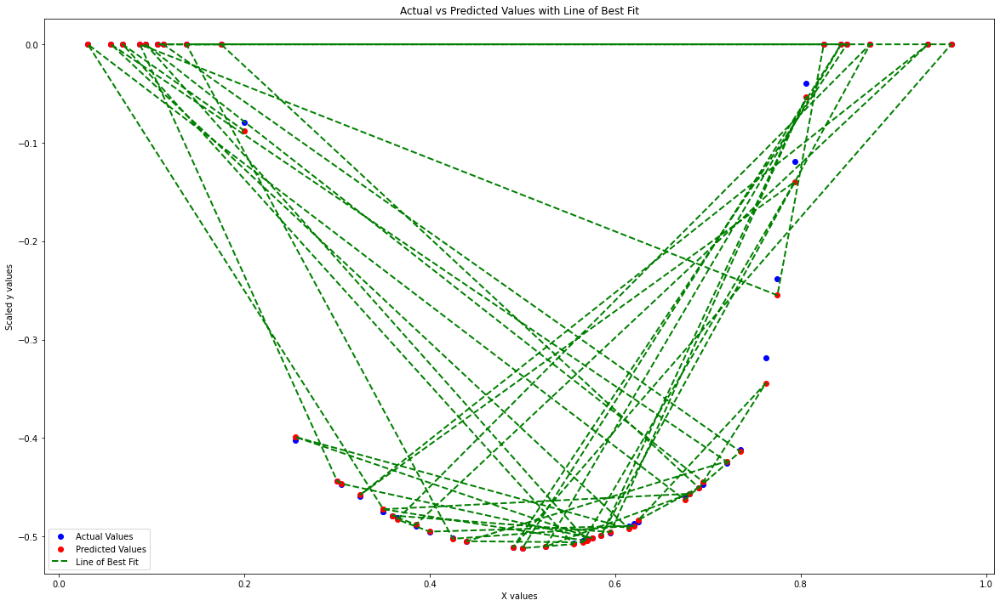

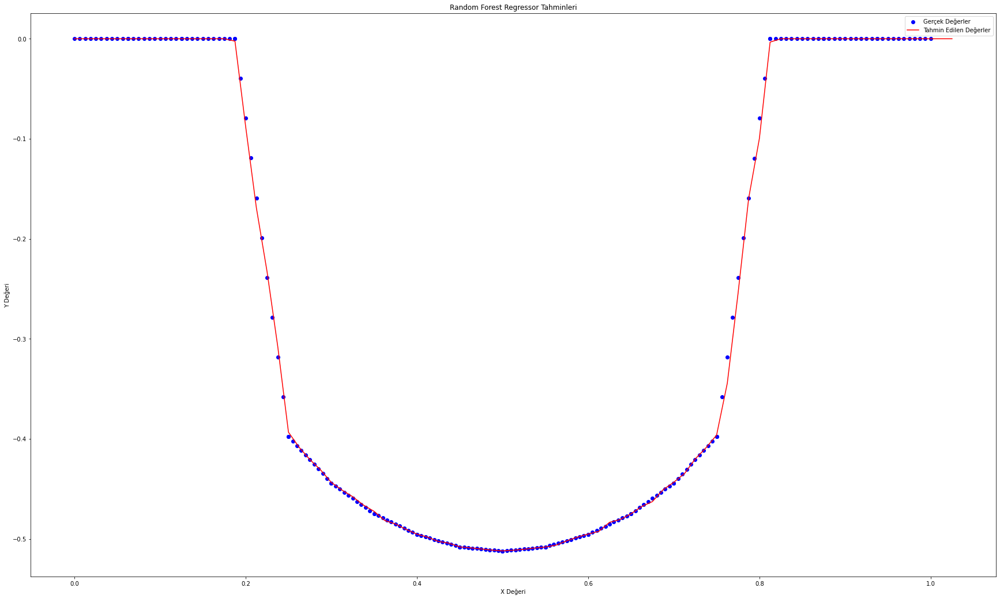

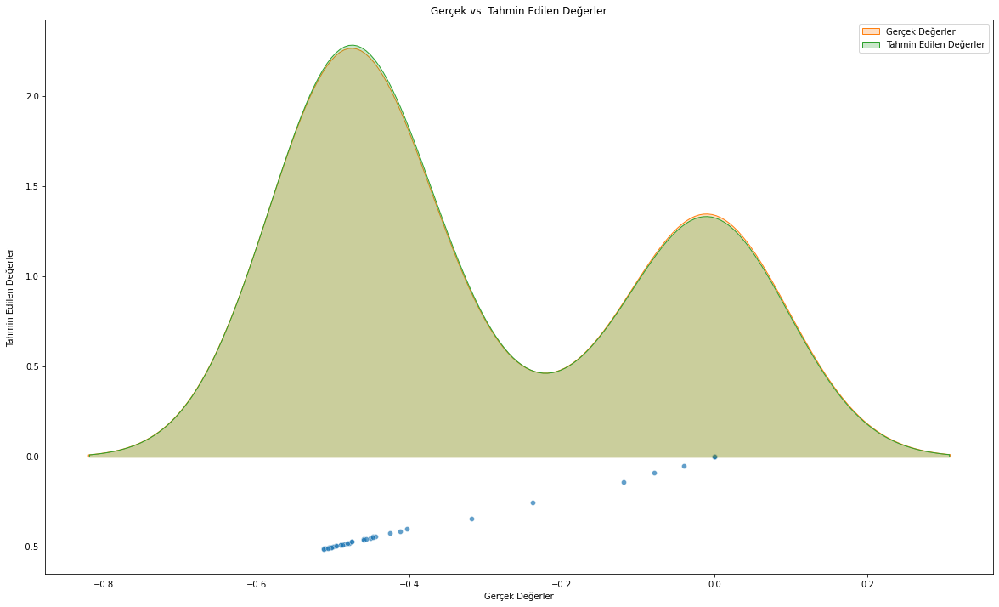

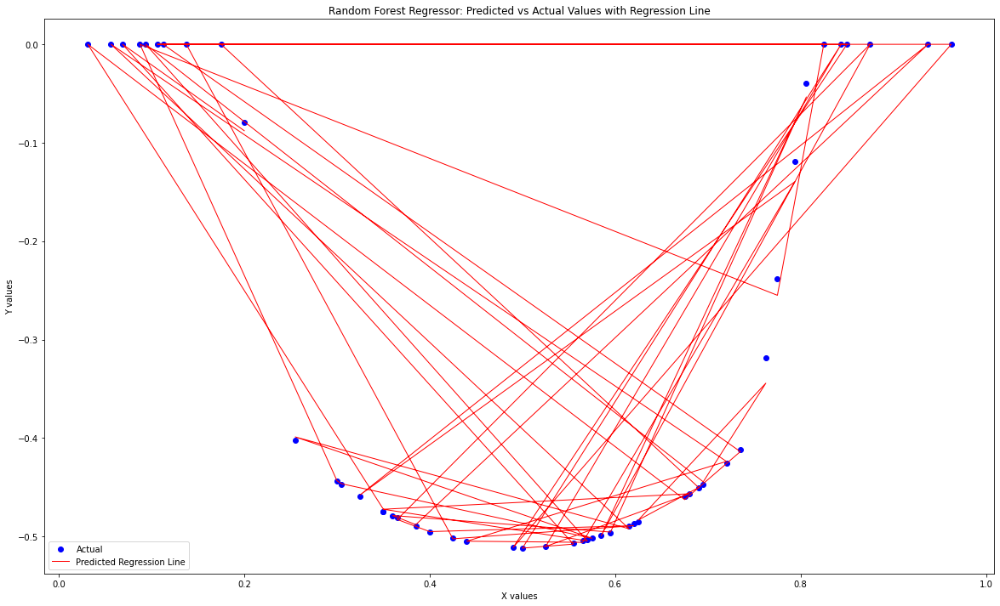

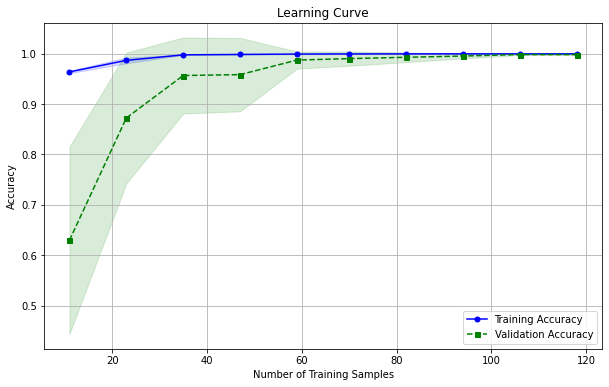

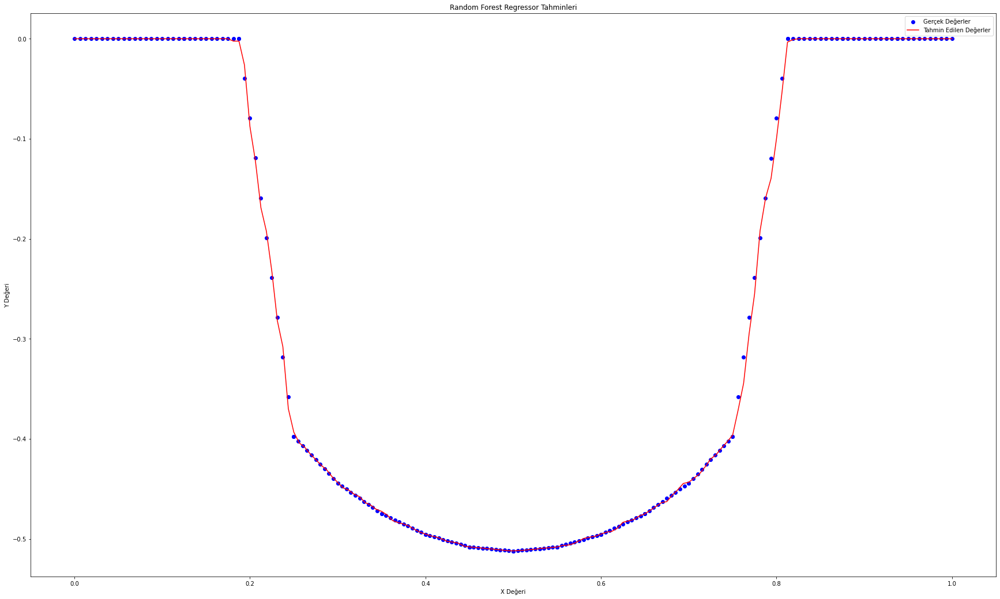

[-0.39]


In [180]:
rf_reg_N18 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_N18.fit(X_train_N18, y_train_N18)

y_pred_N18 = rf_reg_N18.predict(X_test_N18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N18.reshape(len(y_pred_N18),1), y_test_N18.reshape(len(y_test_N18),1)),1))

print(r2_score(y_test_N18, y_pred_N18))

# Use test and show results of test set
y_hat_N18 = rf_reg_N18.predict(X_N18)
mae = metrics.mean_absolute_error(y_N18,y_hat_N18)
mse = metrics.mean_squared_error(y_N18,y_hat_N18)
mape = np.mean(np.abs((y_N18 - y_hat_N18) / y_N18)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_N18.score(X_N18,y_N18))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_N18, y_test_N18, color='blue', label='Actual Values')
plt.scatter(X_test_N18, y_pred_N18, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_N18, y_pred_N18, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N18 = np.arange(0, 1.03125, 0.0125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N18 = rf_reg_N18.predict(X_values_N18)

# Gerçek değerler için aynı işlemi yap
y_true_values_N18 = rf_reg_N18.predict(X_N18)

plt.figure(figsize=(30, 18))
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N18, y_pred_values_N18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N18 = pd.DataFrame({'Gerçek Değerler': y_test_N18, 'Tahmin Edilen Değerler': y_pred_N18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N18 = pd.DataFrame({'Predicted': y_pred_N18, 'Actual': y_test_N18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N18, y_test_N18, color='blue', label='Actual')
plt.plot(X_test_N18, y_pred_N18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_N18, X=X_train_N18, y=y_train_N18, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N18 = rf_reg_N18.predict(X_values_N18)

# Gerçek değerler için aynı işlemi yap
y_true_values_N18 = rf_reg_N18.predict(X_N18)

plt.figure(figsize=(30, 18))
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N18, y_pred_values_N18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_N18.predict([[0.250]])) #0.250 == -3.976482e-01 gerçek değerde

### XGBRegressor ile deneyelim


[[-0.48 -0.47]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.44 -0.45]
 [-0.36 -0.32]
 [-0.48 -0.49]
 [-0.45 -0.45]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.2  -0.24]
 [ 0.    0.  ]
 [-0.44 -0.44]
 [-0.45 -0.45]
 [-0.5  -0.5 ]
 [-0.41 -0.4 ]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [-0.42 -0.43]
 [-0.51 -0.51]
 [-0.5  -0.5 ]
 [-0.16 -0.12]
 [-0.46 -0.46]
 [ 0.    0.  ]
 [-0.49 -0.49]
 [-0.48 -0.48]
 [-0.49 -0.5 ]
 [ 0.   -0.04]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [-0.49 -0.5 ]
 [-0.48 -0.49]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.41 -0.41]
 [-0.46 -0.46]
 [ 0.    0.  ]
 [-0.48 -0.47]
 [-0.45 -0.46]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [-0.5  -0.51]
 [ 0.    0.  ]
 [-0.12 -0.08]]
0.9966660380468947
TEST SET
MAE:                 0.0023526149596759926
RMSE:                0.006560866534462634
MAPE:                inf
r2:                  0.9991463985003218


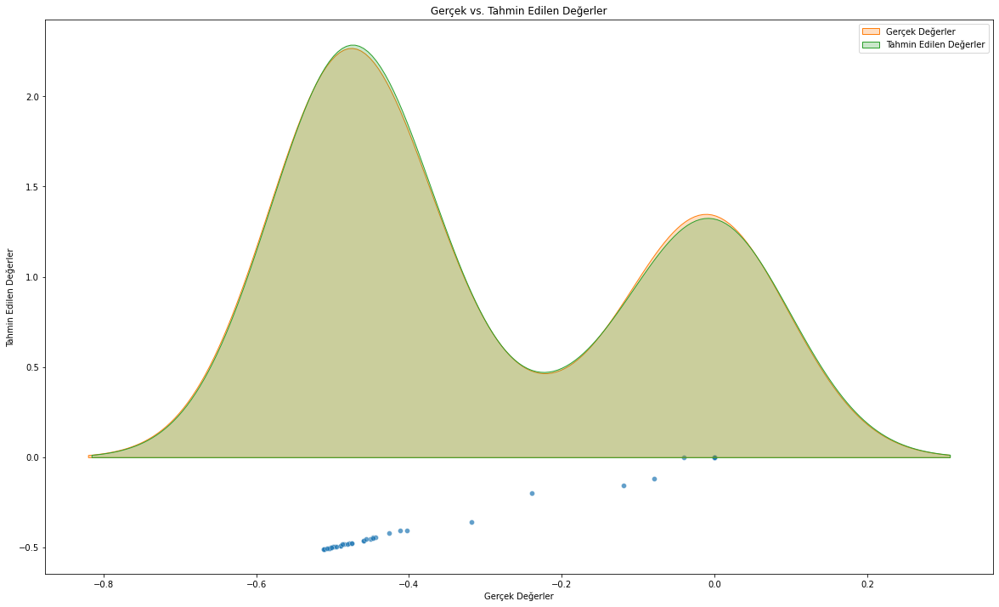

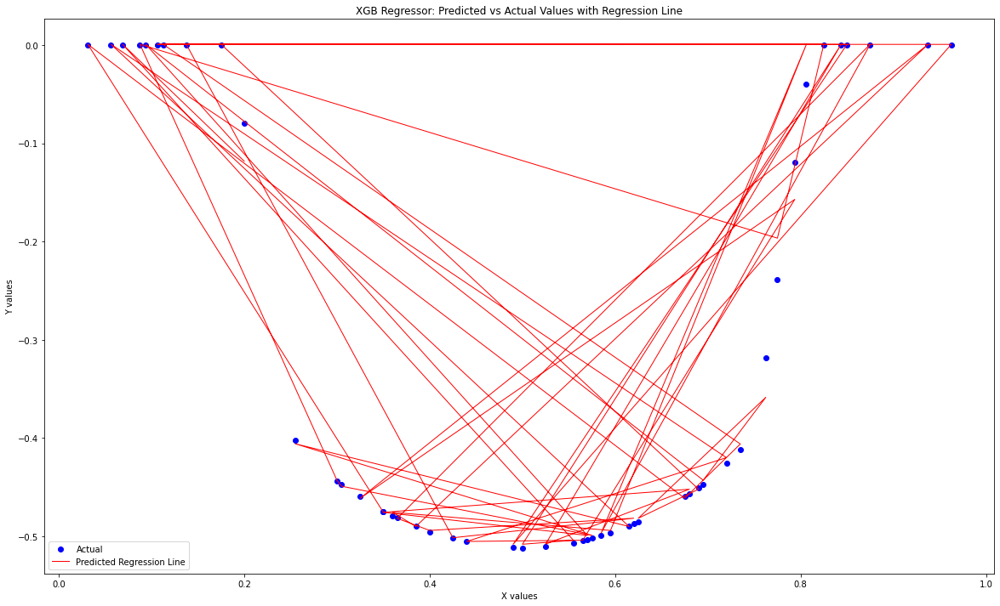

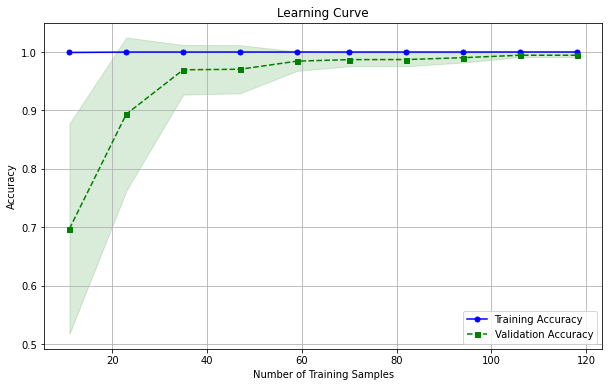

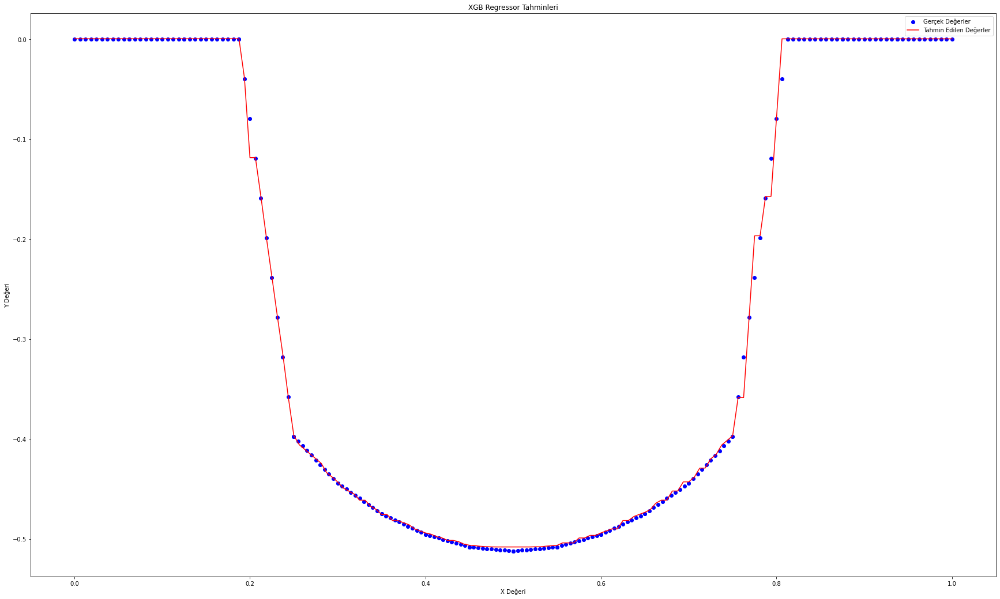

[-0.4]


In [181]:
from xgboost import XGBRegressor


xgb_N18 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_N18.fit(X_train_N18, y_train_N18)

y_pred_N18 = xgb_N18.predict(X_test_N18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N18.reshape(len(y_pred_N18),1), y_test_N18.reshape(len(y_test_N18),1)),1))


print(r2_score(y_test_N18, y_pred_N18))

# Use test and show results of test set
y_hat_N18 = xgb_N18.predict(X_N18)
mae = metrics.mean_absolute_error(y_N18,y_hat_N18)
mse = metrics.mean_squared_error(y_N18,y_hat_N18)
mape = np.mean(np.abs((y_N18 - y_hat_N18) / y_N18)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_N18.score(X_N18,y_N18))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N18 = pd.DataFrame({'Gerçek Değerler': y_test_N18, 'Tahmin Edilen Değerler': y_pred_N18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N18 = pd.DataFrame({'Predicted': y_pred_N18, 'Actual': y_test_N18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N18, y_test_N18, color='blue', label='Actual')
plt.plot(X_test_N18, y_pred_N18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_N18, X=X_train_N18, y=y_train_N18, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N18 = xgb_N18.predict(X_values_N18)

# Gerçek değerler için aynı işlemi yap
y_true_values_N18 = xgb_N18.predict(X_N18)

plt.figure(figsize=(30, 18))
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N18, y_pred_values_N18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_N18.predict([[0.250]])) #0.250 == -3.976482e-01 gerçek değerde

### GradientBoostingRegressor deneyelim


[[-4.72e-01 -4.75e-01]
 [-5.05e-01 -5.03e-01]
 [-4.27e-04  0.00e+00]
 [-4.44e-01 -4.47e-01]
 [-3.58e-01 -3.18e-01]
 [-4.83e-01 -4.85e-01]
 [-4.53e-01 -4.50e-01]
 [-4.27e-04  0.00e+00]
 [-4.27e-04  0.00e+00]
 [-3.73e-04  0.00e+00]
 [-2.80e-01 -2.39e-01]
 [-4.27e-04  0.00e+00]
 [-4.44e-01 -4.44e-01]
 [-4.44e-01 -4.47e-01]
 [-5.00e-01 -5.02e-01]
 [-3.98e-01 -4.02e-01]
 [-4.91e-01 -4.89e-01]
 [-4.27e-04  0.00e+00]
 [-4.21e-01 -4.26e-01]
 [-5.04e-01 -5.05e-01]
 [-5.05e-01 -5.04e-01]
 [-1.59e-01 -1.19e-01]
 [-4.56e-01 -4.59e-01]
 [-3.73e-04  0.00e+00]
 [-4.87e-01 -4.89e-01]
 [-4.77e-01 -4.79e-01]
 [-4.95e-01 -4.97e-01]
 [-7.98e-02 -3.98e-02]
 [-5.00e-01 -4.99e-01]
 [-3.73e-04  0.00e+00]
 [-4.83e-01 -4.81e-01]
 [-4.95e-01 -4.95e-01]
 [-4.91e-01 -4.87e-01]
 [-5.03e-01 -5.02e-01]
 [-4.27e-04  0.00e+00]
 [-3.73e-04  0.00e+00]
 [-5.09e-01 -5.11e-01]
 [-3.73e-04  0.00e+00]
 [-4.27e-04  0.00e+00]
 [-4.16e-01 -4.12e-01]
 [-4.63e-01 -4.59e-01]
 [-4.27e-04  0.00e+00]
 [-4.72e-01 -4.75e-01]
 [-4.53e-01

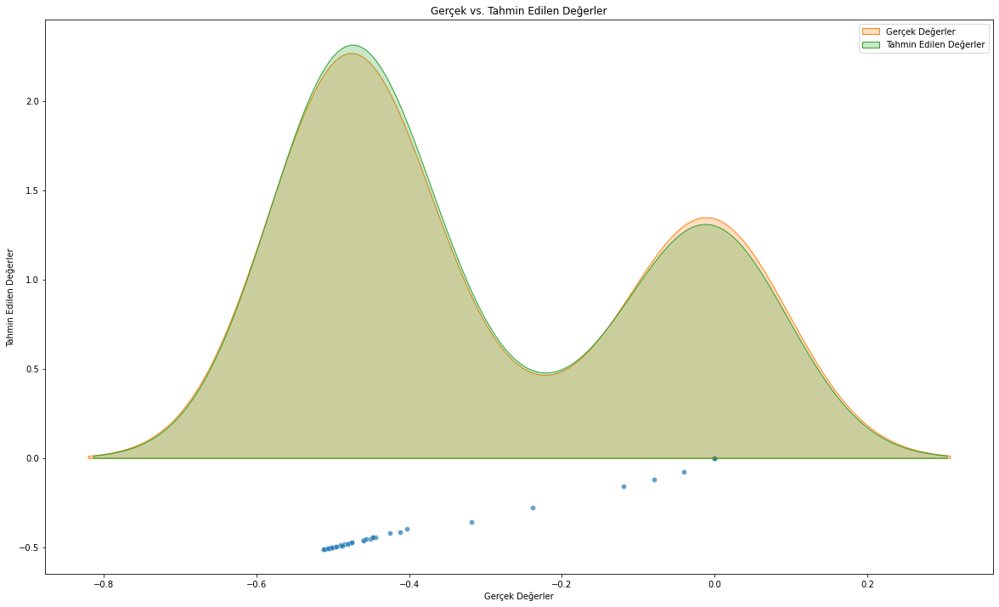

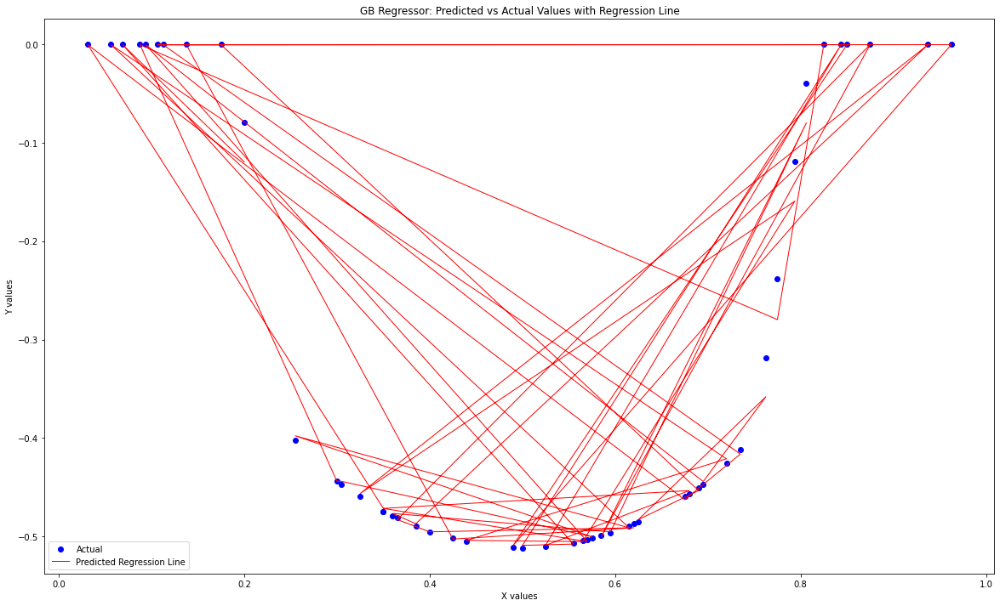

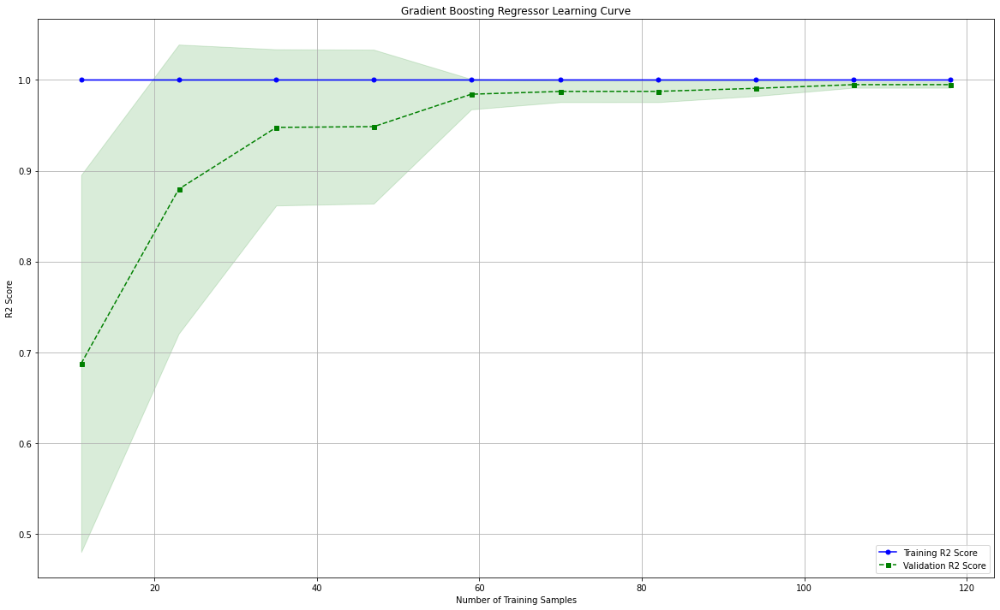

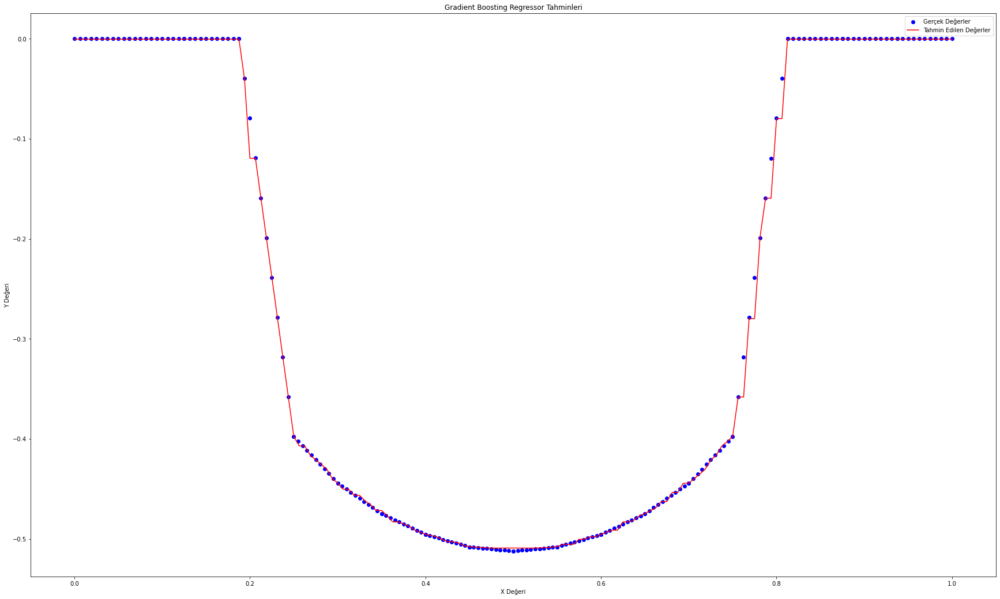

[-0.4]


In [182]:
gb_reg_N18 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_N18.fit(X_train_N18, y_train_N18)

y_pred_N18 = gb_reg_N18.predict(X_test_N18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N18.reshape(len(y_pred_N18),1), y_test_N18.reshape(len(y_test_N18),1)),1))


print(r2_score(y_test_N18, y_pred_N18))

# Use test and show results of test set
y_hat_N18 = gb_reg_N18.predict(X_N18)
mae = metrics.mean_absolute_error(y_N18,y_hat_N18)
mse = metrics.mean_squared_error(y_N18,y_hat_N18)
mape = np.mean(np.abs((y_N18 - y_hat_N18) / y_N18)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_N18.score(X_N18,y_N18))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N18 = pd.DataFrame({'Gerçek Değerler': y_test_N18, 'Tahmin Edilen Değerler': y_pred_N18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N18 = pd.DataFrame({'Predicted': y_pred_N18, 'Actual': y_test_N18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N18, y_test_N18, color='blue', label='Actual')
plt.plot(X_test_N18, y_pred_N18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_N18, X=X_train_N18, y=y_train_N18, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N18 = gb_reg_N18.predict(X_values_N18)

# Gerçek değerler için aynı işlemi yap
y_true_values_N18 = gb_reg_N18.predict(X_N18)

plt.figure(figsize=(30, 18))
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N18, y_pred_values_N18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_N18.predict([[0.250]])) #0.250 == -3.976482e-01 gerçek değerde

### SupportVectorRegressor deneyelim


[[-0.51 -0.47]
 [-0.55 -0.5 ]
 [ 0.04  0.  ]
 [-0.44 -0.45]
 [-0.28 -0.32]
 [-0.53 -0.49]
 [-0.45 -0.45]
 [-0.09  0.  ]
 [ 0.03  0.  ]
 [-0.11  0.  ]
 [-0.24 -0.24]
 [ 0.05  0.  ]
 [-0.43 -0.44]
 [-0.44 -0.45]
 [-0.55 -0.5 ]
 [-0.32 -0.4 ]
 [-0.54 -0.49]
 [ 0.05  0.  ]
 [-0.39 -0.43]
 [-0.55 -0.51]
 [-0.55 -0.5 ]
 [-0.19 -0.12]
 [-0.48 -0.46]
 [ 0.05  0.  ]
 [-0.54 -0.49]
 [-0.52 -0.48]
 [-0.55 -0.5 ]
 [-0.16 -0.04]
 [-0.55 -0.5 ]
 [ 0.    0.  ]
 [-0.53 -0.48]
 [-0.55 -0.5 ]
 [-0.54 -0.49]
 [-0.55 -0.5 ]
 [-0.01  0.  ]
 [ 0.04  0.  ]
 [-0.55 -0.51]
 [-0.05  0.  ]
 [ 0.03  0.  ]
 [-0.35 -0.41]
 [-0.48 -0.46]
 [ 0.03  0.  ]
 [-0.51 -0.47]
 [-0.47 -0.46]
 [-0.55 -0.51]
 [-0.06  0.  ]
 [-0.55 -0.51]
 [-0.55 -0.51]
 [ 0.05  0.  ]
 [-0.16 -0.08]]
0.9502961072999394
TEST SET
MAE:                 0.04335416632706122
RMSE:                0.050432794922309315
MAPE:                inf
r2:                  0.9495618862323201


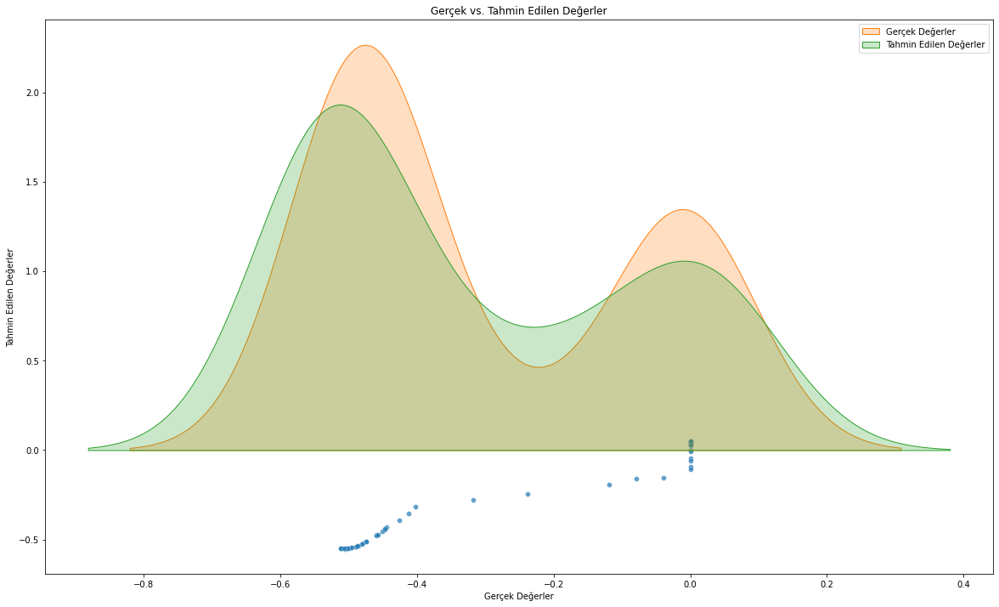

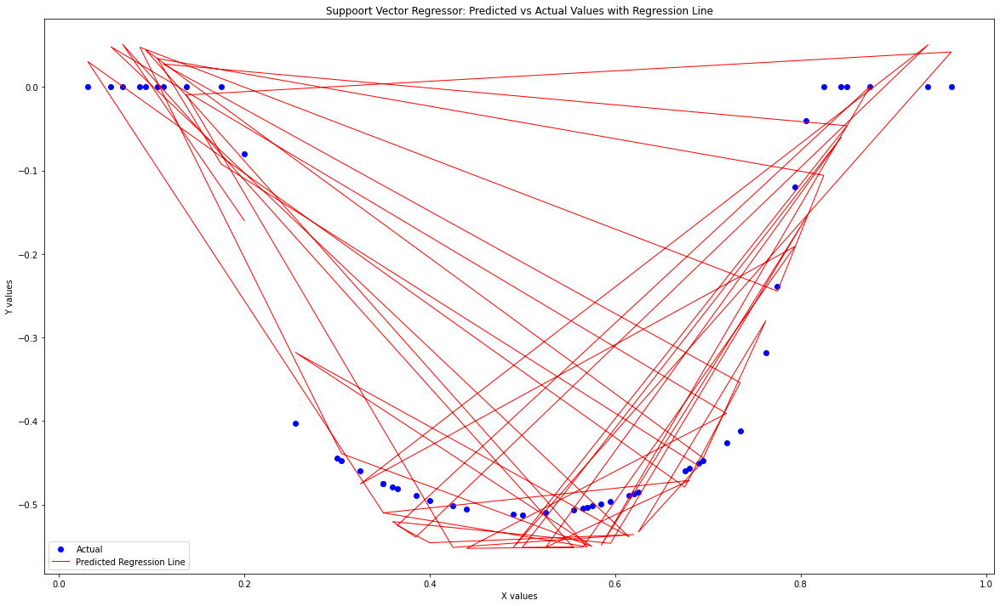

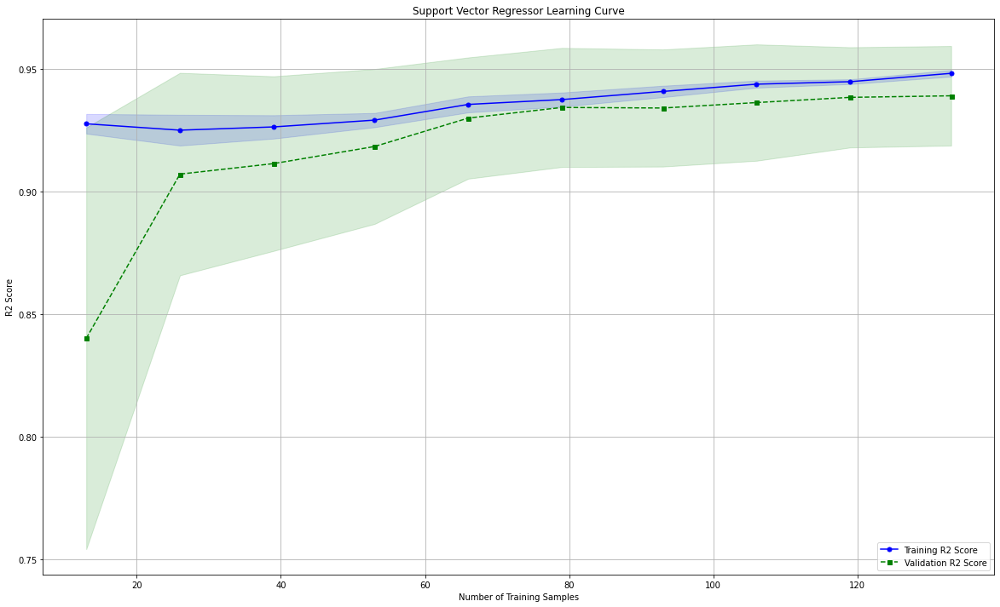

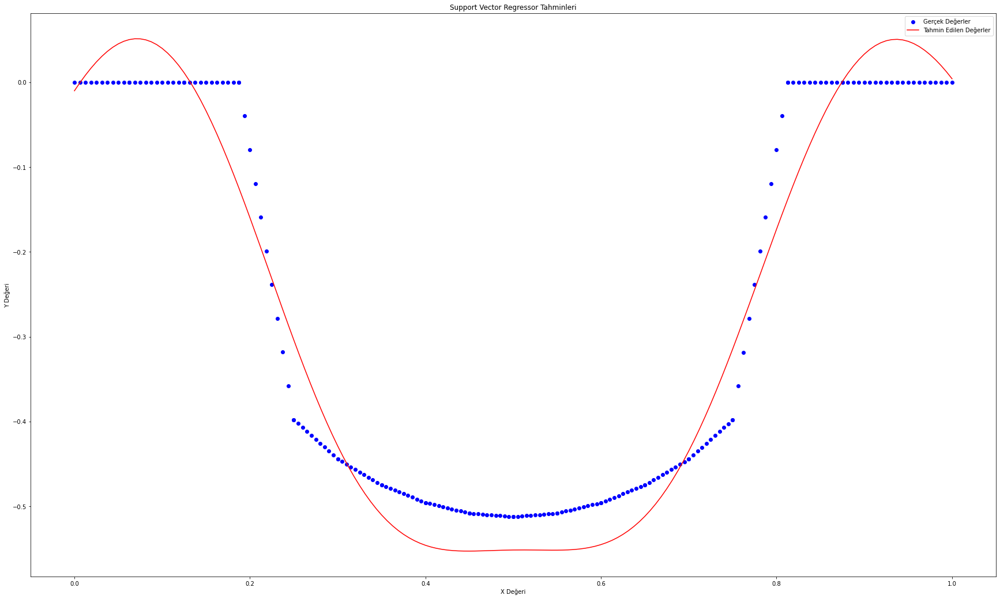

[-0.3]


In [183]:
svr_reg_N18 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_N18.fit(X_train_N18, y_train_N18)

y_pred_N18 = svr_reg_N18.predict(X_test_N18)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N18.reshape(len(y_pred_N18),1), y_test_N18.reshape(len(y_test_N18),1)),1))


print(r2_score(y_test_N18, y_pred_N18))


# Use test and show results of test set
y_hat_N18 = svr_reg_N18.predict(X_N18)
mae = metrics.mean_absolute_error(y_N18,y_hat_N18)
mse = metrics.mean_squared_error(y_N18,y_hat_N18)
mape = np.mean(np.abs((y_N18 - y_hat_N18) / y_N18)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_N18.score(X_N18,y_N18))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N18 = pd.DataFrame({'Gerçek Değerler': y_test_N18, 'Tahmin Edilen Değerler': y_pred_N18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N18 = pd.DataFrame({'Predicted': y_pred_N18, 'Actual': y_test_N18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N18, y_test_N18, color='blue', label='Actual')
plt.plot(X_test_N18, y_pred_N18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_N18, X=X_train_N18, y=y_train_N18, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N18 = svr_reg_N18.predict(X_values_N18)

# Gerçek değerler için aynı işlemi yap
y_true_values_N18 = svr_reg_N18.predict(X_N18)

plt.figure(figsize=(30, 18))
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N18, y_pred_values_N18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_N18.predict([[0.250]])) #0.250 == -3.976482e-01 gerçek değerde

### PolynomialRegressor ile deneyelim


R2 Score (Polynomial Regression):  0.947519575242814
MAE (Polynomial Regression):  0.038682350311376436
RMSE (Polynomial Regression):  0.05091682447978701
MAPE (Polynomial Regression):  inf


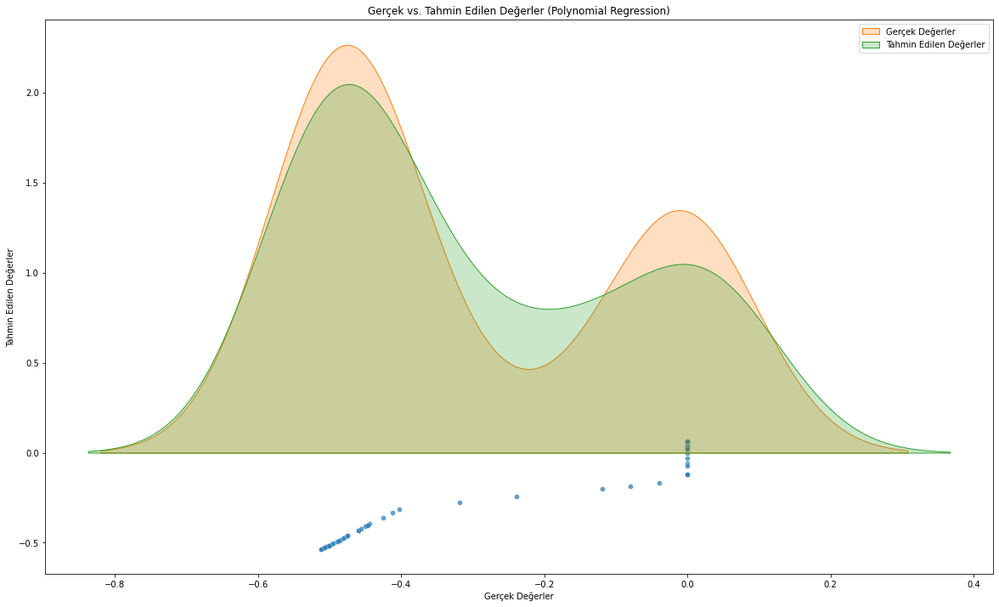

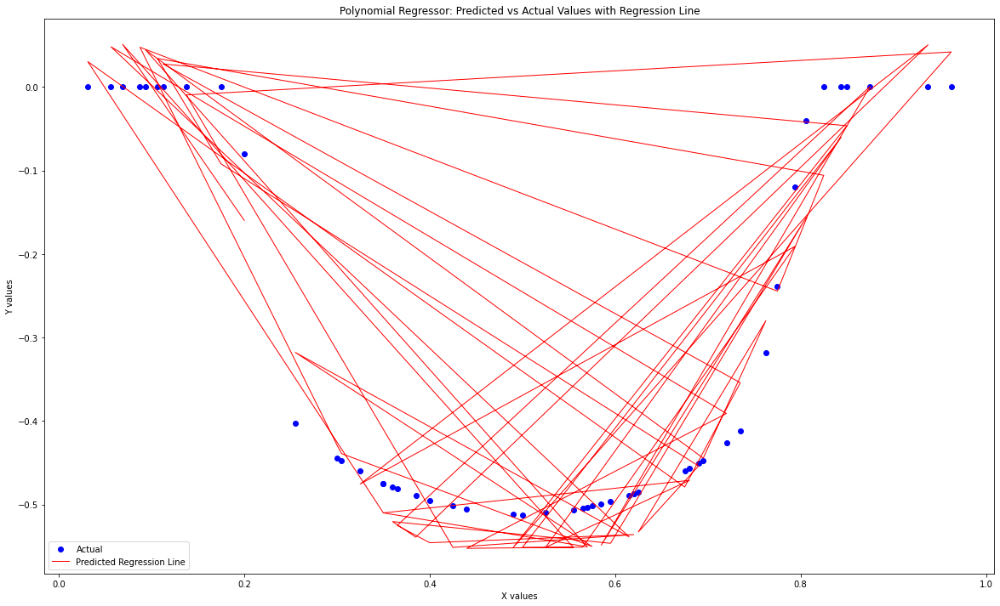

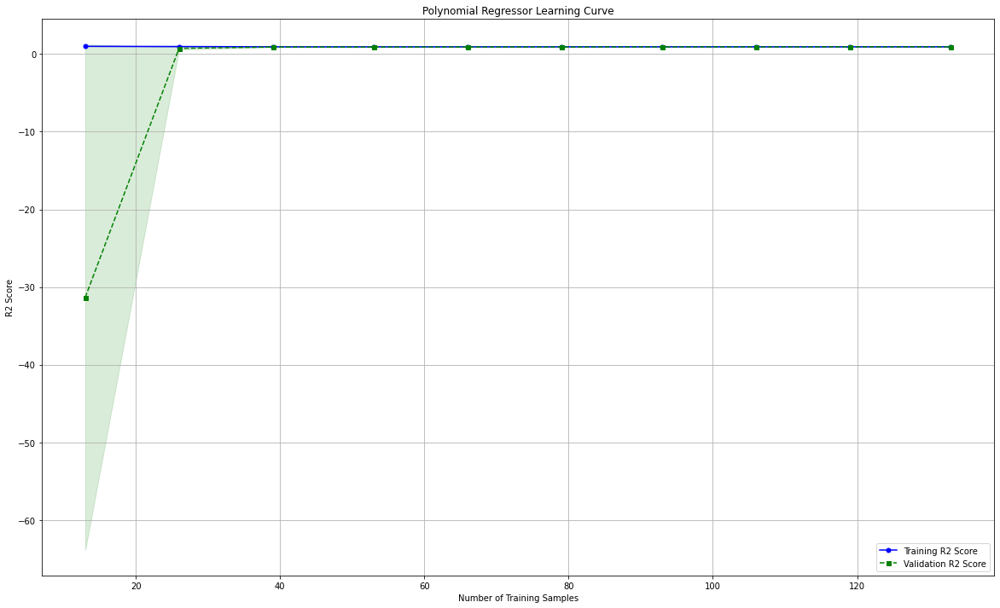

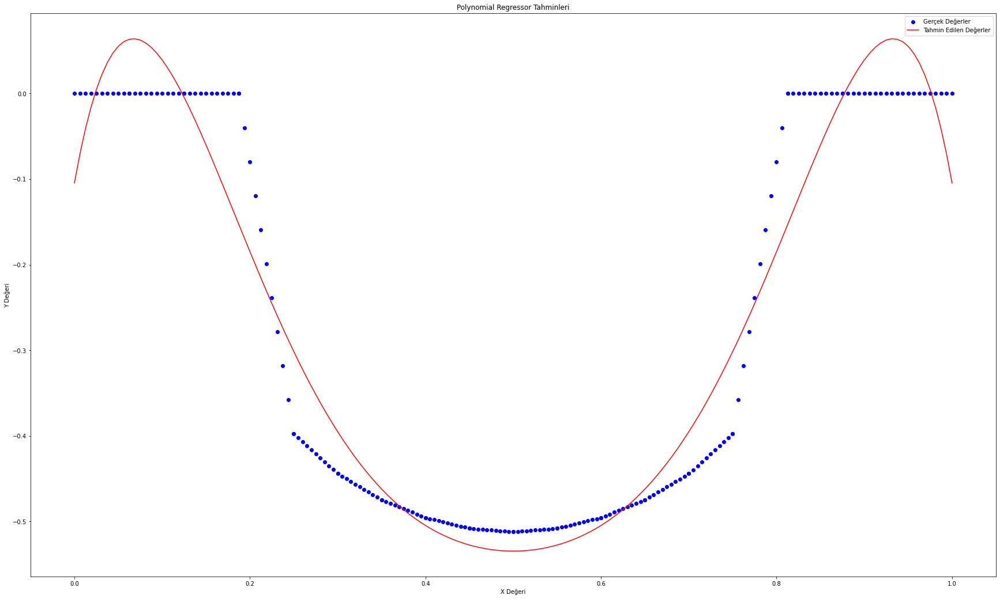

[-0.3]


In [184]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_N18 = PolynomialFeatures(degree=7)
X_poly_N18 = poly_N18.fit_transform(X_N18)

# Lineer Regresyon modeli oluşturma
poly_reg_N18 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_N18.fit(X_N18, y_N18)

# Tahminler yapma
y_pred_poly_N18 = poly_reg_N18.predict(X_test_N18)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_N18, y_pred_poly_N18))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_N18, y_pred_poly_N18))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_N18, y_pred_poly_N18)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_N18 - y_pred_poly_N18) / y_test_N18)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_N18 = pd.DataFrame({'Gerçek Değerler': y_test_N18, 'Tahmin Edilen Değerler': y_pred_poly_N18})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_N18, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N18['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_N18 = pd.DataFrame({'Predicted': y_pred_N18, 'Actual': y_test_N18})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N18, y_test_N18, color='blue', label='Actual')
plt.plot(X_test_N18, y_pred_N18, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_N18, X=X_train_N18, y=y_train_N18, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N18 = np.arange(0, 1.00625, 0.00625).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N18 = poly_reg_N18.predict(X_values_N18)

# Gerçek değerler için aynı işlemi yap
y_true_values_N18 = poly_reg_N18.predict(X_N18)

plt.figure(figsize=(30, 18))
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N18, y_pred_values_N18, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_N18.predict([[0.250]])) #0.250 == -3.976482e-01 gerçek değerde

### Multi-Layer Perceptron

In [185]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_N18, y_train_N18,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test_N18)

Epoch 1/100
4/4 [==============================] - 1s 43ms/step - loss: 0.1239 - mae: 0.2704 - val_loss: 0.1418 - val_mae: 0.3096
Epoch 2/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1215 - mae: 0.2692 - val_loss: 0.1391 - val_mae: 0.3078
Epoch 3/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1193 - mae: 0.2683 - val_loss: 0.1364 - val_mae: 0.3060
Epoch 4/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1169 - mae: 0.2671 - val_loss: 0.1337 - val_mae: 0.3041
Epoch 5/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1146 - mae: 0.2661 - val_loss: 0.1309 - val_mae: 0.3022
Epoch 6/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1121 - mae: 0.2647 - val_loss: 0.1281 - val_mae: 0.3002
Epoch 7/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1098 - mae: 0.2637 - val_loss: 0.1252 - val_mae: 0.2981
Epoch 8/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1073 - mae: 0.262

Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0513 - mae: 0.2184 - val_loss: 0.0495 - val_mae: 0.2140
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0513 - mae: 0.2182 - val_loss: 0.0495 - val_mae: 0.2141
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0513 - mae: 0.2183 - val_loss: 0.0495 - val_mae: 0.2142
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0513 - mae: 0.2182 - val_loss: 0.0495 - val_mae: 0.2141
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0513 - mae: 0.2181 - val_loss: 0.0495 - val_mae: 0.2139
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0513 - mae: 0.2183 - val_loss: 0.0495 - val_mae: 0.2142
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0513 - mae: 0.2182 - val_loss: 0.0495 - val_mae: 0.2141
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0513 - mae

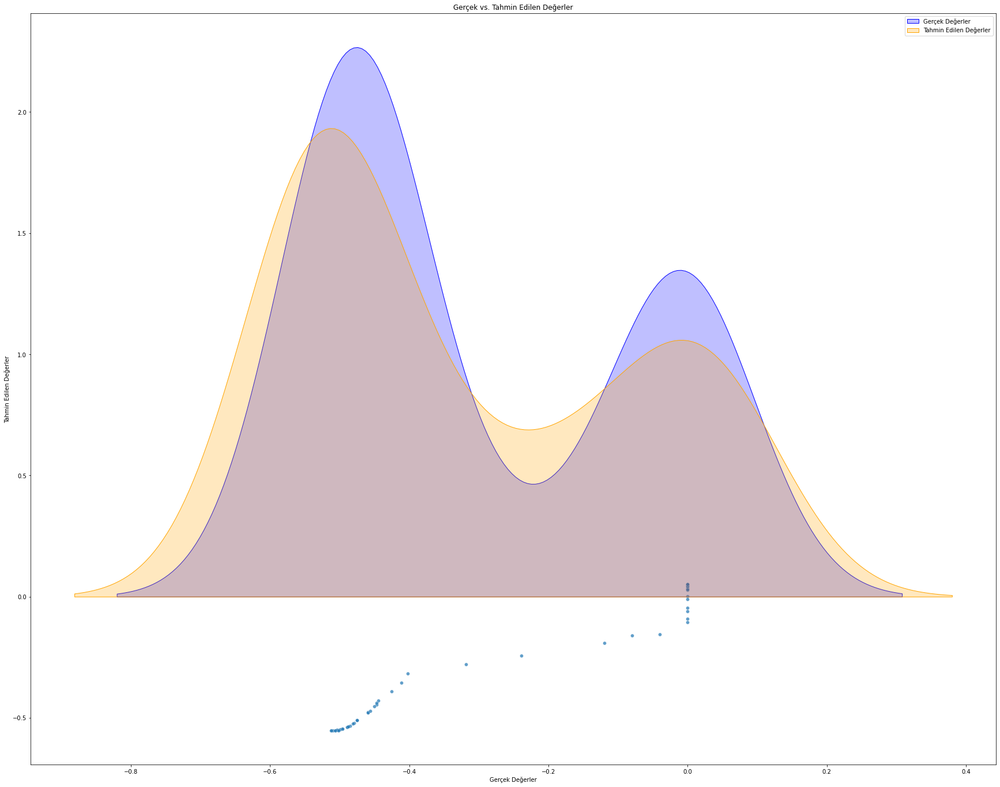

In [186]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_N18 = pd.DataFrame({'Gerçek Değerler': y_test_N18.flatten(), 'Tahmin Edilen Değerler': y_pred_N18.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N18, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N18['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
5/5 [==============================] - 0s 15ms/step - loss: 0.0498 - mae: 0.2148 - val_loss: 0.0613 - val_mae: 0.2469
Epoch 2/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0498 - mae: 0.2143 - val_loss: 0.0606 - val_mae: 0.2452
Epoch 3/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0497 - mae: 0.2137 - val_loss: 0.0603 - val_mae: 0.2443
Epoch 4/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0497 - mae: 0.2133 - val_loss: 0.0599 - val_mae: 0.2433
Epoch 5/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0498 - mae: 0.2129 - val_loss: 0.0596 - val_mae: 0.2423
Epoch 6/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0498 - mae: 0.2125 - val_loss: 0.0596 - val_mae: 0.2422
Epoch 7/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0498 - mae: 0.2125 - val_loss: 0.0597 - val_mae: 0.2426
Epoch 8/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0498 - mae: 0.2130 - val_loss: 

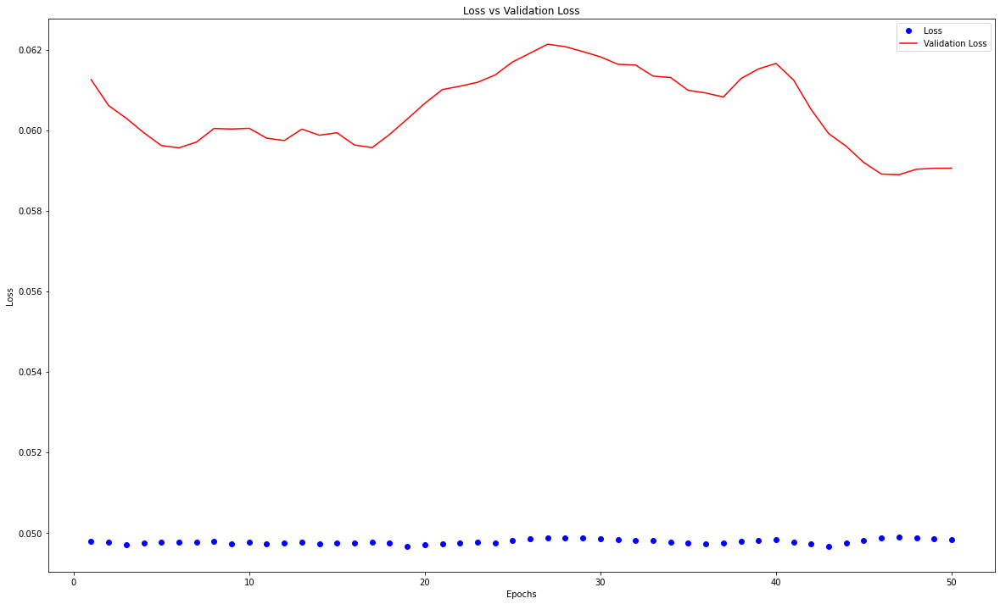

In [187]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_N18, y_train_N18, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması


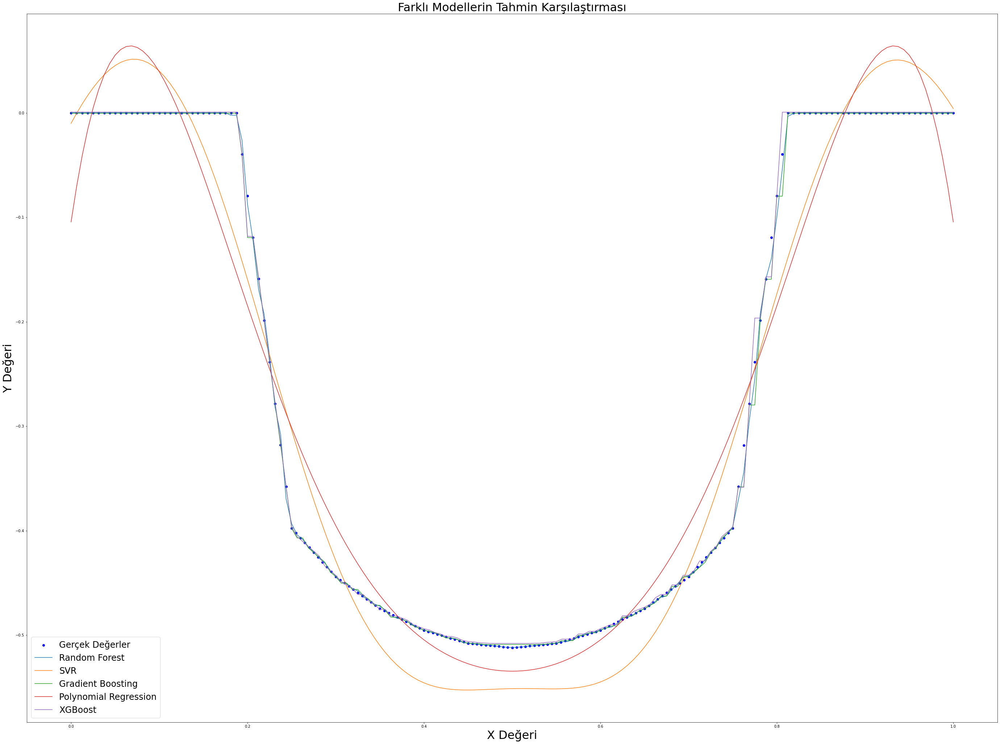

In [188]:
y_pred_rf_N18 = rf_reg_N18.predict(X_values_N18)
y_pred_svr_N18 = svr_reg_N18.predict(X_values_N18)  
y_pred_gb_N18 = gb_reg_N18.predict(X_values_N18)
y_pred_poly_N18 = poly_reg_N18.predict(X_values_N18)
y_pred_xgb_N18 = xgb_N18.predict(X_values_N18)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_N18, y_N18, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_N18, y_pred_rf_N18, label='Random Forest')
plt.plot(X_values_N18, y_pred_svr_N18, label='SVR')
plt.plot(X_values_N18, y_pred_gb_N18, label='Gradient Boosting')
plt.plot(X_values_N18, y_pred_poly_N18, label='Polynomial Regression')
plt.plot(X_values_N18, y_pred_xgb_N18, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

### N20 Verileri için Modeller

In [191]:
data_N20 = pd.read_excel('N verileri.xlsx')
data_N20 = data_N20.iloc[:, 8:10] #  9. ve 10. kolonları seçelim
data_N20

,N20_FI_X1_iz10_imort,N20_X1_fi
0,0.0,0.000000e+00
1,0.5,0.000000e+00
2,1.0,0.000000e+00
3,1.5,0.000000e+00
4,2.0,0.000000e+00
5,2.5,0.000000e+00
6,3.0,0.000000e+00
7,3.5,0.000000e+00
8,4.0,0.000000e+00
9,4.5,0.000000e+00


In [192]:
data_N20 = data_N20.loc[:219,:] 
data_N20['N20_FI_X1_iz10_imort'] = data_N20['N20_FI_X1_iz10_imort'] / 100 # koordinat değerlerini / 10 yapmam gerekli
data_N20

,N20_FI_X1_iz10_imort,N20_X1_fi
0,0.000,0.000000e+00
1,0.005,0.000000e+00
2,0.010,0.000000e+00
3,0.015,0.000000e+00
4,0.020,0.000000e+00
5,0.025,0.000000e+00
6,0.030,0.000000e+00
7,0.035,0.000000e+00
8,0.040,0.000000e+00
9,0.045,0.000000e+00


In [193]:
data_N20.columns[data_N20.isnull().any()]

Index([], dtype='object')

In [194]:
data_N20.isna().any()

N20_FI_X1_iz10_imort    False
N20_X1_fi               False
dtype: bool

In [195]:
data_N20.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   N20_FI_X1_iz10_imort  220 non-null    float64
 1   N20_X1_fi             220 non-null    float64
dtypes: float64(2)
memory usage: 3.6 KB


In [196]:
data_N20.describe().T

,count,mean,std,min,25%,50%,75%,max
N20_FI_X1_iz10_imort,220.0,0.50000,0.289406,0.000000,0.250000,0.500000,0.75,1.000000e+00
N20_X1_fi,220.0,-0.25778,0.230284,-0.512146,-0.485129,-0.399335,0.00,5.951190e-09


### veri kontrol edildi, problem yok

In [197]:
X_N20 = data_N20.iloc[:, :1].values
y_N20 = data_N20.iloc[:,1].values

In [198]:
X_N20.shape, y_N20.shape

((220, 1), (220,))

In [199]:
X_train_N20, X_test_N20, y_train_N20, y_test_N20 = train_test_split(X_N20, y_N20, test_size=0.25, random_state=42)

### RandomForestRegressor

[[-4.95e-01 -4.96e-01]
 [-4.61e-01 -4.59e-01]
 [-5.02e-01 -5.02e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-5.10e-01 -5.10e-01]
 [-1.01e-01 -1.20e-01]
 [ 0.00e+00  0.00e+00]
 [-4.71e-01 -4.72e-01]
 [-4.73e-01 -4.75e-01]
 [-5.08e-01 -5.08e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.46e-01 -4.47e-01]
 [ 0.00e+00  0.00e+00]
 [-1.31e-02  5.95e-09]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.43e-01 -4.44e-01]
 [ 0.00e+00  0.00e+00]
 [-5.04e-01 -5.05e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-5.01e-01 -5.01e-01]
 [ 0.00e+00  0.00e+00]
 [-5.08e-01 -5.07e-01]
 [ 0.00e+00  0.00e+00]
 [-1.12e-02 -3.99e-02]
 [-4.45e-01 -4.44e-01]
 [-5.12e-01 -5.12e-01]
 [-3.88e-01 -3.99e-01]
 [-5.11e-01 -5.12e-01]
 [ 0.00e+00  0.00e+00]
 [-4.64e-01 -4.66e-01]
 [-5.12e-01 -5.12e-01]
 [-4.84e-01 -4.85e-01]
 [-4.84e-01 -4.83e-01]
 [-4.75e-01 -4.77e-01]
 [-5.09e-01 -5.09e-01]
 [-4.95e-01 -4.93e-01]
 [ 0.00e+00  0.00e+00]
 [-5.08e-01 -5.08e-01]
 [-5.04e-01

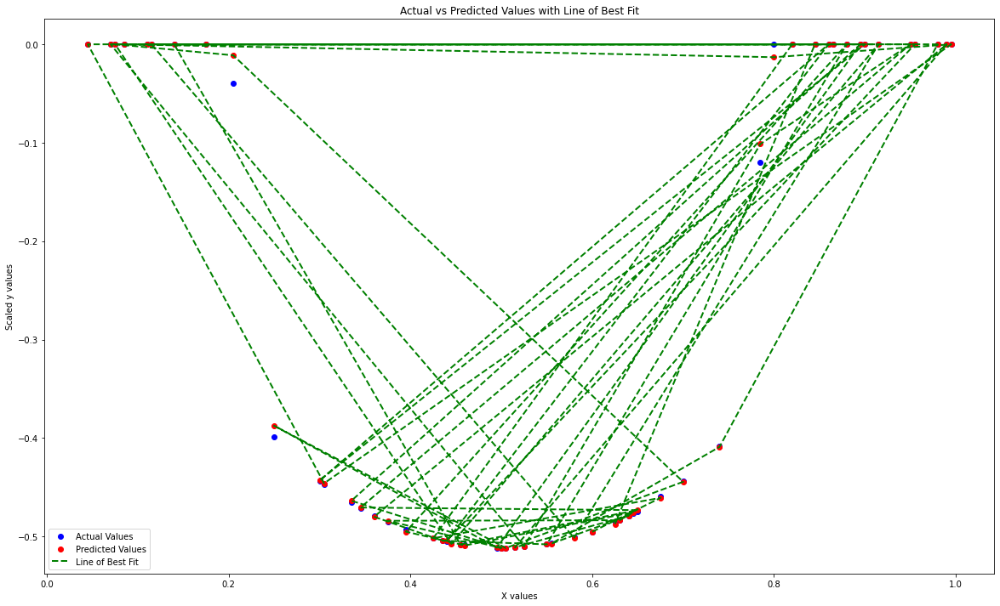

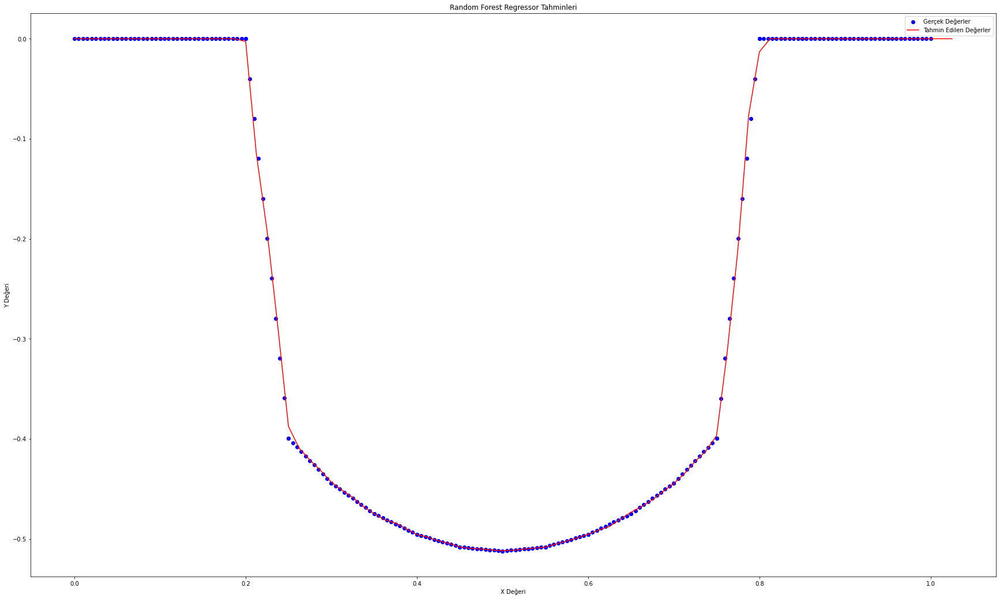

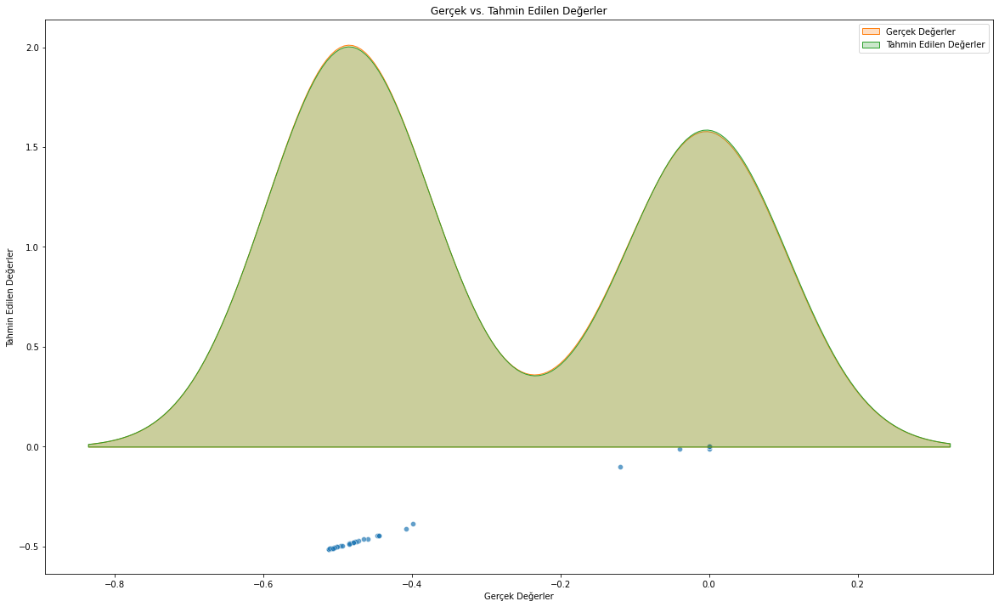

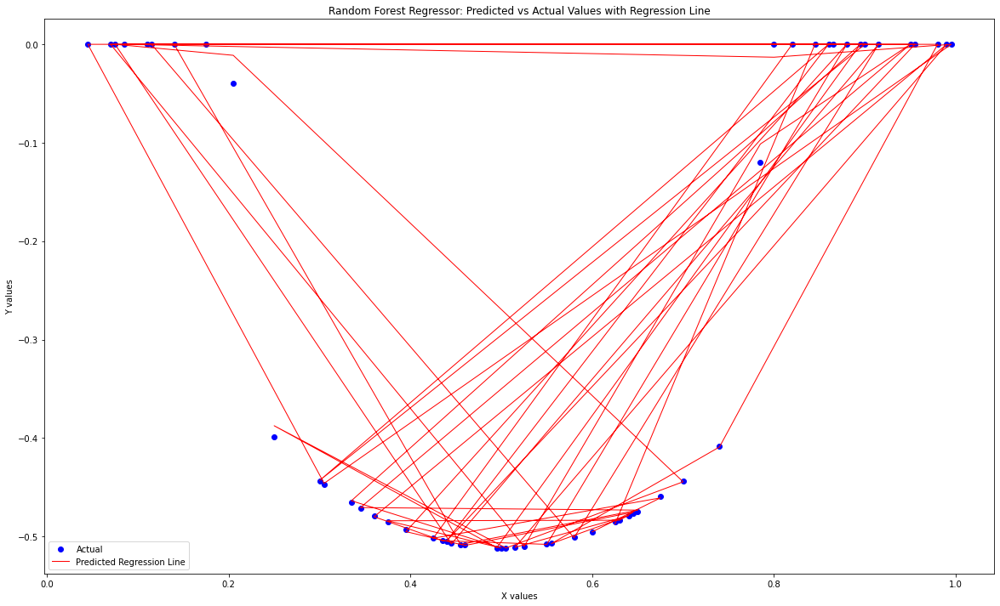

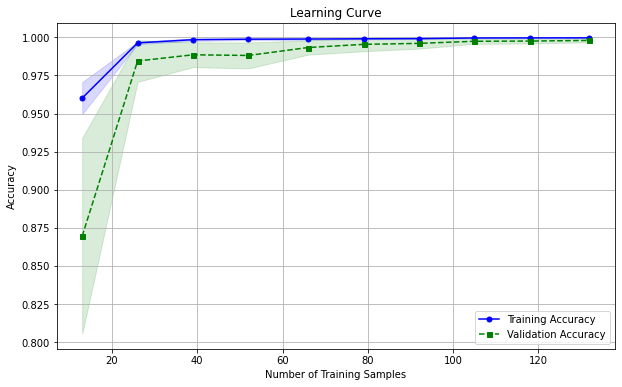

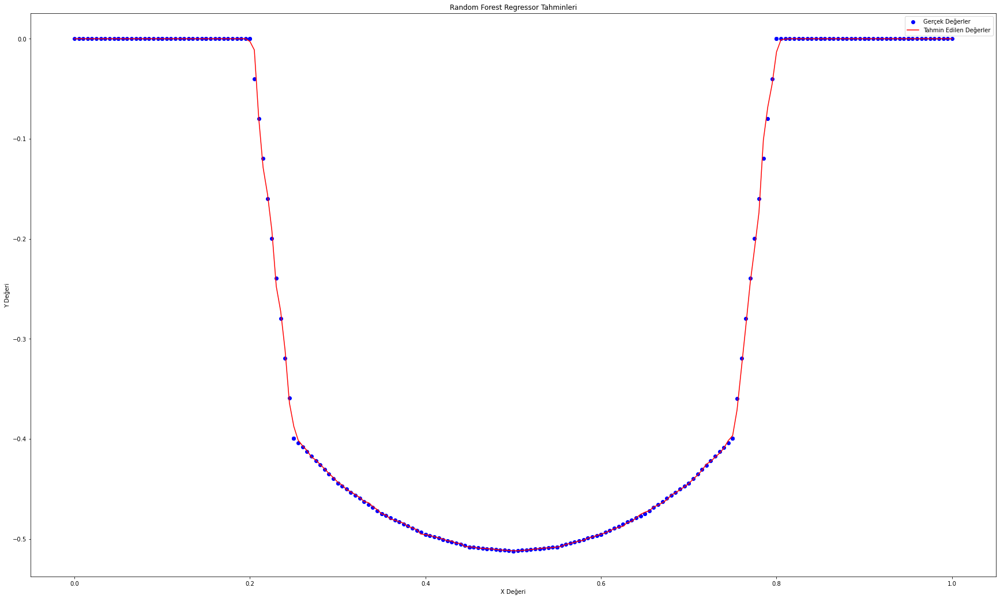

[-0.39]


In [200]:
rf_reg_N20 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_N20.fit(X_train_N20, y_train_N20)

y_pred_N20 = rf_reg_N20.predict(X_test_N20)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N20.reshape(len(y_pred_N20),1), y_test_N20.reshape(len(y_test_N20),1)),1))

print(r2_score(y_test_N20, y_pred_N20))

# Use test and show results of test set
y_hat_N20 = rf_reg_N20.predict(X_N20)
mae = metrics.mean_absolute_error(y_N20,y_hat_N20)
mse = metrics.mean_squared_error(y_N20,y_hat_N20)
mape = np.mean(np.abs((y_N20 - y_hat_N20) / y_N20)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_N20.score(X_N20,y_N20))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_N20, y_test_N20, color='blue', label='Actual Values')
plt.scatter(X_test_N20, y_pred_N20, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_N20, y_pred_N20, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N20 = np.arange(0, 1.03125, 0.0125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N20 = rf_reg_N20.predict(X_values_N20)

# Gerçek değerler için aynı işlemi yap
y_true_values_N20 = rf_reg_N20.predict(X_N20)

plt.figure(figsize=(30, 18))
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N20, y_pred_values_N20, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N20 = pd.DataFrame({'Gerçek Değerler': y_test_N20, 'Tahmin Edilen Değerler': y_pred_N20})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N20, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N20 = pd.DataFrame({'Predicted': y_pred_N20, 'Actual': y_test_N20})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N20, y_test_N20, color='blue', label='Actual')
plt.plot(X_test_N20, y_pred_N20, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_N20, X=X_train_N20, y=y_train_N20, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N20 = np.arange(0, 1.005, 0.005).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N20 = rf_reg_N20.predict(X_values_N20)

# Gerçek değerler için aynı işlemi yap
y_true_values_N20 = rf_reg_N20.predict(X_N20)

plt.figure(figsize=(30, 18))
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N20, y_pred_values_N20, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_N20.predict([[0.250]])) #0.250 == -3.992917e-01 gerçek değerde

### XGBRegressor ile deneyelim


[[-4.94e-01 -4.96e-01]
 [-4.55e-01 -4.59e-01]
 [-5.01e-01 -5.02e-01]
 [ 6.83e-04  0.00e+00]
 [ 6.34e-04  0.00e+00]
 [-5.07e-01 -5.10e-01]
 [-7.89e-02 -1.20e-01]
 [ 6.83e-04  0.00e+00]
 [-4.73e-01 -4.72e-01]
 [-4.73e-01 -4.75e-01]
 [-5.06e-01 -5.08e-01]
 [ 6.34e-04  0.00e+00]
 [ 6.83e-04  0.00e+00]
 [ 6.34e-04  0.00e+00]
 [-4.49e-01 -4.47e-01]
 [ 6.83e-04  0.00e+00]
 [ 6.83e-04  5.95e-09]
 [ 6.34e-04  0.00e+00]
 [ 6.83e-04  0.00e+00]
 [-4.43e-01 -4.44e-01]
 [ 6.83e-04  0.00e+00]
 [-5.06e-01 -5.05e-01]
 [ 6.83e-04  0.00e+00]
 [ 6.34e-04  0.00e+00]
 [-4.98e-01 -5.01e-01]
 [ 6.83e-04  0.00e+00]
 [-5.06e-01 -5.07e-01]
 [ 6.34e-04  0.00e+00]
 [-7.88e-02 -3.99e-02]
 [-4.43e-01 -4.44e-01]
 [-5.08e-01 -5.12e-01]
 [-3.98e-01 -3.99e-01]
 [-5.08e-01 -5.12e-01]
 [ 6.83e-04  0.00e+00]
 [-4.67e-01 -4.66e-01]
 [-5.08e-01 -5.12e-01]
 [-4.86e-01 -4.85e-01]
 [-4.80e-01 -4.83e-01]
 [-4.73e-01 -4.77e-01]
 [-5.07e-01 -5.09e-01]
 [-4.94e-01 -4.93e-01]
 [ 6.83e-04  0.00e+00]
 [-5.06e-01 -5.08e-01]
 [-5.01e-01

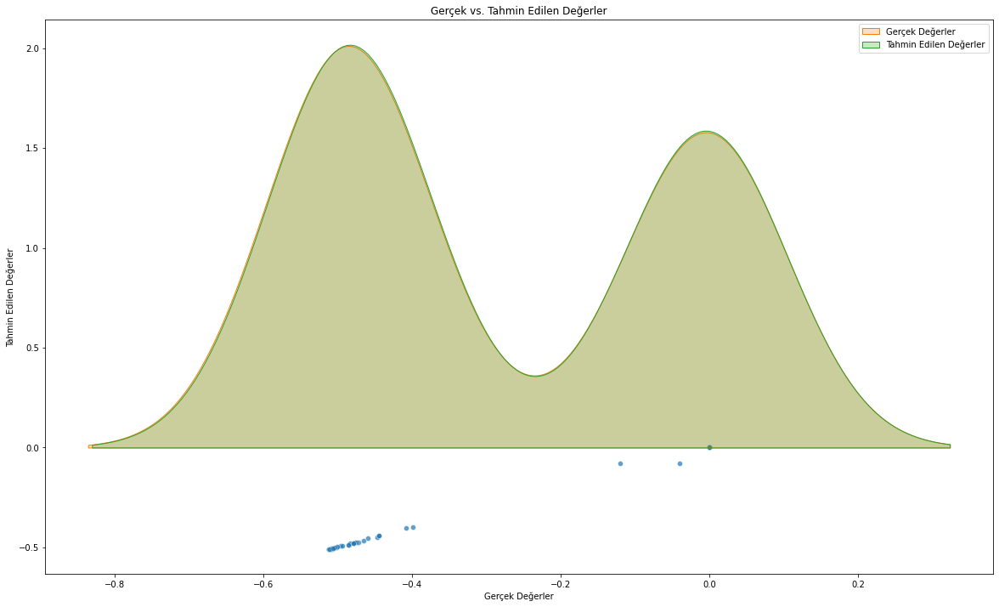

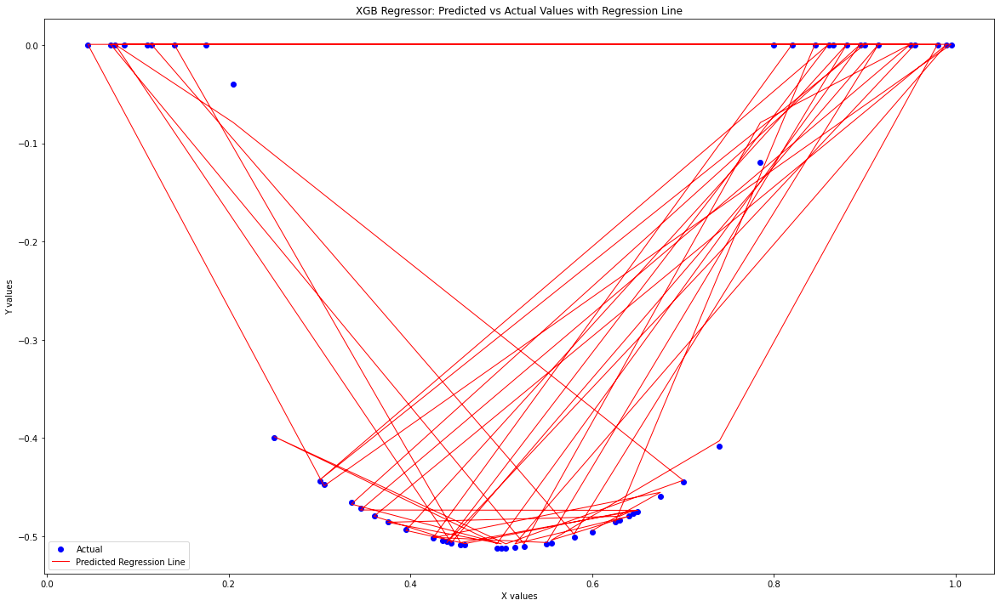

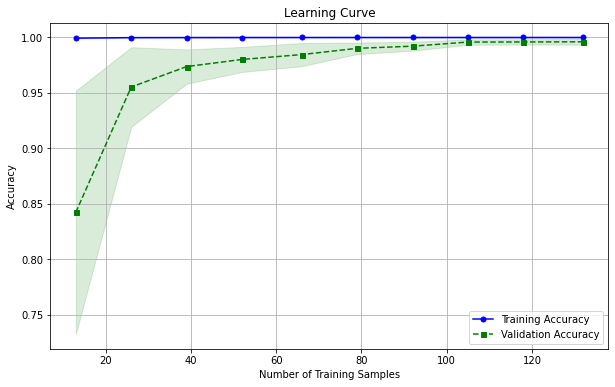

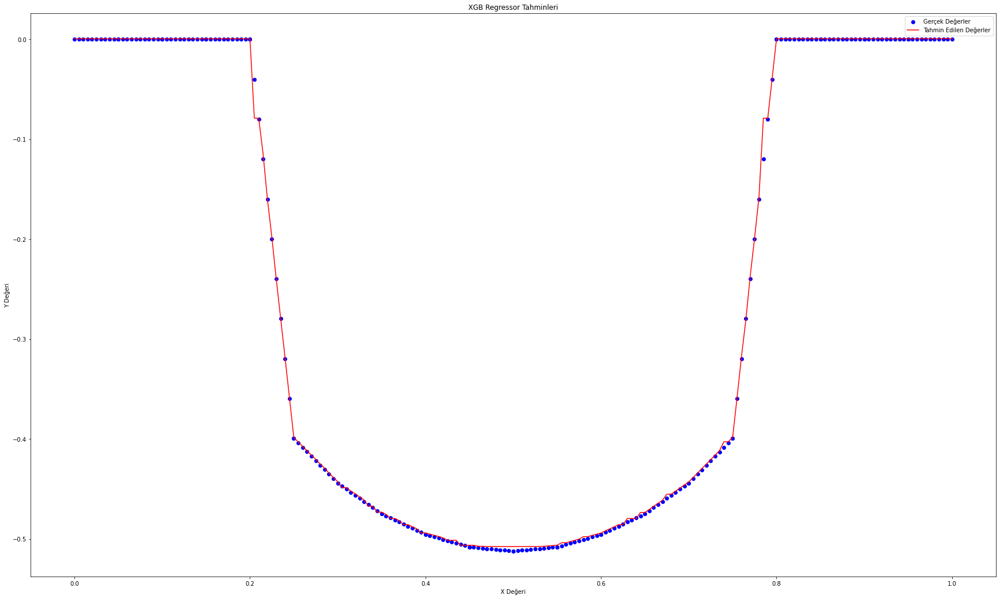

[-0.4]


In [201]:
from xgboost import XGBRegressor


xgb_N20 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_N20.fit(X_train_N20, y_train_N20)

y_pred_N20 = xgb_N20.predict(X_test_N20)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N20.reshape(len(y_pred_N20),1), y_test_N20.reshape(len(y_test_N20),1)),1))


print(r2_score(y_test_N20, y_pred_N20))

# Use test and show results of test set
y_hat_N20 = xgb_N20.predict(X_N20)
mae = metrics.mean_absolute_error(y_N20,y_hat_N20)
mse = metrics.mean_squared_error(y_N20,y_hat_N20)
mape = np.mean(np.abs((y_N20 - y_hat_N20) / y_N20)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_N20.score(X_N20,y_N20))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N20 = pd.DataFrame({'Gerçek Değerler': y_test_N20, 'Tahmin Edilen Değerler': y_pred_N20})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N20, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N20 = pd.DataFrame({'Predicted': y_pred_N20, 'Actual': y_test_N20})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N20, y_test_N20, color='blue', label='Actual')
plt.plot(X_test_N20, y_pred_N20, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_N20, X=X_train_N20, y=y_train_N20, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N20 = np.arange(0, 1.005, 0.005).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N20 = xgb_N20.predict(X_values_N20)

# Gerçek değerler için aynı işlemi yap
y_true_values_N20 = xgb_N20.predict(X_N20)

plt.figure(figsize=(30, 18))
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N20, y_pred_values_N20, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_N20.predict([[0.250]])) #0.250 == -3.992917e-01 gerçek değerde

### GradientBoostingRegressor deneyelim

[[-4.95e-01 -4.96e-01]
 [-4.62e-01 -4.59e-01]
 [-5.03e-01 -5.02e-01]
 [-3.88e-04  0.00e+00]
 [-3.29e-04  0.00e+00]
 [-5.09e-01 -5.10e-01]
 [-8.01e-02 -1.20e-01]
 [-3.88e-04  0.00e+00]
 [-4.69e-01 -4.72e-01]
 [-4.75e-01 -4.75e-01]
 [-5.08e-01 -5.08e-01]
 [-3.29e-04  0.00e+00]
 [-3.88e-04  0.00e+00]
 [-3.29e-04  0.00e+00]
 [-4.44e-01 -4.47e-01]
 [-3.88e-04  0.00e+00]
 [-3.88e-04  5.95e-09]
 [-3.29e-04  0.00e+00]
 [-3.88e-04  0.00e+00]
 [-4.44e-01 -4.44e-01]
 [-3.88e-04  0.00e+00]
 [-5.03e-01 -5.05e-01]
 [-3.88e-04  0.00e+00]
 [-3.29e-04  0.00e+00]
 [-5.01e-01 -5.01e-01]
 [-3.88e-04  0.00e+00]
 [-5.08e-01 -5.07e-01]
 [-3.29e-04  0.00e+00]
 [-3.29e-04 -3.99e-02]
 [-4.44e-01 -4.44e-01]
 [-5.09e-01 -5.12e-01]
 [-3.99e-01 -3.99e-01]
 [-5.09e-01 -5.12e-01]
 [-3.88e-04  0.00e+00]
 [-4.63e-01 -4.66e-01]
 [-5.09e-01 -5.12e-01]
 [-4.83e-01 -4.85e-01]
 [-4.81e-01 -4.83e-01]
 [-4.75e-01 -4.77e-01]
 [-5.08e-01 -5.09e-01]
 [-4.95e-01 -4.93e-01]
 [-3.88e-04  0.00e+00]
 [-5.07e-01 -5.08e-01]
 [-5.03e-01

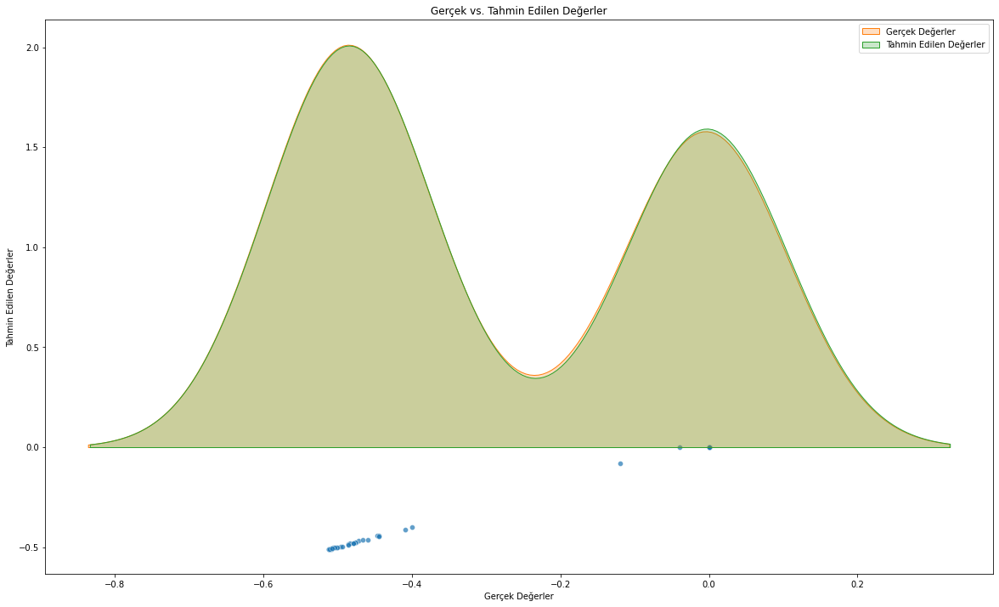

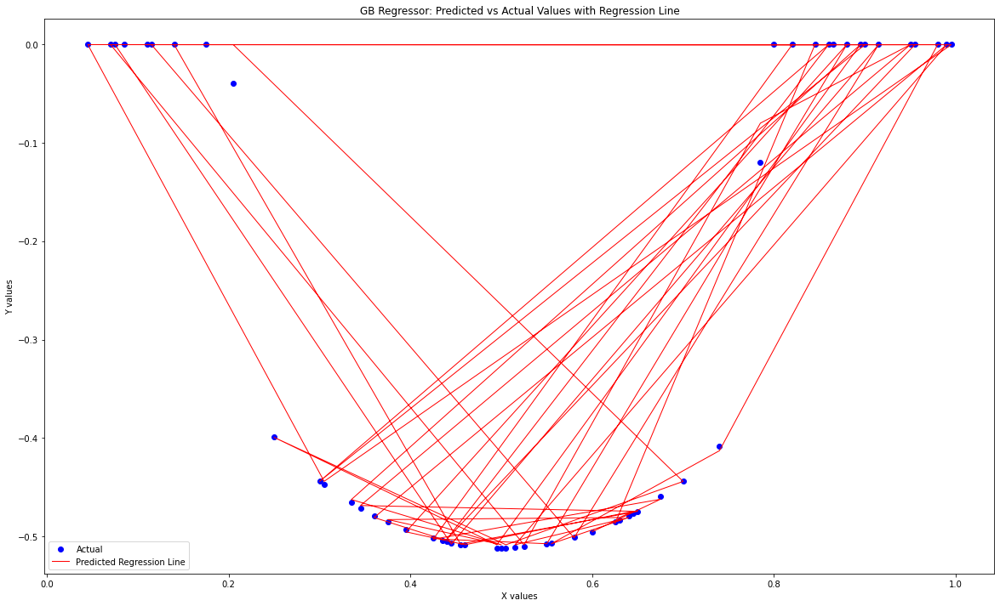

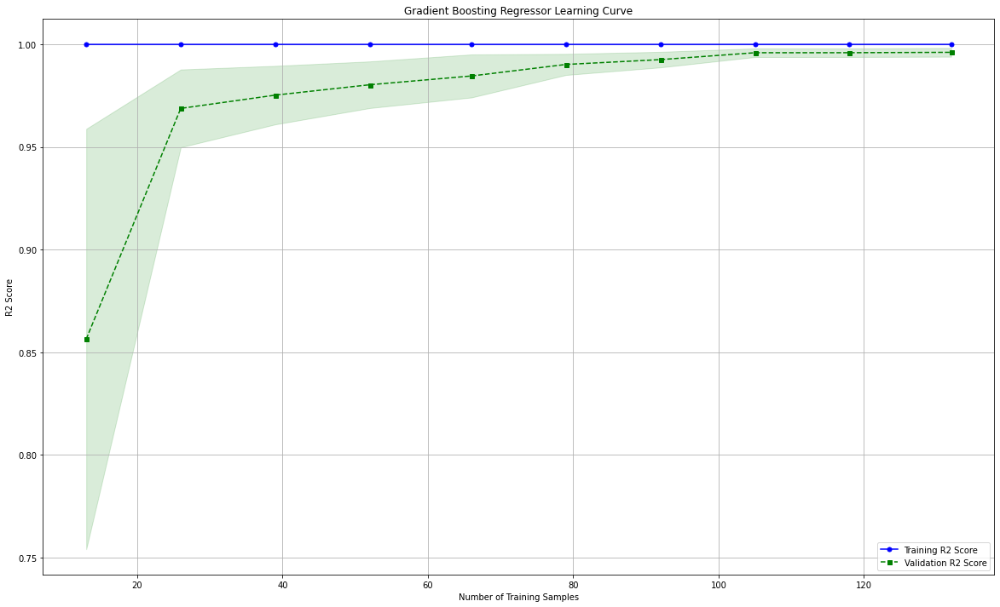

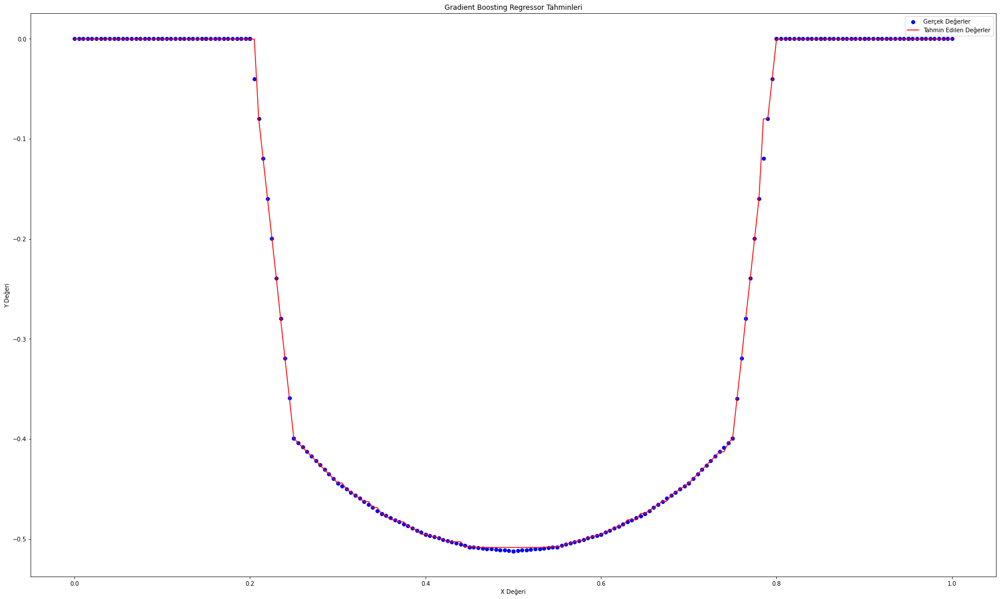

[-0.4]


In [202]:
gb_reg_N20 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_N20.fit(X_train_N20, y_train_N20)

y_pred_N20 = gb_reg_N20.predict(X_test_N20)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N20.reshape(len(y_pred_N20),1), y_test_N20.reshape(len(y_test_N20),1)),1))


print(r2_score(y_test_N20, y_pred_N20))

# Use test and show results of test set
y_hat_N20 = gb_reg_N20.predict(X_N20)
mae = metrics.mean_absolute_error(y_N20,y_hat_N20)
mse = metrics.mean_squared_error(y_N20,y_hat_N20)
mape = np.mean(np.abs((y_N20 - y_hat_N20) / y_N20)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_N20.score(X_N20,y_N20))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N20 = pd.DataFrame({'Gerçek Değerler': y_test_N20, 'Tahmin Edilen Değerler': y_pred_N20})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N20, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N20 = pd.DataFrame({'Predicted': y_pred_N20, 'Actual': y_test_N20})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N20, y_test_N20, color='blue', label='Actual')
plt.plot(X_test_N20, y_pred_N20, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_N20, X=X_train_N20, y=y_train_N20, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N20 = np.arange(0, 1.005, 0.005).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N20 = gb_reg_N20.predict(X_values_N20)

# Gerçek değerler için aynı işlemi yap
y_true_values_N20 = gb_reg_N20.predict(X_N20)

plt.figure(figsize=(30, 18))
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N20, y_pred_values_N20, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_N20.predict([[0.250]])) #0.250 == -3.992917e-01 gerçek değerde

### SupportVectorRegressor deneyelim


[[-5.45e-01 -4.96e-01]
 [-4.70e-01 -4.59e-01]
 [-5.52e-01 -5.02e-01]
 [-9.87e-02  0.00e+00]
 [ 5.18e-02  0.00e+00]
 [-5.56e-01 -5.10e-01]
 [-1.96e-01 -1.20e-01]
 [ 4.17e-02  0.00e+00]
 [-4.95e-01 -4.72e-01]
 [-5.06e-01 -4.75e-01]
 [-5.55e-01 -5.08e-01]
 [-2.98e-03  0.00e+00]
 [-8.44e-04  0.00e+00]
 [ 3.78e-02  0.00e+00]
 [-4.26e-01 -4.47e-01]
 [-1.29e-02  0.00e+00]
 [-1.53e-01  5.95e-09]
 [ 5.18e-02  0.00e+00]
 [ 4.16e-02  0.00e+00]
 [-4.15e-01 -4.44e-01]
 [-9.56e-03  0.00e+00]
 [-5.54e-01 -5.05e-01]
 [ 3.79e-02  0.00e+00]
 [ 3.25e-02  0.00e+00]
 [-5.51e-01 -5.01e-01]
 [ 4.91e-02  0.00e+00]
 [-5.55e-01 -5.07e-01]
 [ 5.25e-02  0.00e+00]
 [-1.58e-01 -3.99e-02]
 [-4.22e-01 -4.44e-01]
 [-5.56e-01 -5.12e-01]
 [-2.88e-01 -3.99e-01]
 [-5.56e-01 -5.12e-01]
 [ 3.76e-02  0.00e+00]
 [-4.81e-01 -4.66e-01]
 [-5.56e-01 -5.12e-01]
 [-5.28e-01 -4.85e-01]
 [-5.26e-01 -4.83e-01]
 [-5.11e-01 -4.77e-01]
 [-5.55e-01 -5.09e-01]
 [-5.41e-01 -4.93e-01]
 [ 2.14e-02  0.00e+00]
 [-5.55e-01 -5.08e-01]
 [-5.53e-01

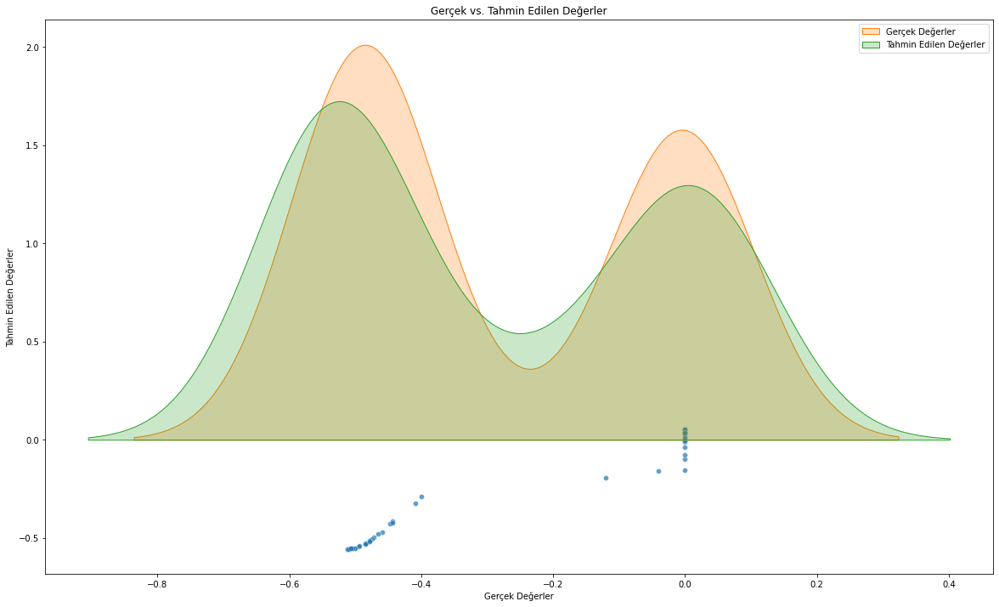

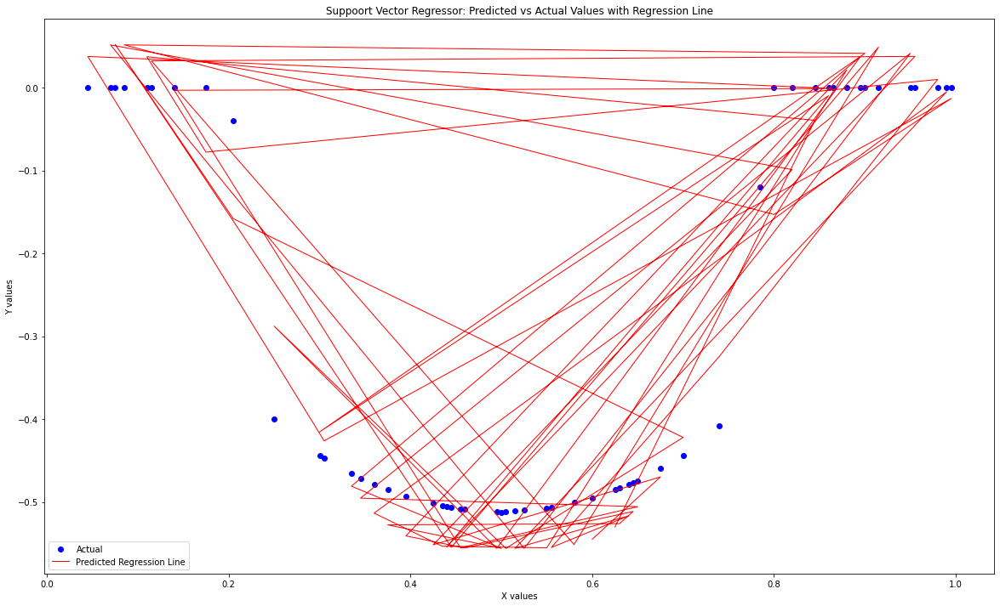

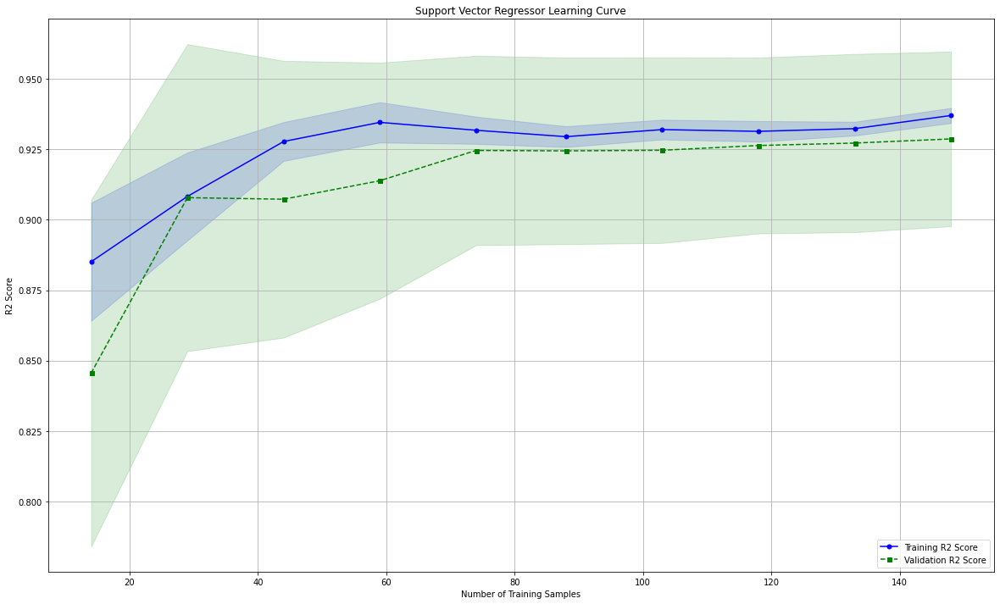

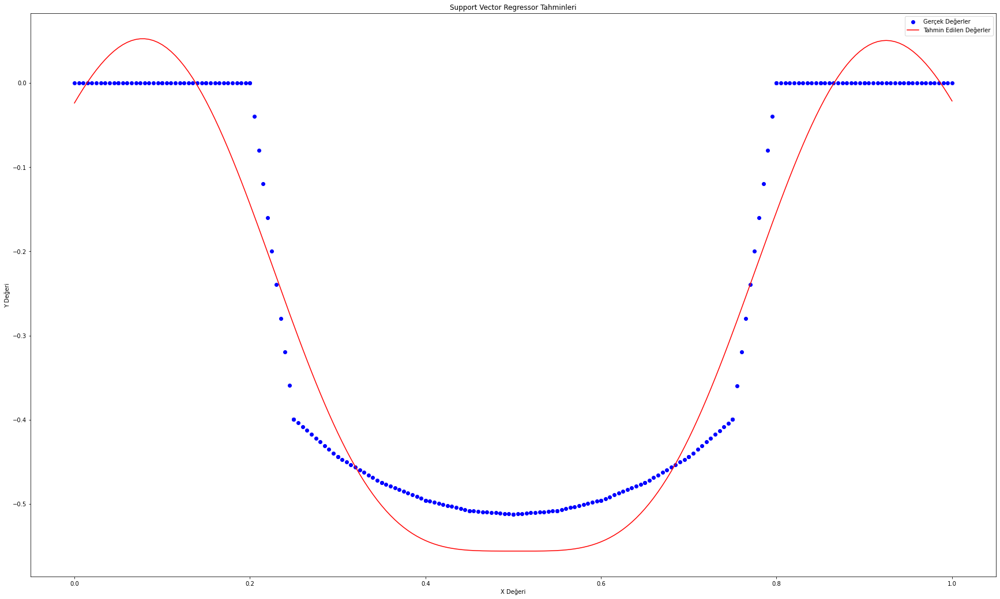

[-0.29]


In [203]:
svr_reg_N20 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_N20.fit(X_train_N20, y_train_N20)

y_pred_N20 = svr_reg_N20.predict(X_test_N20)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N20.reshape(len(y_pred_N20),1), y_test_N20.reshape(len(y_test_N20),1)),1))


print(r2_score(y_test_N20, y_pred_N20))


# Use test and show results of test set
y_hat_N20 = svr_reg_N20.predict(X_N20)
mae = metrics.mean_absolute_error(y_N20,y_hat_N20)
mse = metrics.mean_squared_error(y_N20,y_hat_N20)
mape = np.mean(np.abs((y_N20 - y_hat_N20) / y_N20)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_N20.score(X_N20,y_N20))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N20 = pd.DataFrame({'Gerçek Değerler': y_test_N20, 'Tahmin Edilen Değerler': y_pred_N20})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N20, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N20 = pd.DataFrame({'Predicted': y_pred_N20, 'Actual': y_test_N20})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N20, y_test_N20, color='blue', label='Actual')
plt.plot(X_test_N20, y_pred_N20, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_N20, X=X_train_N20, y=y_train_N20, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N20 = np.arange(0, 1.005, 0.005).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N20 = svr_reg_N20.predict(X_values_N20)

# Gerçek değerler için aynı işlemi yap
y_true_values_N20 = svr_reg_N20.predict(X_N20)

plt.figure(figsize=(30, 18))
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N20, y_pred_values_N20, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_N20.predict([[0.250]])) #0.250 == -3.992917e-01 gerçek değerde

### PolynomialRegressor ile deneyelim


R2 Score (Polynomial Regression):  0.9465065113029293
MAE (Polynomial Regression):  0.04299065394136774
RMSE (Polynomial Regression):  0.05510439361016397
MAPE (Polynomial Regression):  inf


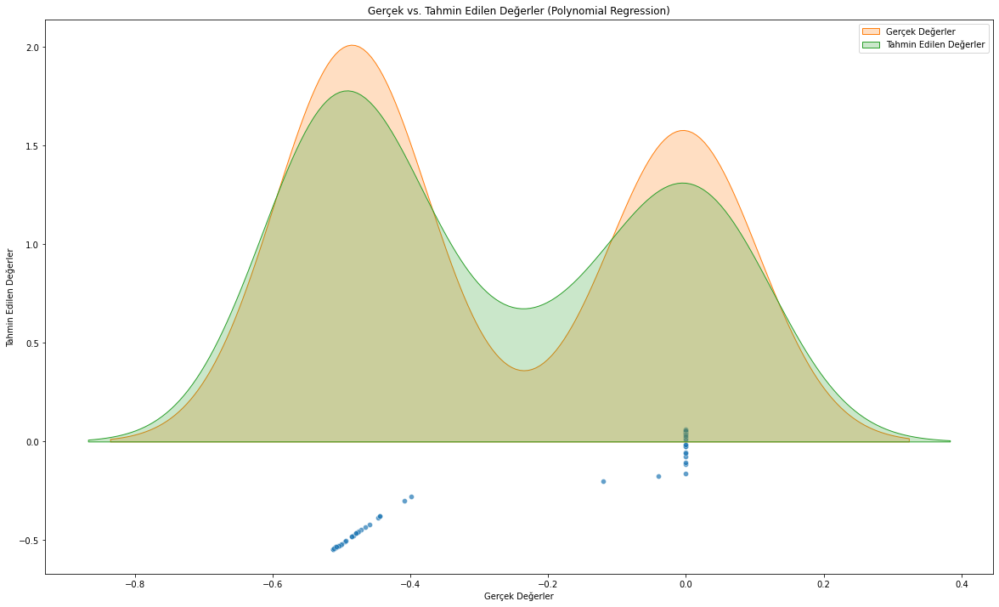

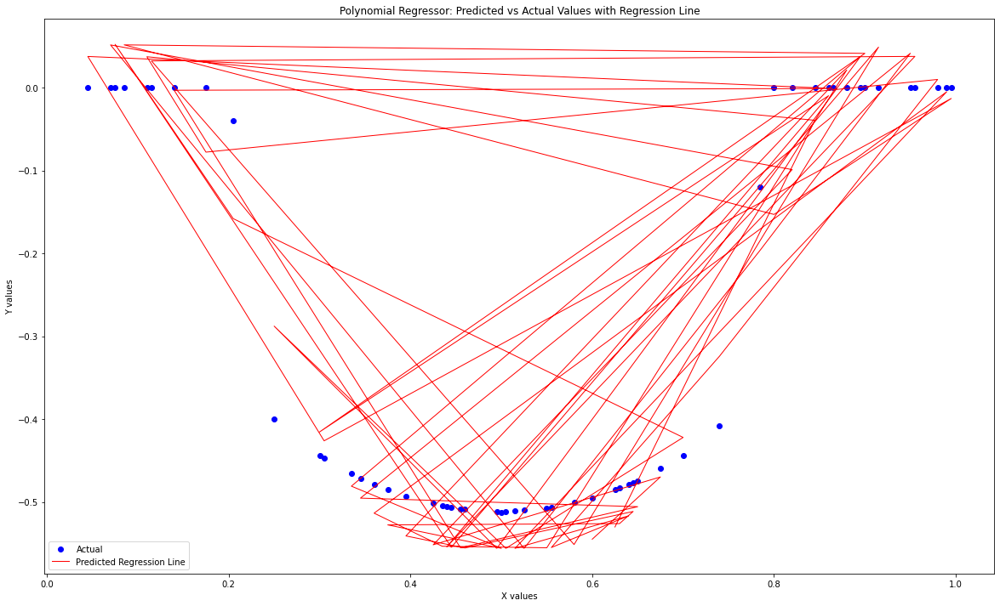

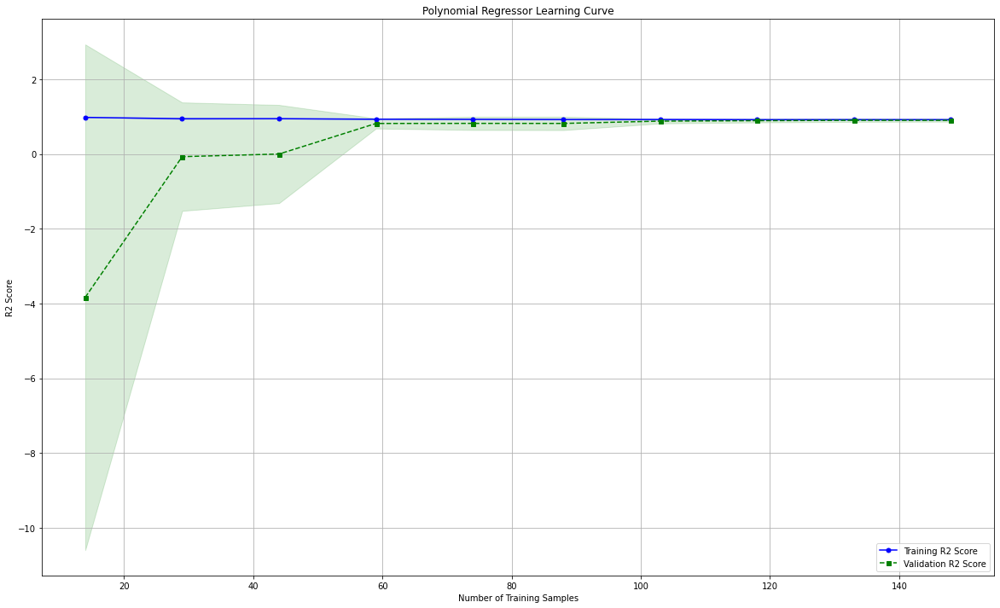

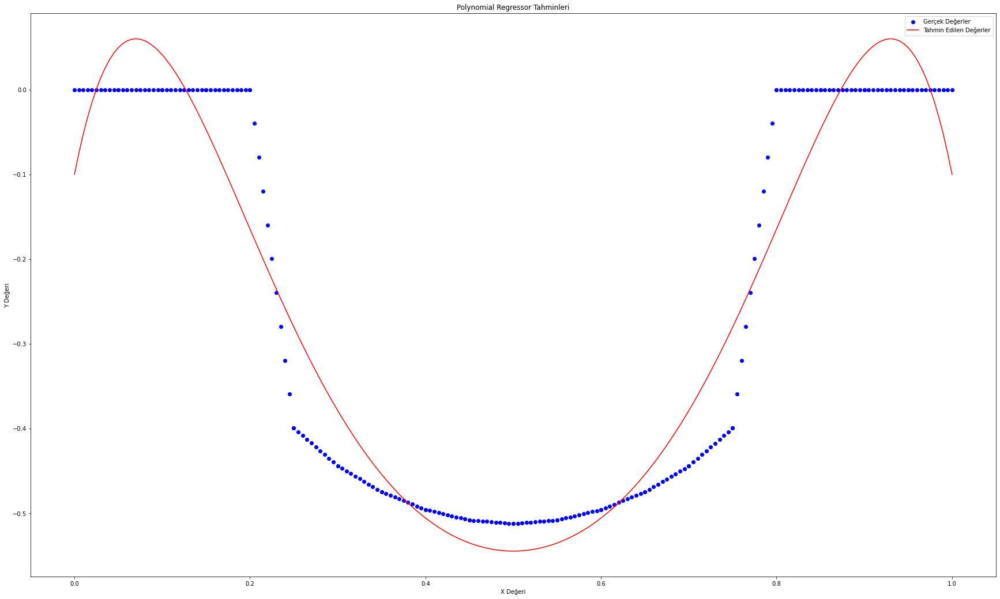

[-0.28]


In [204]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_N20 = PolynomialFeatures(degree=7)
X_poly_N20 = poly_N20.fit_transform(X_N20)

# Lineer Regresyon modeli oluşturma
poly_reg_N20 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_N20.fit(X_N20, y_N20)

# Tahminler yapma
y_pred_poly_N20 = poly_reg_N20.predict(X_test_N20)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_N20, y_pred_poly_N20))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_N20, y_pred_poly_N20))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_N20, y_pred_poly_N20)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_N20 - y_pred_poly_N20) / y_test_N20)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_N20 = pd.DataFrame({'Gerçek Değerler': y_test_N20, 'Tahmin Edilen Değerler': y_pred_poly_N20})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_N20, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N20['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N20['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_N20 = pd.DataFrame({'Predicted': y_pred_N20, 'Actual': y_test_N20})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N20, y_test_N20, color='blue', label='Actual')
plt.plot(X_test_N20, y_pred_N20, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_N20, X=X_train_N20, y=y_train_N20, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N20 = np.arange(0, 1.005, 0.005).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N20 = poly_reg_N20.predict(X_values_N20)

# Gerçek değerler için aynı işlemi yap
y_true_values_N20 = poly_reg_N20.predict(X_N20)

plt.figure(figsize=(30, 18))
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N20, y_pred_values_N20, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_N20.predict([[0.250]])) #0.250 == -3.992917e-01 gerçek değerde

### Multi-Layer Perceptron

In [205]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_N20, y_train_N20,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test_N20)

Epoch 1/100
4/4 [==============================] - 1s 40ms/step - loss: 0.1110 - mae: 0.2449 - val_loss: 0.1211 - val_mae: 0.2699
Epoch 2/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1089 - mae: 0.2444 - val_loss: 0.1188 - val_mae: 0.2687
Epoch 3/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1068 - mae: 0.2437 - val_loss: 0.1165 - val_mae: 0.2674
Epoch 4/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1047 - mae: 0.2431 - val_loss: 0.1141 - val_mae: 0.2661
Epoch 5/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1026 - mae: 0.2425 - val_loss: 0.1118 - val_mae: 0.2648
Epoch 6/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1006 - mae: 0.2420 - val_loss: 0.1094 - val_mae: 0.2634
Epoch 7/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0985 - mae: 0.2415 - val_loss: 0.1071 - val_mae: 0.2620
Epoch 8/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0962 - mae: 0.24

4/4 [==============================] - 0s 9ms/step - loss: 0.0509 - mae: 0.2195 - val_loss: 0.0519 - val_mae: 0.2181
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0509 - mae: 0.2196 - val_loss: 0.0519 - val_mae: 0.2182
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0510 - mae: 0.2198 - val_loss: 0.0520 - val_mae: 0.2185
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0510 - mae: 0.2197 - val_loss: 0.0520 - val_mae: 0.2183
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0509 - mae: 0.2197 - val_loss: 0.0520 - val_mae: 0.2184
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0509 - mae: 0.2196 - val_loss: 0.0520 - val_mae: 0.2183
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0509 - mae: 0.2195 - val_loss: 0.0520 - val_mae: 0.2183
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0509 - mae: 0.2195 - val_

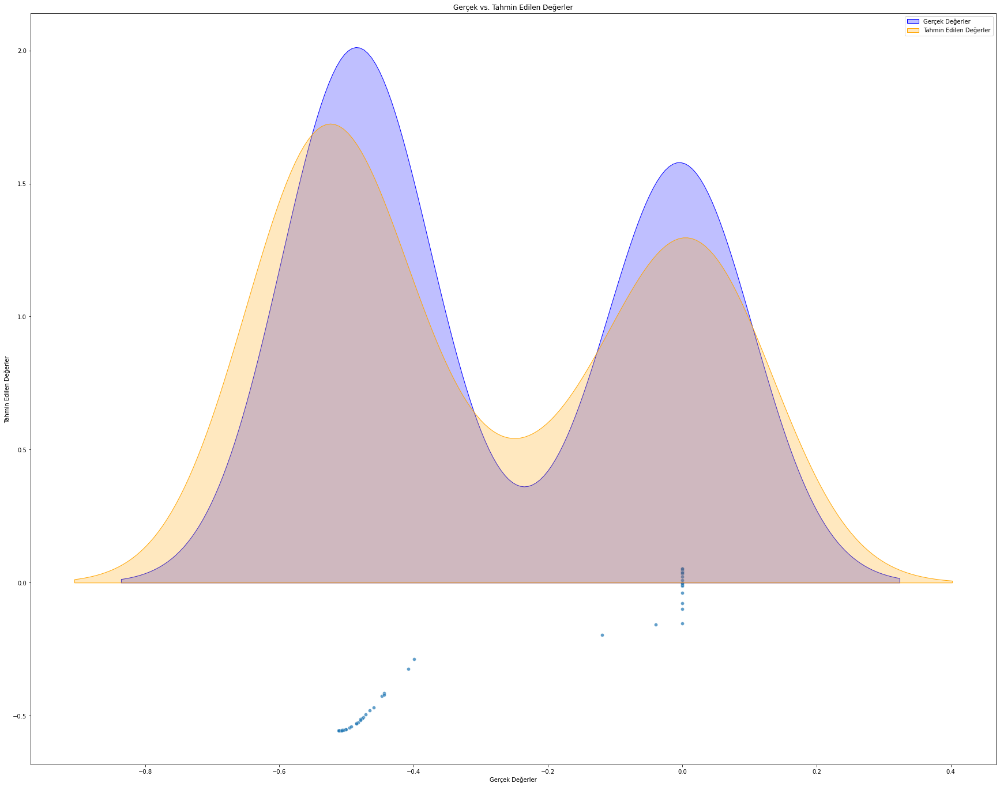

In [206]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_N20 = pd.DataFrame({'Gerçek Değerler': y_test_N20.flatten(), 'Tahmin Edilen Değerler': y_pred_N20.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N20, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N20['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
5/5 [==============================] - 0s 16ms/step - loss: 0.0499 - mae: 0.2156 - val_loss: 0.0630 - val_mae: 0.2499
Epoch 2/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0499 - mae: 0.2156 - val_loss: 0.0630 - val_mae: 0.2500
Epoch 3/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0499 - mae: 0.2156 - val_loss: 0.0630 - val_mae: 0.2500
Epoch 4/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0499 - mae: 0.2156 - val_loss: 0.0630 - val_mae: 0.2499
Epoch 5/50
5/5 [==============================] - 0s 8ms/step - loss: 0.0499 - mae: 0.2156 - val_loss: 0.0633 - val_mae: 0.2506
Epoch 6/50
5/5 [==============================] - 0s 9ms/step - loss: 0.0499 - mae: 0.2157 - val_loss: 0.0635 - val_mae: 0.2510
Epoch 7/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0498 - mae: 0.2157 - val_loss: 0.0635 - val_mae: 0.2511
Epoch 8/50
5/5 [==============================] - 0s 7ms/step - loss: 0.0498 - mae: 0.2157 - val_loss: 

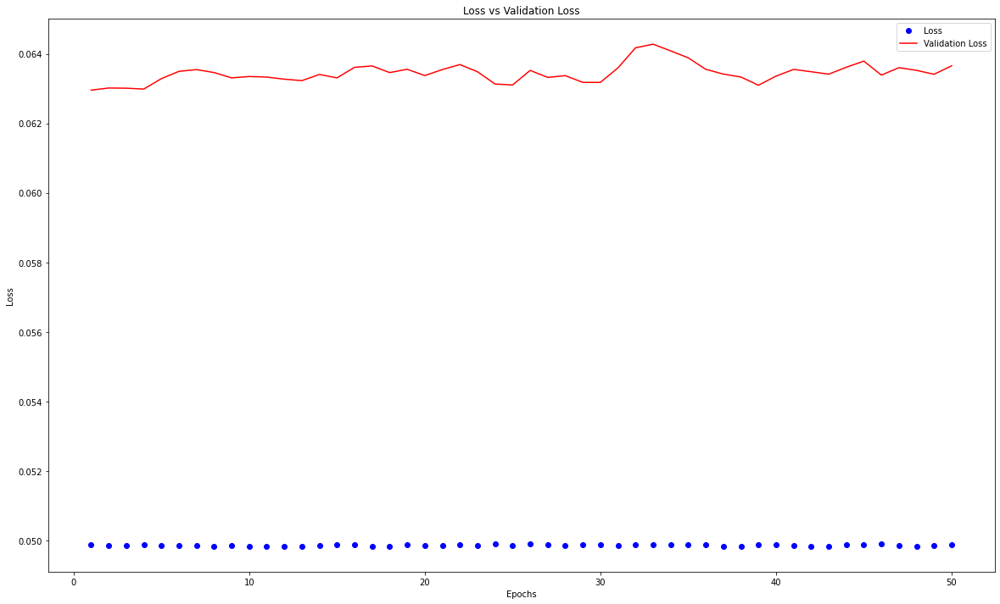

In [207]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_N20, y_train_N20, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması


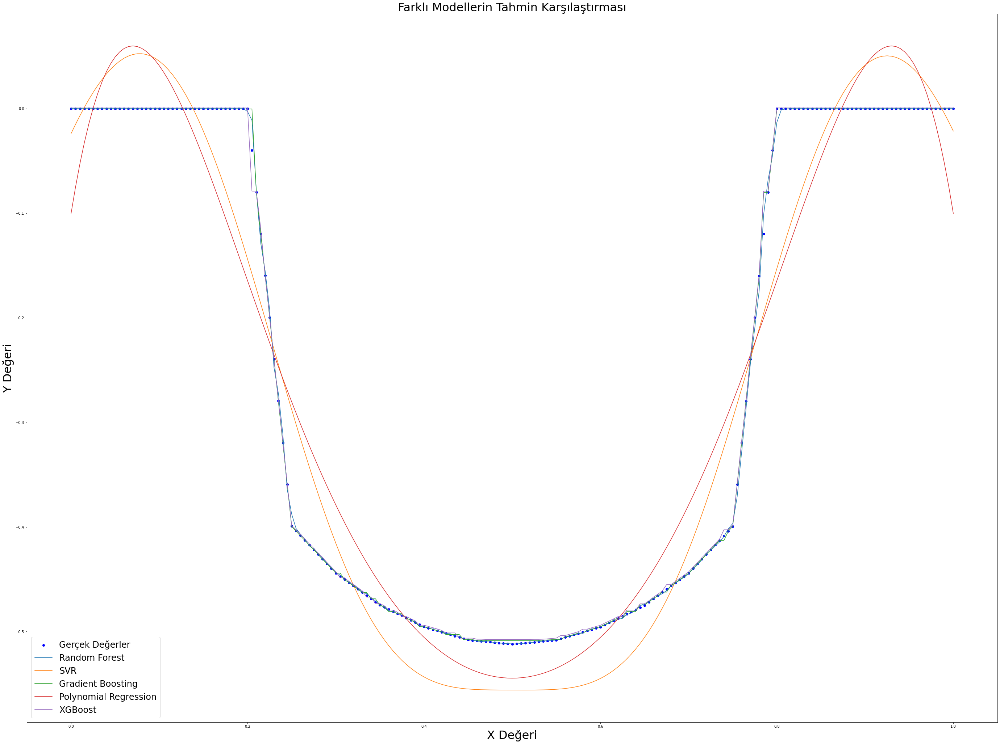

In [208]:
y_pred_rf_N20 = rf_reg_N20.predict(X_values_N20)
y_pred_svr_N20 = svr_reg_N20.predict(X_values_N20)  
y_pred_gb_N20 = gb_reg_N20.predict(X_values_N20)
y_pred_poly_N20 = poly_reg_N20.predict(X_values_N20)
y_pred_xgb_N20 = xgb_N20.predict(X_values_N20)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_N20, y_N20, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_N20, y_pred_rf_N20, label='Random Forest')
plt.plot(X_values_N20, y_pred_svr_N20, label='SVR')
plt.plot(X_values_N20, y_pred_gb_N20, label='Gradient Boosting')
plt.plot(X_values_N20, y_pred_poly_N20, label='Polynomial Regression')
plt.plot(X_values_N20, y_pred_xgb_N20, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

### N22 Verileri için Modeller

In [209]:
data_N22 = pd.read_excel('N verileri.xlsx')
data_N22 = data_N22.iloc[:, 10:12] #  11. ve 12. kolonları seçelim
data_N22

,N22_FI_X1_iz10_imort,N22_X1_fi
0,0.000000,0.000000e+00
1,0.416667,0.000000e+00
2,0.833333,0.000000e+00
3,1.250000,0.000000e+00
4,1.666667,0.000000e+00
5,2.083333,0.000000e+00
6,2.500000,0.000000e+00
7,2.916667,0.000000e+00
8,3.333333,0.000000e+00
9,3.750000,0.000000e+00


In [210]:
#data_N22 = data_N22.loc[:219,:] 
data_N22['N22_FI_X1_iz10_imort'] = data_N22['N22_FI_X1_iz10_imort'] / 100 # koordinat değerlerini / 10 yapmam gerekli
data_N22

,N22_FI_X1_iz10_imort,N22_X1_fi
0,0.000000,0.000000e+00
1,0.004167,0.000000e+00
2,0.008333,0.000000e+00
3,0.012500,0.000000e+00
4,0.016667,0.000000e+00
5,0.020833,0.000000e+00
6,0.025000,0.000000e+00
7,0.029167,0.000000e+00
8,0.033333,0.000000e+00
9,0.037500,0.000000e+00


In [211]:
data_N22.columns[data_N22.isnull().any()]

Index([], dtype='object')

In [212]:
data_N22.isna().any()

N22_FI_X1_iz10_imort    False
N22_X1_fi               False
dtype: bool

In [213]:
data_N22.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242 entries, 0 to 241
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   N22_FI_X1_iz10_imort  242 non-null    float64
 1   N22_X1_fi             242 non-null    float64
dtypes: float64(2)
memory usage: 3.9 KB


In [214]:
data_N22.describe().T

,count,mean,std,min,25%,50%,75%,max
N22_FI_X1_iz10_imort,242.0,0.500000,0.299031,0.000000,0.230208,0.500000,0.769792,1.000000e+00
N22_X1_fi,242.0,-0.234436,0.231787,-0.512149,-0.478927,-0.200165,0.000000,5.966027e-09


### veri kontrol edildi, problem yok


In [215]:
X_N22 = data_N22.iloc[:, :1].values
y_N22 = data_N22.iloc[:,1].values

In [216]:
X_N22.shape, y_N22.shape

((242, 1), (242,))

In [217]:
X_train_N22, X_test_N22, y_train_N22, y_test_N22 = train_test_split(X_N22, y_N22, test_size=0.25, random_state=42)

### RandomForestRegressor

[[ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-4.78e-01 -4.77e-01]
 [ 1.49e-10  0.00e+00]
 [ 1.49e-10  0.00e+00]
 [ 1.49e-10  0.00e+00]
 [ 1.49e-10  0.00e+00]
 [-4.82e-01 -4.81e-01]
 [ 0.00e+00  0.00e+00]
 [-5.10e-01 -5.09e-01]
 [ 0.00e+00  0.00e+00]
 [ 1.49e-10  0.00e+00]
 [ 1.49e-10  0.00e+00]
 [-4.23e-01 -4.22e-01]
 [-4.57e-01 -4.59e-01]
 [-4.56e-01 -4.53e-01]
 [ 1.49e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-3.84e-01 -4.00e-01]
 [-5.10e-01 -5.10e-01]
 [ 0.00e+00  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-5.06e-01 -5.07e-01]
 [ 0.00e+00  0.00e+00]
 [-5.56e-02 -8.01e-02]
 [-4.44e-01 -4.44e-01]
 [ 0.00e+00  0.00e+00]
 [-4.28e-01 -4.31e-01]
 [-4.84e-01 -4.85e-01]
 [-4.73e-01 -4.72e-01]
 [-5.08e-01 -5.08e-01]
 [ 1.49e-10  0.00e+00]
 [ 0.00e+00  0.00e+00]
 [-2.14e-01 -2.00e-01]
 [ 0.00e+00  0.00e+00]
 [-5.11e-01 -5.10e-01]
 [-4.90e-01 -4.91e-01]
 [ 1.49e-10  0.00e+00]
 [-5.02e-01 -5.02e-01]
 [ 1.49e-10  0.00e+00]
 [-4.38e-01 -4.40e-01]
 [-5.11e-01 -5.11e-01]
 [-5.09e-01 -5.09e-01]
 [ 0.00e+00

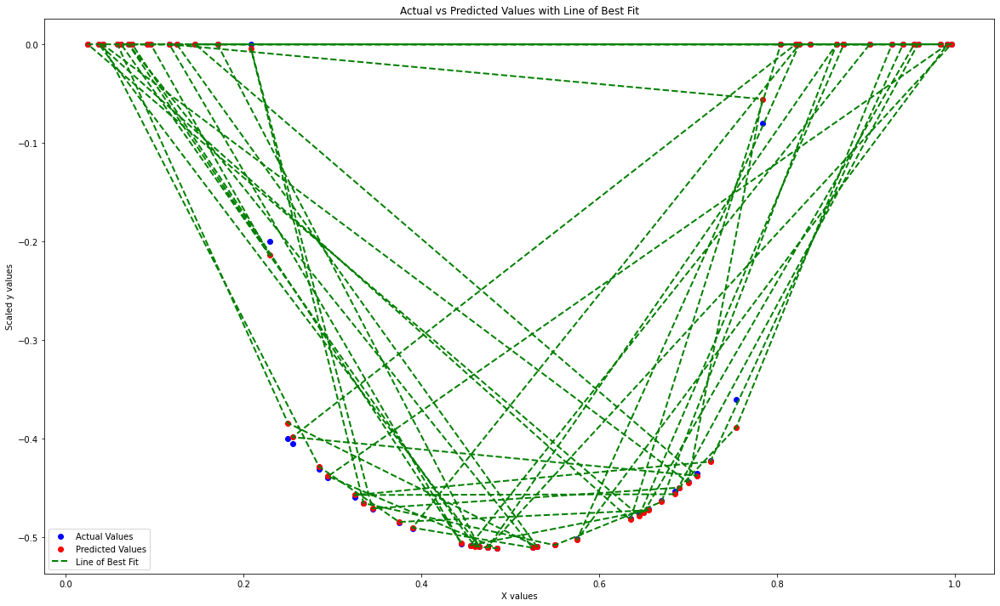

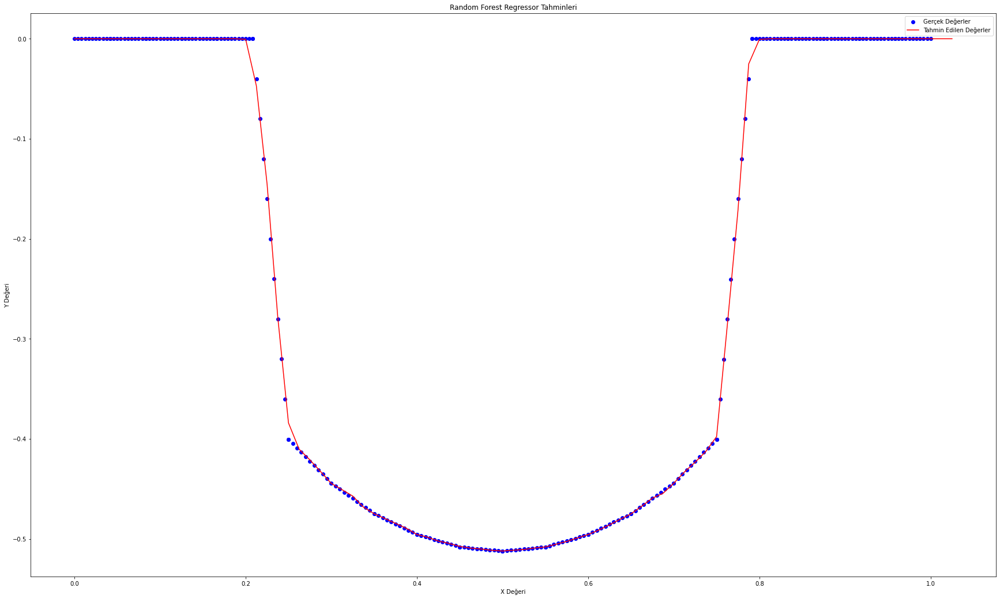

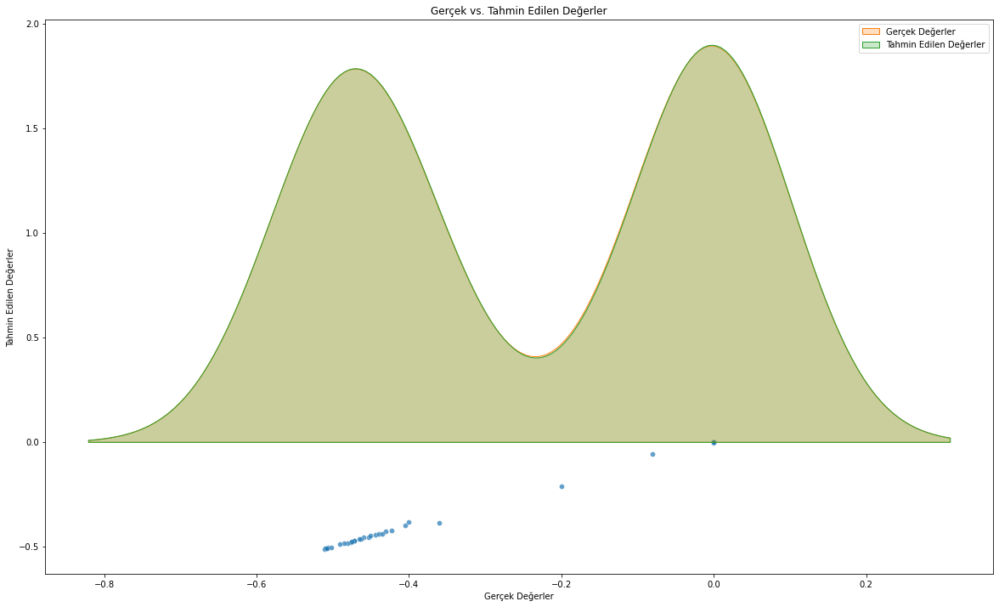

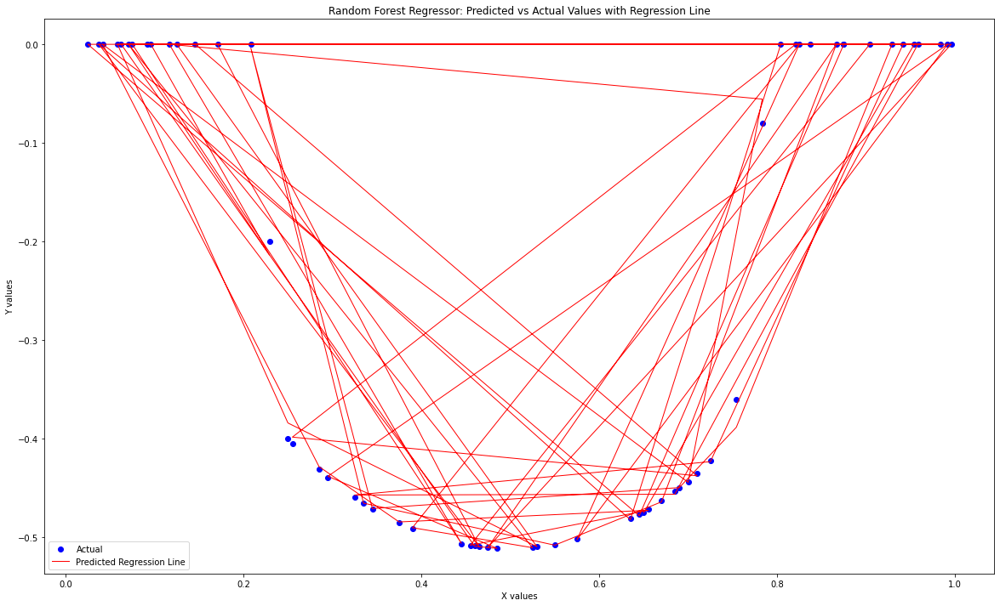

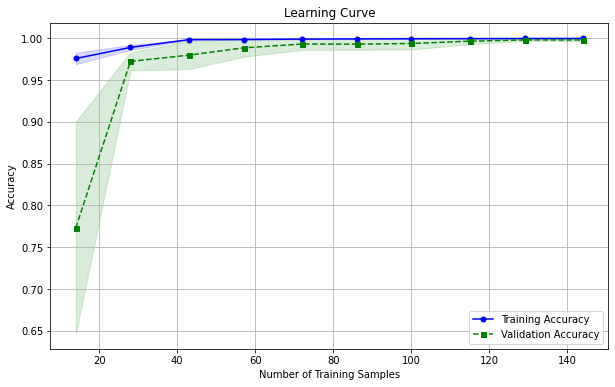

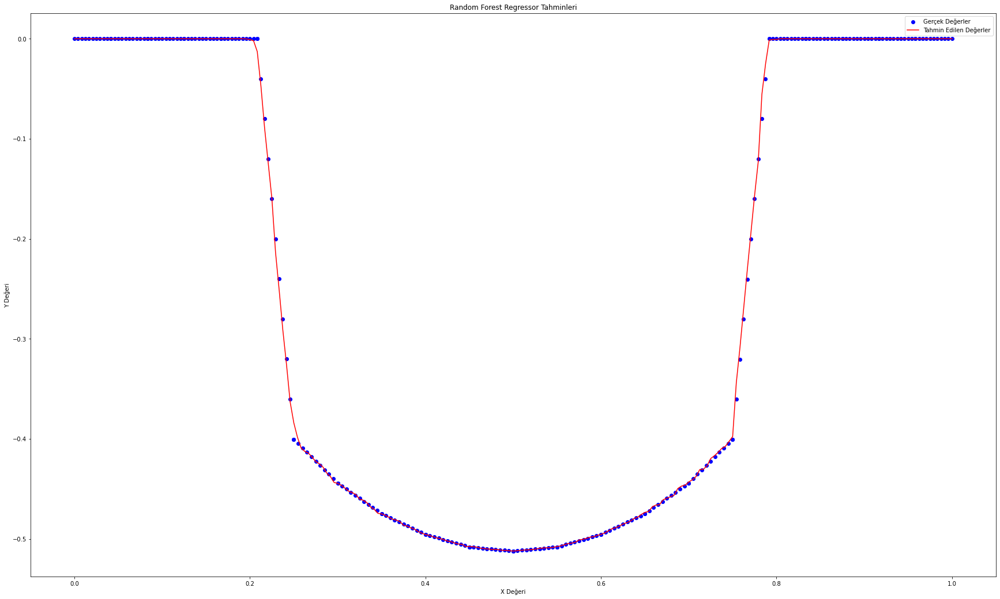

[-0.38]


In [218]:
rf_reg_N22 = RandomForestRegressor(n_estimators = 250 , criterion='squared_error',random_state = 42) 
rf_reg_N22.fit(X_train_N22, y_train_N22)

y_pred_N22 = rf_reg_N22.predict(X_test_N22)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N22.reshape(len(y_pred_N22),1), y_test_N22.reshape(len(y_test_N22),1)),1))

print(r2_score(y_test_N22, y_pred_N22))

# Use test and show results of test set
y_hat_N22 = rf_reg_N22.predict(X_N22)
mae = metrics.mean_absolute_error(y_N22,y_hat_N22)
mse = metrics.mean_squared_error(y_N22,y_hat_N22)
mape = np.mean(np.abs((y_N22 - y_hat_N22) / y_N22)) * 100
print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", rf_reg_N22.score(X_N22,y_N22))

plt.figure(figsize=(20, 12))

# Scatter plot for predicted vs actual values
plt.scatter(X_test_N22, y_test_N22, color='blue', label='Actual Values')
plt.scatter(X_test_N22, y_pred_N22, color='red', label='Predicted Values')

# Line plot to connect predicted and actual values
plt.plot(X_test_N22, y_pred_N22, color='green', linestyle='dashed', linewidth=2, label='Line of Best Fit')

# Adding labels and title
plt.xlabel('X values')
plt.ylabel('Scaled y values')
plt.title('Actual vs Predicted Values with Line of Best Fit')

# Adding legend
plt.legend()

# Show the plot
plt.show()



# Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N22 = np.arange(0, 1.03125, 0.0125).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N22 = rf_reg_N22.predict(X_values_N22)

# Gerçek değerler için aynı işlemi yap
y_true_values_N22 = rf_reg_N22.predict(X_N22)

plt.figure(figsize=(30, 18))
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N22, y_pred_values_N22, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N22 = pd.DataFrame({'Gerçek Değerler': y_test_N22, 'Tahmin Edilen Değerler': y_pred_N22})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N22, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N22 = pd.DataFrame({'Predicted': y_pred_N22, 'Actual': y_test_N22})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N22, y_test_N22, color='blue', label='Actual')
plt.plot(X_test_N22, y_pred_N22, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Random Forest Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_reg_N22, X=X_train_N22, y=y_train_N22, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()

### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N22 = np.arange(0, 1.004167, 0.004167).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N22 = rf_reg_N22.predict(X_values_N22)

# Gerçek değerler için aynı işlemi yap
y_true_values_N22 = rf_reg_N22.predict(X_N22)

plt.figure(figsize=(30, 18))
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N22, y_pred_values_N22, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Random Forest Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(rf_reg_N22.predict([[0.250]])) #0.250 == -4.002853e-01 gerçek değerde

### XGBRegressor ile deneyelim


[[ 0.    0.  ]
 [ 0.    0.  ]
 [-0.47 -0.48]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.48 -0.48]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.42 -0.42]
 [-0.46 -0.46]
 [-0.46 -0.45]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.4  -0.4 ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.04 -0.08]
 [-0.44 -0.44]
 [ 0.    0.  ]
 [-0.43 -0.43]
 [-0.49 -0.49]
 [-0.47 -0.47]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.24 -0.2 ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [-0.49 -0.49]
 [ 0.    0.  ]
 [-0.5  -0.5 ]
 [ 0.    0.  ]
 [-0.43 -0.44]
 [-0.51 -0.51]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.41 -0.4 ]
 [-0.43 -0.44]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.51 -0.51]
 [ 0.    0.  ]
 [-0.46 -0.46]
 [-0.51 -0.51]
 [-0.47 -0.47]
 [ 0.    0.  ]
 [-0.47 -0.47]
 [-0.45 -0.45]
 [-0.32 -0.36]
 [ 0.    0.  ]
 [ 0.    0.  ]
 [-0.47 -0.47]]
0.9984559761294008
TEST SET
MAE:                 0.0017166458844581132
RMSE:        

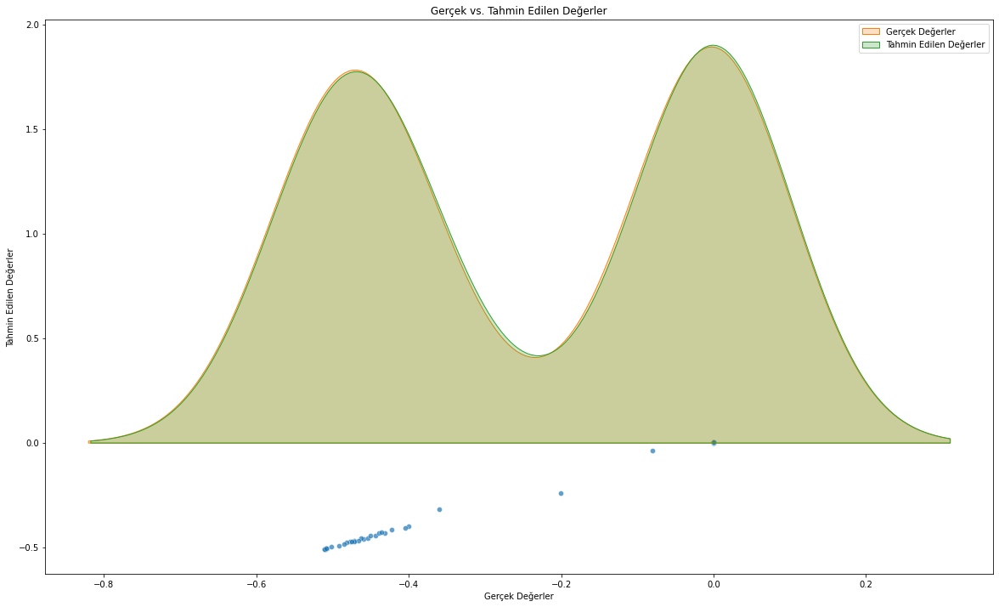

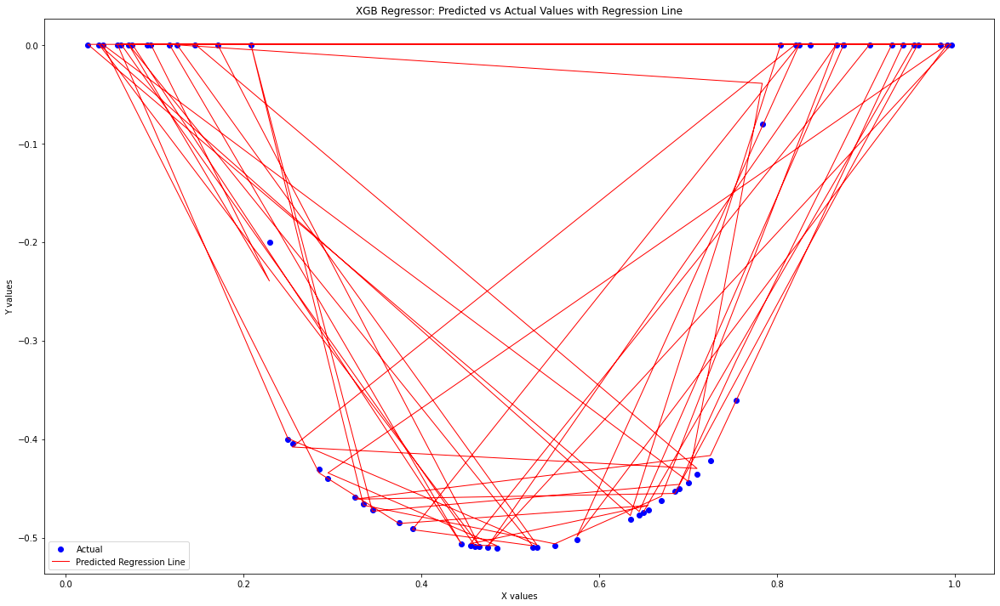

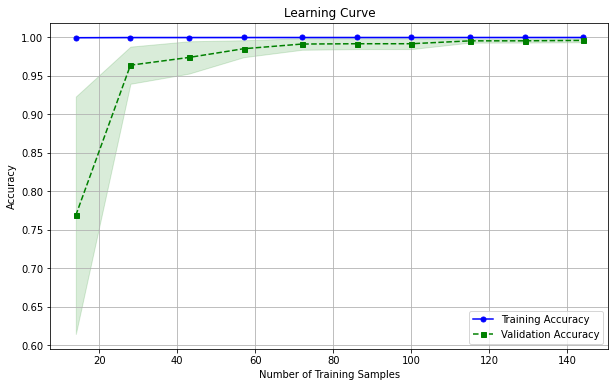

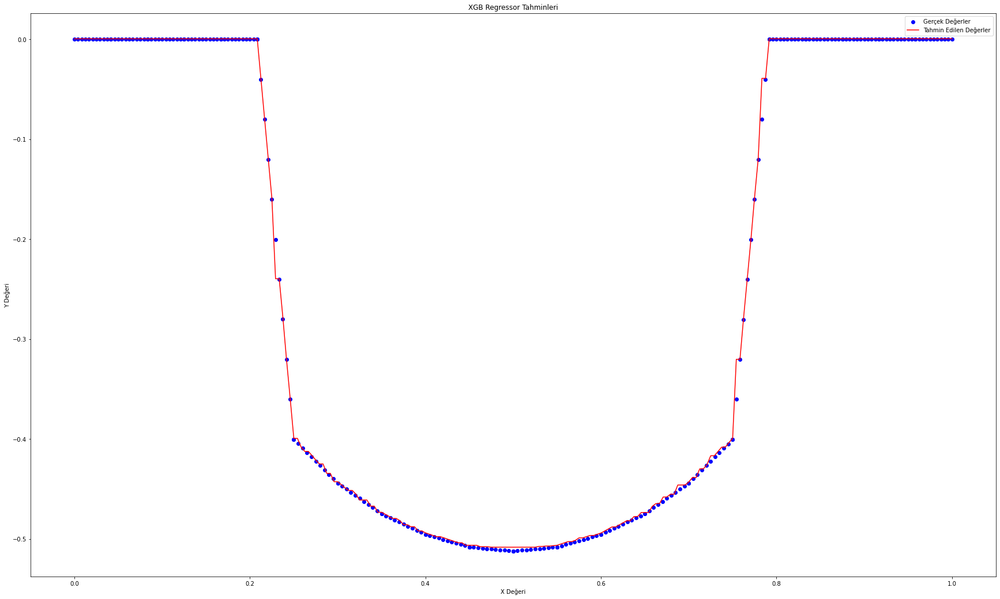

[-0.4]


In [219]:
from xgboost import XGBRegressor


xgb_N22 = XGBRegressor(n_estimators=220,
                    learning_rate = 0.03,
                    max_depth = 7,
                    random_state=42,
                    n_jobs = -1,
                    reg_lambda=0.995,
                    )

xgb_N22.fit(X_train_N22, y_train_N22)

y_pred_N22 = xgb_N22.predict(X_test_N22)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N22.reshape(len(y_pred_N22),1), y_test_N22.reshape(len(y_test_N22),1)),1))


print(r2_score(y_test_N22, y_pred_N22))

# Use test and show results of test set
y_hat_N22 = xgb_N22.predict(X_N22)
mae = metrics.mean_absolute_error(y_N22,y_hat_N22)
mse = metrics.mean_squared_error(y_N22,y_hat_N22)
mape = np.mean(np.abs((y_N22 - y_hat_N22) / y_N22)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", xgb_N22.score(X_N22,y_N22))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N22 = pd.DataFrame({'Gerçek Değerler': y_test_N22, 'Tahmin Edilen Değerler': y_pred_N22})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N22, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N22 = pd.DataFrame({'Predicted': y_pred_N22, 'Actual': y_test_N22})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N22, y_test_N22, color='blue', label='Actual')
plt.plot(X_test_N22, y_pred_N22, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('XGB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=xgb_N22, X=X_train_N22, y=y_train_N22, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Learning Curve')
plt.grid()
plt.show()


### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N22 = np.arange(0, 1.004167, 0.004167).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N22 = xgb_N22.predict(X_values_N22)

# Gerçek değerler için aynı işlemi yap
y_true_values_N22 = xgb_N22.predict(X_N22)

plt.figure(figsize=(30, 18))
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N22, y_pred_values_N22, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('XGB Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(xgb_N22.predict([[0.250]])) #0.250 == -4.002853e-01 gerçek değerde

### GradientBoostingRegressor deneyelim


[[-3.23e-04  0.00e+00]
 [-3.23e-04  0.00e+00]
 [-4.79e-01 -4.77e-01]
 [-3.38e-04  0.00e+00]
 [-3.38e-04  0.00e+00]
 [-3.38e-04  0.00e+00]
 [-3.38e-04  0.00e+00]
 [-4.83e-01 -4.81e-01]
 [-3.23e-04  0.00e+00]
 [-5.09e-01 -5.09e-01]
 [-3.23e-04  0.00e+00]
 [-3.38e-04  0.00e+00]
 [-3.38e-04  0.00e+00]
 [-4.27e-01 -4.22e-01]
 [-4.56e-01 -4.59e-01]
 [-4.56e-01 -4.53e-01]
 [-3.38e-04  0.00e+00]
 [-3.23e-04  0.00e+00]
 [-4.00e-01 -4.00e-01]
 [-5.08e-01 -5.10e-01]
 [-3.23e-04  0.00e+00]
 [-3.23e-04  0.00e+00]
 [-5.05e-01 -5.07e-01]
 [-3.23e-04  0.00e+00]
 [-4.01e-02 -8.01e-02]
 [-4.44e-01 -4.44e-01]
 [-3.23e-04  0.00e+00]
 [-4.27e-01 -4.31e-01]
 [-4.83e-01 -4.85e-01]
 [-4.75e-01 -4.72e-01]
 [-5.08e-01 -5.08e-01]
 [-3.38e-04  0.00e+00]
 [-3.23e-04  0.00e+00]
 [-2.41e-01 -2.00e-01]
 [-3.23e-04  0.00e+00]
 [-5.09e-01 -5.10e-01]
 [-4.89e-01 -4.91e-01]
 [-3.38e-04  0.00e+00]
 [-5.03e-01 -5.02e-01]
 [-3.38e-04  0.00e+00]
 [-4.35e-01 -4.40e-01]
 [-5.09e-01 -5.11e-01]
 [-5.09e-01 -5.09e-01]
 [-3.23e-04

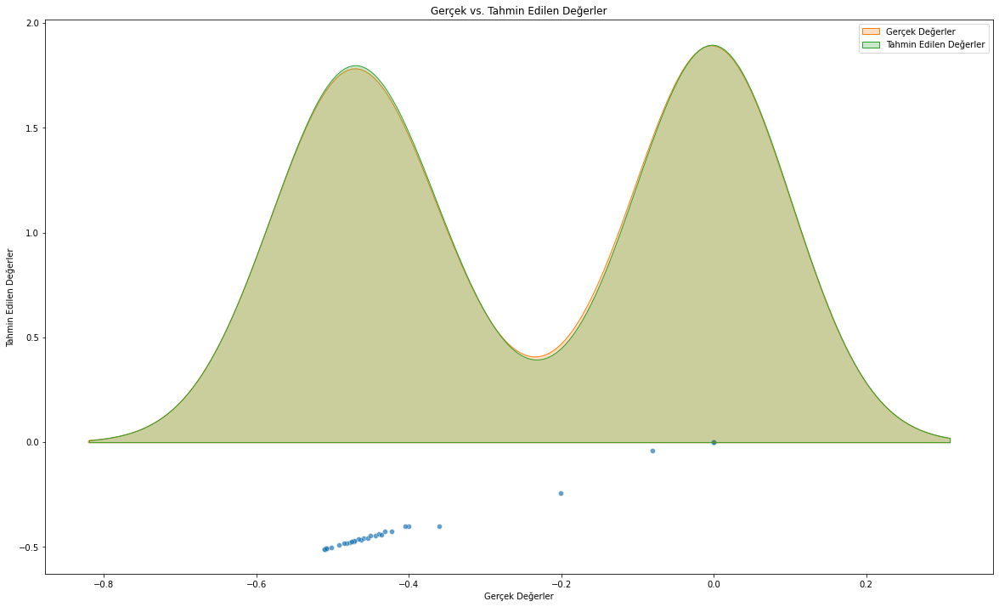

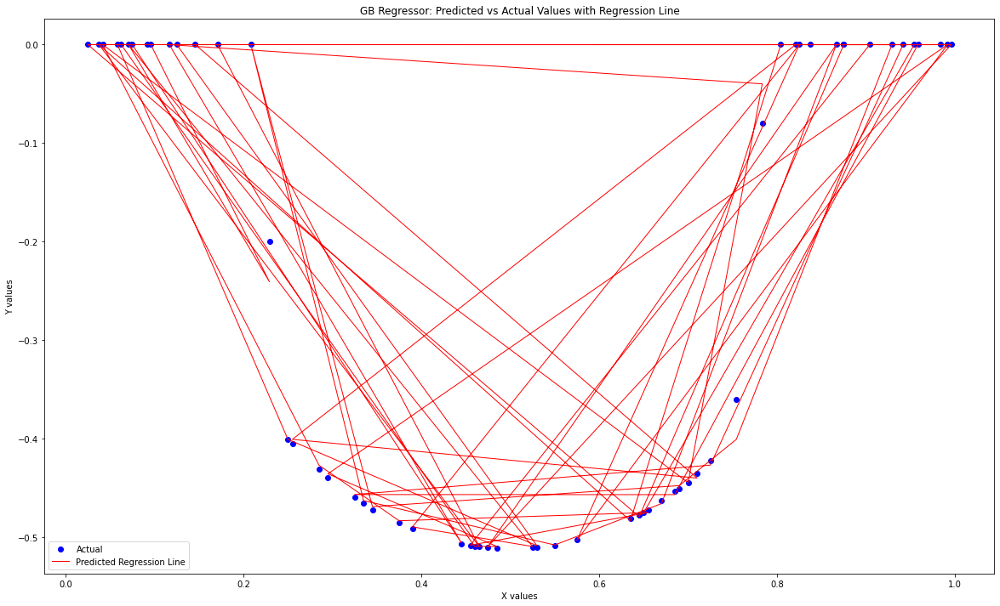

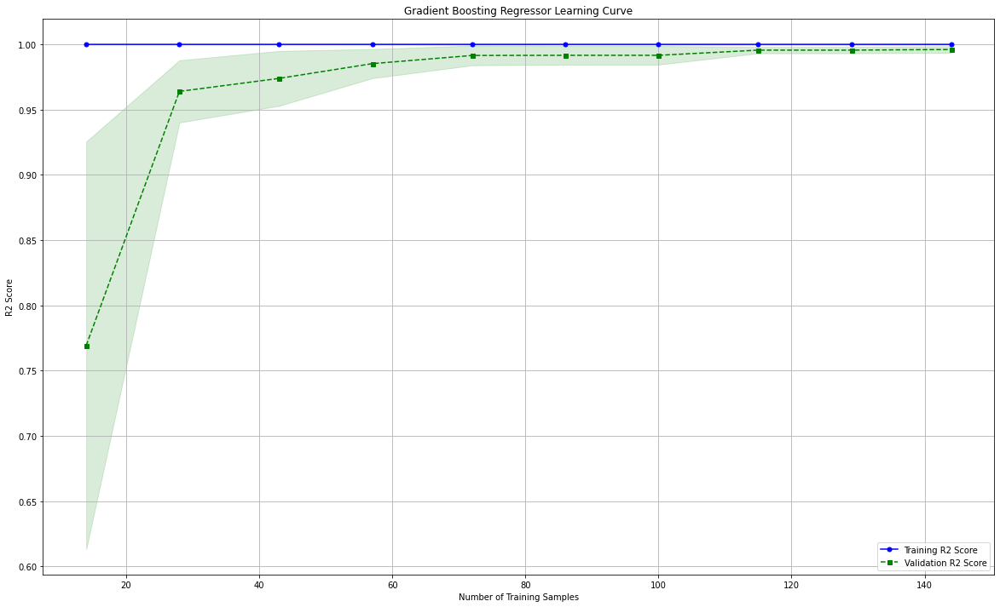

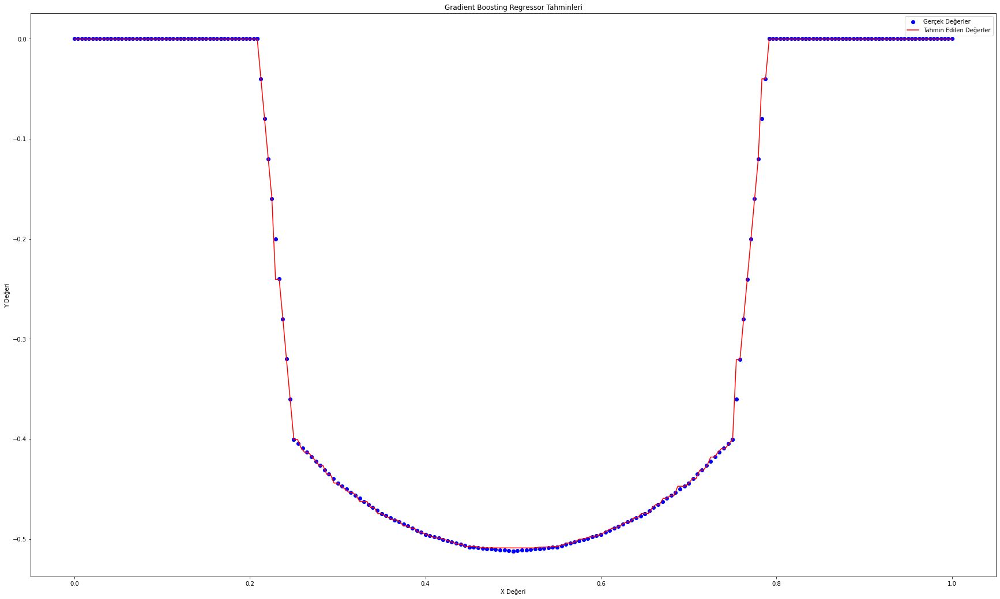

[-0.4]


In [221]:
gb_reg_N22 = GradientBoostingRegressor(random_state=42,n_estimators=220,criterion='squared_error', learning_rate = 0.03)

gb_reg_N22.fit(X_train_N22, y_train_N22)

y_pred_N22 = gb_reg_N22.predict(X_test_N22)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N22.reshape(len(y_pred_N22),1), y_test_N22.reshape(len(y_test_N22),1)),1))


print(r2_score(y_test_N22, y_pred_N22))

# Use test and show results of test set
y_hat_N22 = gb_reg_N22.predict(X_N22)
mae = metrics.mean_absolute_error(y_N22,y_hat_N22)
mse = metrics.mean_squared_error(y_N22,y_hat_N22)
mape = np.mean(np.abs((y_N22 - y_hat_N22) / y_N22)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", gb_reg_N22.score(X_N22,y_N22))


# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N22 = pd.DataFrame({'Gerçek Değerler': y_test_N22, 'Tahmin Edilen Değerler': y_pred_N22})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N22, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N22 = pd.DataFrame({'Predicted': y_pred_N22, 'Actual': y_test_N22})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N22, y_test_N22, color='blue', label='Actual')
plt.plot(X_test_N22, y_pred_N22, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('GB Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=gb_reg_N22, X=X_train_N22, y=y_train_N22, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Gradient Boosting Regressor Learning Curve')
plt.grid()
plt.show()


# Gradient Boosting Predict
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N22 = np.arange(0, 1.004167, 0.004167).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N22 = gb_reg_N22.predict(X_values_N22)

# Gerçek değerler için aynı işlemi yap
y_true_values_N22 = gb_reg_N22.predict(X_N22)

plt.figure(figsize=(30, 18))
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N22, y_pred_values_N22, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Gradient Boosting Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(gb_reg_N22.predict([[0.250]])) #0.250 == -4.002853e-01 gerçek değerde

### SupportVectorRegressor deneyelim


[[ 4.94e-02  0.00e+00]
 [-3.99e-04  0.00e+00]
 [-4.98e-01 -4.77e-01]
 [ 2.28e-02  0.00e+00]
 [-1.67e-03  0.00e+00]
 [-4.11e-02  0.00e+00]
 [-1.21e-01  0.00e+00]
 [-5.10e-01 -4.81e-01]
 [ 1.73e-02  0.00e+00]
 [-5.60e-01 -5.09e-01]
 [-5.06e-02  0.00e+00]
 [ 2.28e-02  0.00e+00]
 [ 4.37e-02  0.00e+00]
 [-3.40e-01 -4.22e-01]
 [-4.47e-01 -4.59e-01]
 [-4.32e-01 -4.53e-01]
 [ 3.03e-02  0.00e+00]
 [ 3.89e-02  0.00e+00]
 [-2.64e-01 -4.00e-01]
 [-5.60e-01 -5.10e-01]
 [ 2.79e-02  0.00e+00]
 [ 4.81e-02  0.00e+00]
 [-5.56e-01 -5.07e-01]
 [ 3.63e-02  0.00e+00]
 [-1.78e-01 -8.01e-02]
 [-4.01e-01 -4.44e-01]
 [ 2.25e-02  0.00e+00]
 [-3.58e-01 -4.31e-01]
 [-5.18e-01 -4.85e-01]
 [-4.84e-01 -4.72e-01]
 [-5.58e-01 -5.08e-01]
 [ 4.72e-02  0.00e+00]
 [ 4.85e-02  0.00e+00]
 [-2.04e-01 -2.00e-01]
 [ 4.65e-02  0.00e+00]
 [-5.60e-01 -5.10e-01]
 [-5.32e-01 -4.91e-01]
 [-6.91e-02  0.00e+00]
 [-5.51e-01 -5.02e-01]
 [-1.50e-02  0.00e+00]
 [-3.83e-01 -4.40e-01]
 [-5.61e-01 -5.11e-01]
 [-5.59e-01 -5.09e-01]
 [ 4.19e-02

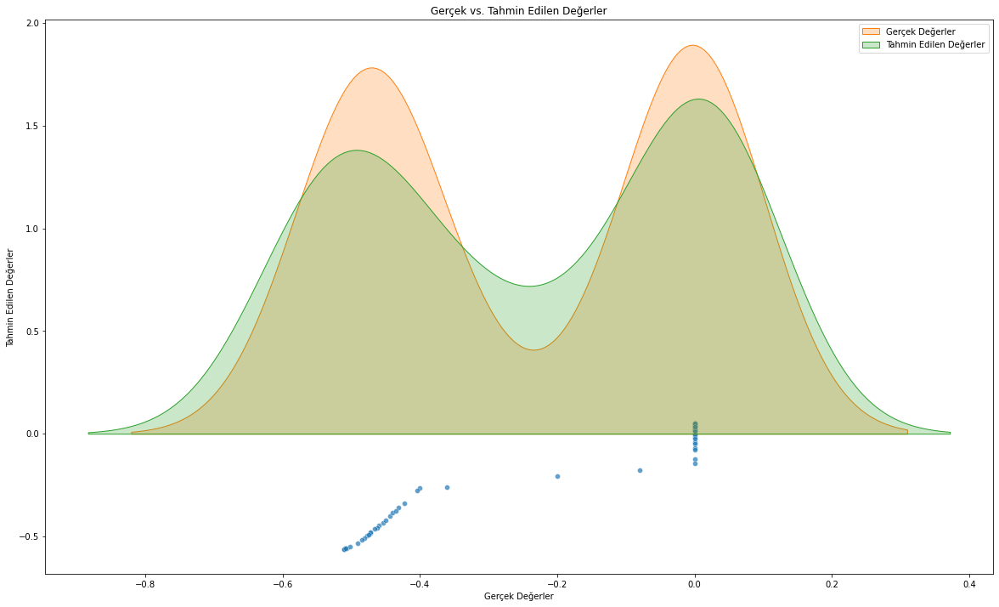

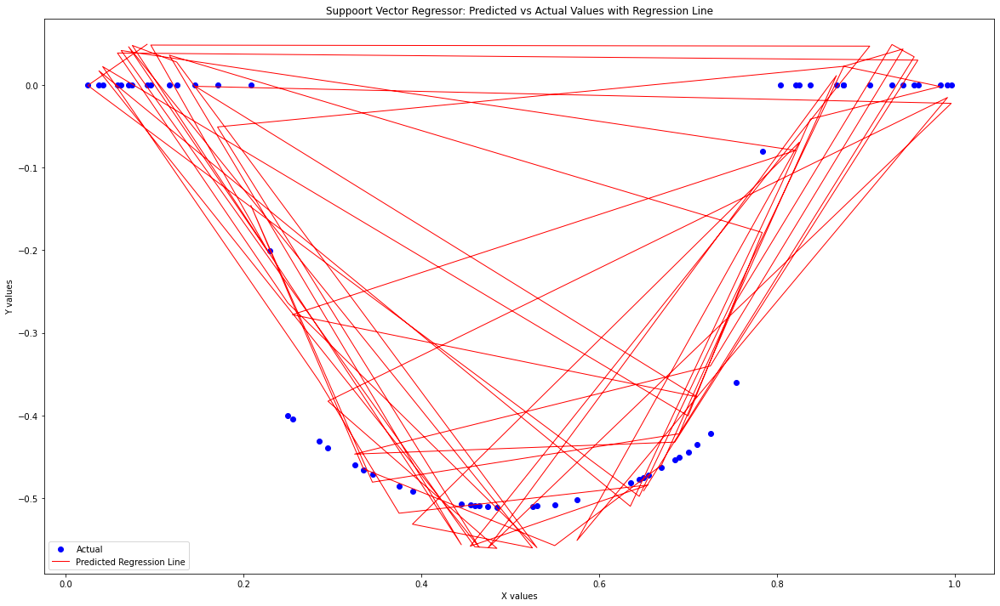

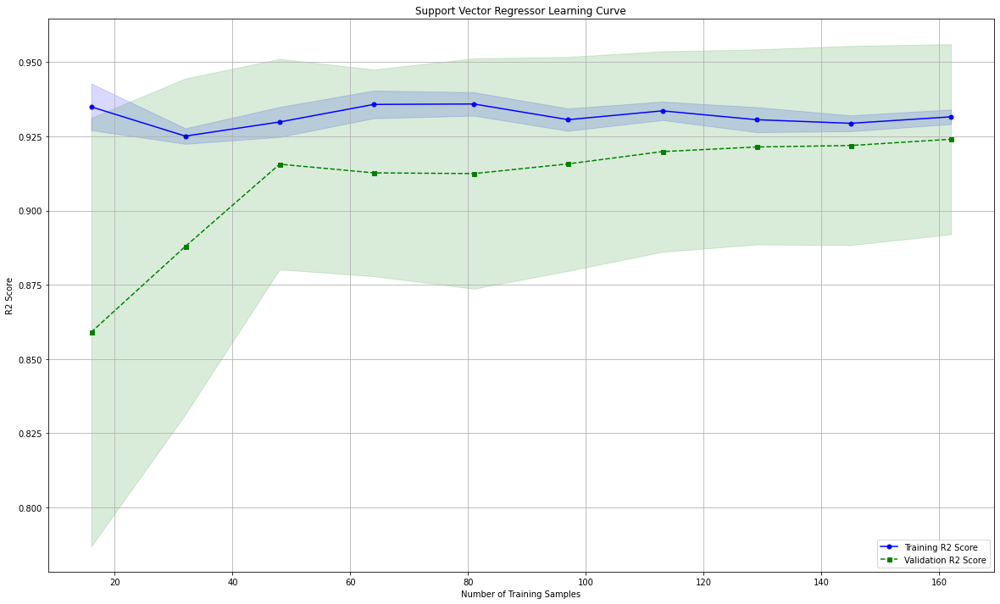

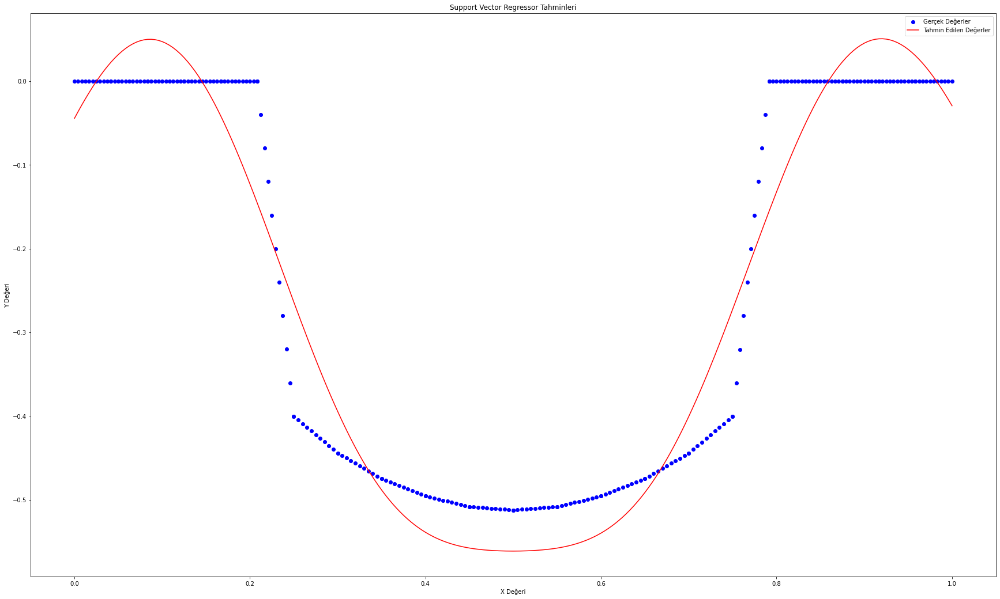

[-0.26]


In [222]:
svr_reg_N22 = SVR(kernel = 'rbf', degree= 24, epsilon = 0.05)


svr_reg_N22.fit(X_train_N22, y_train_N22)

y_pred_N22 = svr_reg_N22.predict(X_test_N22)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred_N22.reshape(len(y_pred_N22),1), y_test_N22.reshape(len(y_test_N22),1)),1))


print(r2_score(y_test_N22, y_pred_N22))


# Use test and show results of test set
y_hat_N22 = svr_reg_N22.predict(X_N22)
mae = metrics.mean_absolute_error(y_N22,y_hat_N22)
mse = metrics.mean_squared_error(y_N22,y_hat_N22)
mape = np.mean(np.abs((y_N22 - y_hat_N22) / y_N22)) * 100

print ("TEST SET")
print ("========")
print ("MAE:                ", mae)
print ("RMSE:               ", math.sqrt(mse))
print ("MAPE:               ", mape)
print ("r2:                 ", svr_reg_N22.score(X_N22,y_N22))



# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_N22 = pd.DataFrame({'Gerçek Değerler': y_test_N22, 'Tahmin Edilen Değerler': y_pred_N22})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N22, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show() 


df_results_N22 = pd.DataFrame({'Predicted': y_pred_N22, 'Actual': y_test_N22})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N22, y_test_N22, color='blue', label='Actual')
plt.plot(X_test_N22, y_pred_N22, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Suppoort Vector Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()



train_sizes, train_scores, test_scores = learning_curve(estimator=svr_reg_N22, X=X_train_N22, y=y_train_N22, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Support Vector Regressor Learning Curve')
plt.grid()
plt.show()

#SVM RBF kernelli modelin predict sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N22 = np.arange(0, 1.004167, 0.004167).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N22 = svr_reg_N22.predict(X_values_N22)

# Gerçek değerler için aynı işlemi yap
y_true_values_N22 = svr_reg_N22.predict(X_N22)

plt.figure(figsize=(30, 18))
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N22, y_pred_values_N22, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Support Vector Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(svr_reg_N22.predict([[0.250]])) #0.250 == -4.002853e-01 gerçek değerde

### PolynomialRegressor ile deneyelim


R2 Score (Polynomial Regression):  0.9252635432646158
MAE (Polynomial Regression):  0.052227799648957574
RMSE (Polynomial Regression):  0.06369435028706165
MAPE (Polynomial Regression):  inf


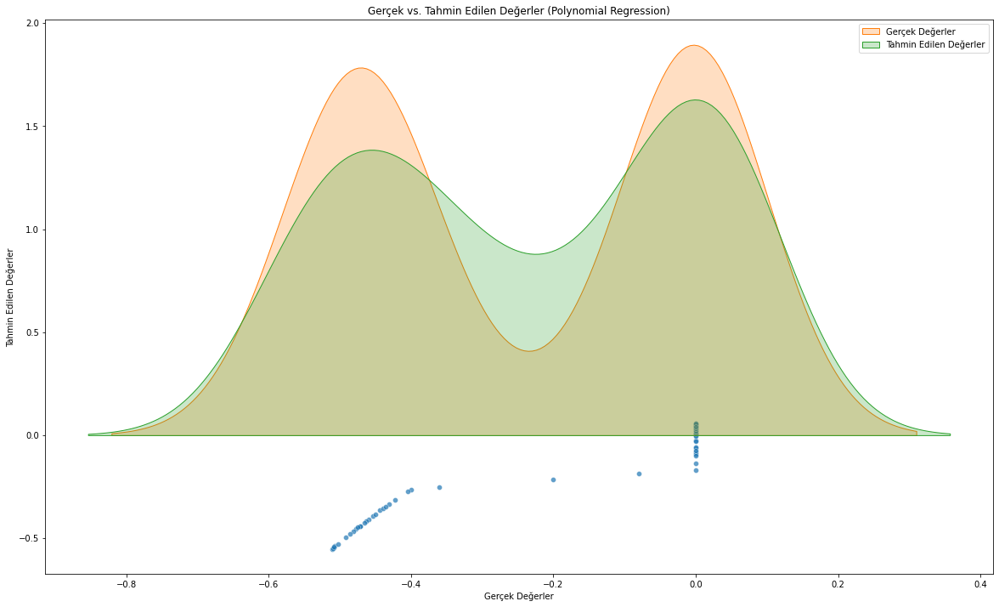

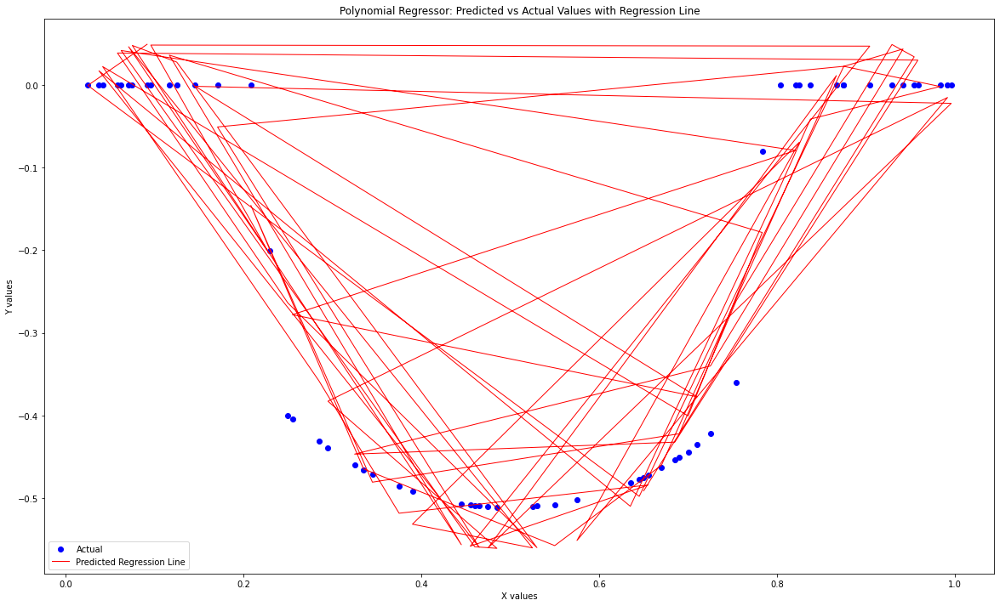

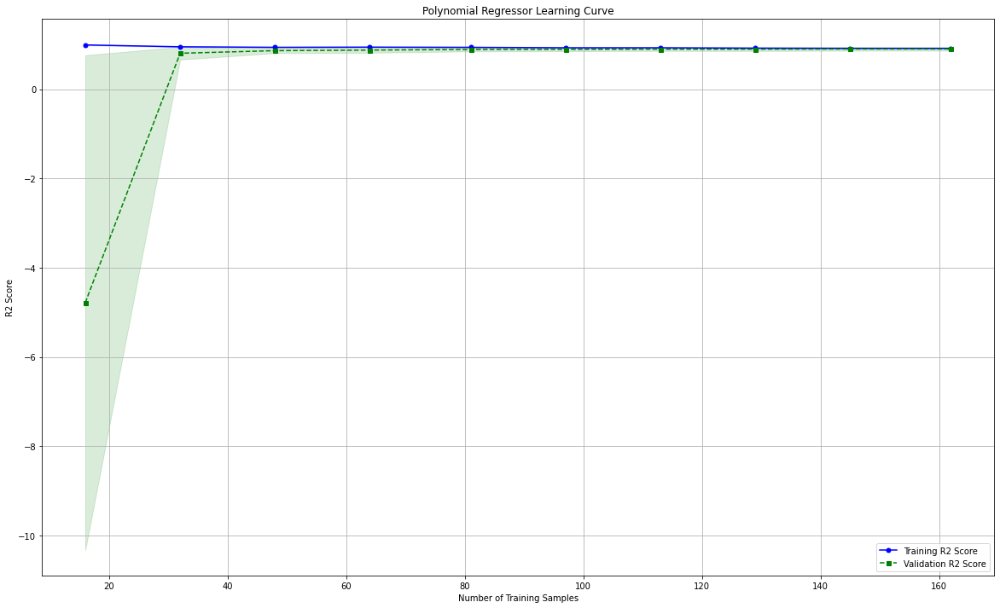

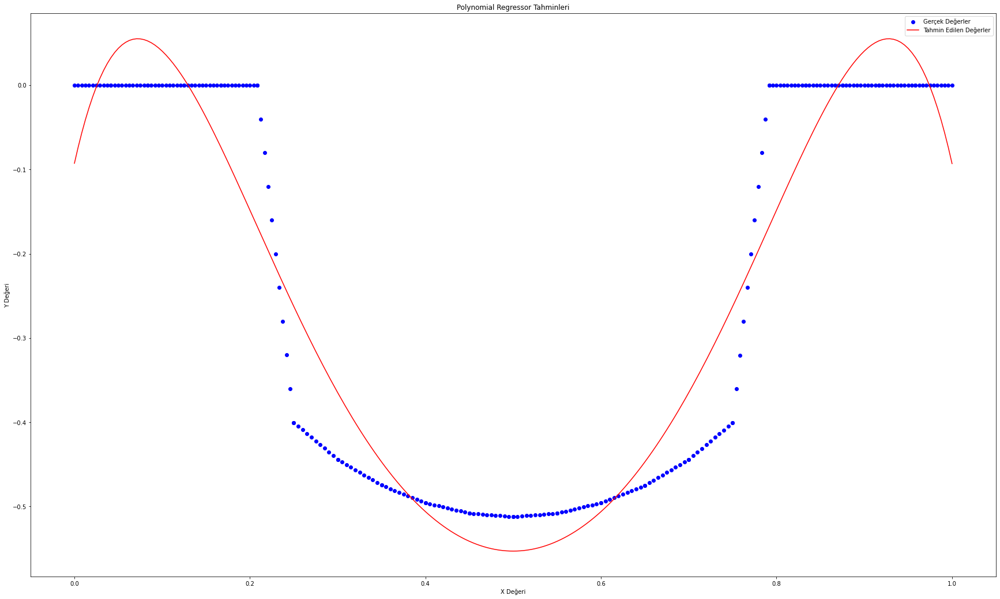

[-0.26]


In [223]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# PolynomialFeatures ile özellikleri genişletme
poly_N22 = PolynomialFeatures(degree=7)
X_poly_N22 = poly_N22.fit_transform(X_N22)

# Lineer Regresyon modeli oluşturma
poly_reg_N22 = make_pipeline(PolynomialFeatures(7), LinearRegression())
poly_reg_N22.fit(X_N22, y_N22)

# Tahminler yapma
y_pred_poly_N22 = poly_reg_N22.predict(X_test_N22)

# Skorları ekrana yazdırma
print("R2 Score (Polynomial Regression): ", r2_score(y_test_N22, y_pred_poly_N22))
print("MAE (Polynomial Regression): ", metrics.mean_absolute_error(y_test_N22, y_pred_poly_N22))
print("RMSE (Polynomial Regression): ", math.sqrt(metrics.mean_squared_error(y_test_N22, y_pred_poly_N22)))
print("MAPE (Polynomial Regression): ", np.mean(np.abs((y_test_N22 - y_pred_poly_N22) / y_test_N22)) * 100)

# Gerçek ve tahmin edilen değerleri içeren DataFrame
result_df_poly_N22 = pd.DataFrame({'Gerçek Değerler': y_test_N22, 'Tahmin Edilen Değerler': y_pred_poly_N22})

# Scatter plot çizimi
plt.figure(figsize=(20, 12))
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_poly_N22, palette='viridis', edgecolor='w', alpha=0.7)
plt.title('Gerçek vs. Tahmin Edilen Değerler (Polynomial Regression)')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N22['Gerçek Değerler'], label='Gerçek Değerler', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_poly_N22['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', shade=True)

plt.legend()
plt.show()


df_results_N22 = pd.DataFrame({'Predicted': y_pred_N22, 'Actual': y_test_N22})

plt.figure(figsize=(20, 12))
plt.scatter(X_test_N22, y_test_N22, color='blue', label='Actual')
plt.plot(X_test_N22, y_pred_N22, color='red', linewidth=1, label='Predicted Regression Line')
plt.xlabel('X values')
plt.ylabel('Y values')
plt.title('Polynomial Regressor: Predicted vs Actual Values with Regression Line')
plt.legend()
plt.show()


train_sizes, train_scores, test_scores = learning_curve(estimator=poly_reg_N22, X=X_train_N22, y=y_train_N22, train_sizes=np.linspace(0.1, 1.0, 10), cv=10, scoring='r2')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(20, 12))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training R2 Score')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation R2 Score')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.xlabel('Number of Training Samples')
plt.ylabel('R2 Score')
plt.legend(loc='lower right')
plt.title('Polynomial Regressor Learning Curve')
plt.grid()
plt.show()


# Polynomial Regression Predict Sonuçları:
### Predict edilen değer kısmı:
# 0'dan 1'e kadar olan değerleri içeren bir dizi oluştur
X_values_N22 = np.arange(0, 1.004167, 0.004167).reshape(-1, 1)

# Modelin tahmin ettiği değerleri al
y_pred_values_N22 = poly_reg_N22.predict(X_values_N22)

# Gerçek değerler için aynı işlemi yap
y_true_values_N22 = poly_reg_N22.predict(X_N22)

plt.figure(figsize=(30, 18))
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')
plt.plot(X_values_N22, y_pred_values_N22, color='red', label='Tahmin Edilen Değerler')
plt.xlabel('X Değeri')
plt.ylabel('Y Değeri')
plt.title('Polynomial Regressor Tahminleri')
plt.legend()
plt.show()

# manuel tek bir değerin predict edilebileceği kısım:
print(poly_reg_N22.predict([[0.250]])) #0.250 == -4.002853e-01 gerçek değerde

### Multi-Layer Perceptron

In [224]:
from keras.models import Sequential
from keras.layers import Dense

mlp = Sequential()
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu', input_dim = 1))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=16, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=8, kernel_initializer='uniform', activation = 'relu'))
mlp.add(Dense(units=1, kernel_initializer='uniform', activation = 'linear'))

mlp.compile(optimizer = 'adam', loss =  'mean_squared_error' , metrics = ['mae'] )
mlp.fit(X_train_N22, y_train_N22,epochs=100, batch_size=32, validation_split=0.25)

y_pred = mlp.predict(X_test_N22)

Epoch 1/100
5/5 [==============================] - 1s 30ms/step - loss: 0.1095 - mae: 0.2396 - val_loss: 0.0994 - val_mae: 0.2181
Epoch 2/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1066 - mae: 0.2386 - val_loss: 0.0969 - val_mae: 0.2181
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1041 - mae: 0.2382 - val_loss: 0.0945 - val_mae: 0.2181
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 0.1013 - mae: 0.2375 - val_loss: 0.0920 - val_mae: 0.2181
Epoch 5/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0987 - mae: 0.2371 - val_loss: 0.0896 - val_mae: 0.2181
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0960 - mae: 0.2360 - val_loss: 0.0872 - val_mae: 0.2181
Epoch 7/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0933 - mae: 0.2355 - val_loss: 0.0848 - val_mae: 0.2181
Epoch 8/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0906 - mae: 0.2349 - va

5/5 [==============================] - 0s 7ms/step - loss: 0.0523 - mae: 0.2226 - val_loss: 0.0550 - val_mae: 0.2305
Epoch 65/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0522 - mae: 0.2226 - val_loss: 0.0547 - val_mae: 0.2300
Epoch 66/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0522 - mae: 0.2226 - val_loss: 0.0546 - val_mae: 0.2298
Epoch 67/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0522 - mae: 0.2226 - val_loss: 0.0547 - val_mae: 0.2300
Epoch 68/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0522 - mae: 0.2226 - val_loss: 0.0549 - val_mae: 0.2302
Epoch 69/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0522 - mae: 0.2226 - val_loss: 0.0550 - val_mae: 0.2305
Epoch 70/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0522 - mae: 0.2224 - val_loss: 0.0550 - val_mae: 0.2304
Epoch 71/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0521 - mae: 0.2224 - val_loss

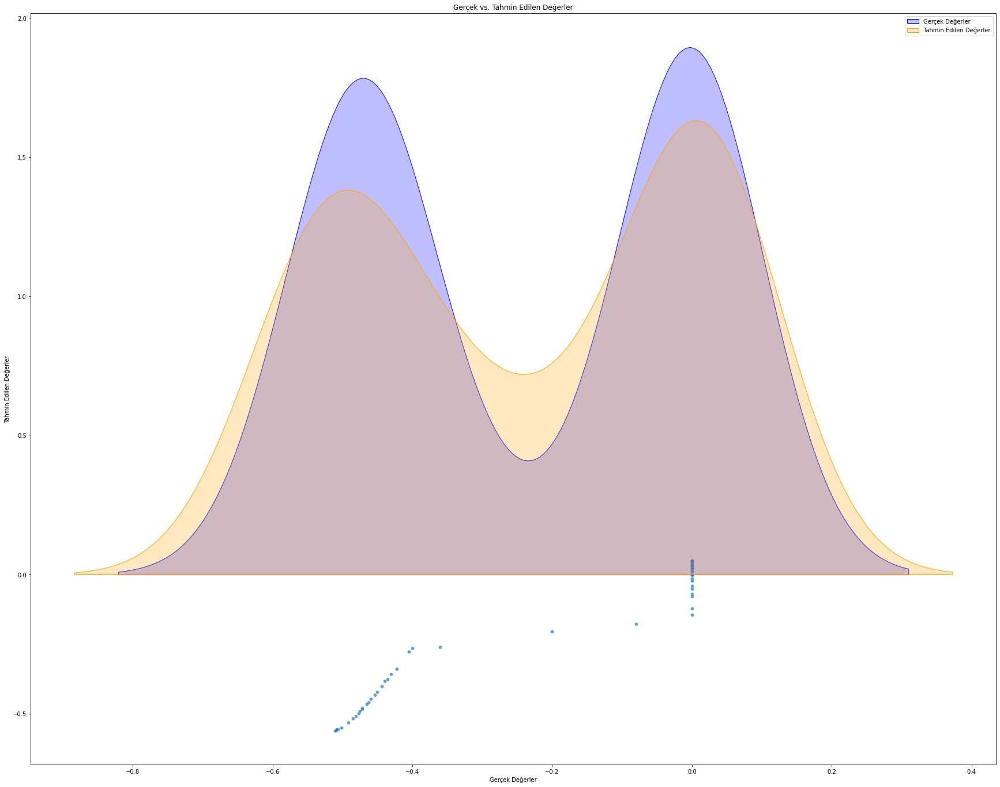

In [225]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# result_df isminde bir DataFrame oluşturulduğunu varsayalım
result_df_N22 = pd.DataFrame({'Gerçek Değerler': y_test_N22.flatten(), 'Tahmin Edilen Değerler': y_pred_N22.flatten()})

# Scatter plot ve yoğunluk grafiği çizimi
plt.figure(figsize=(30, 24))

# Scatter plot
sns.scatterplot(x='Gerçek Değerler', y='Tahmin Edilen Değerler', data=result_df_N22, palette='viridis', edgecolor='w', alpha=0.7)

# Gerçek değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Gerçek Değerler'], label='Gerçek Değerler', color='blue', shade=True)

# Tahmin edilen değerlerin yoğunluk grafiği
sns.kdeplot(result_df_N22['Tahmin Edilen Değerler'], label='Tahmin Edilen Değerler', color='orange', shade=True)

plt.title('Gerçek vs. Tahmin Edilen Değerler')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')

plt.legend()
plt.show()

Epoch 1/50
6/6 [==============================] - 0s 13ms/step - loss: 0.0512 - mae: 0.2210 - val_loss: 0.0545 - val_mae: 0.2279
Epoch 2/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0511 - mae: 0.2208 - val_loss: 0.0544 - val_mae: 0.2276
Epoch 3/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0509 - mae: 0.2206 - val_loss: 0.0548 - val_mae: 0.2292
Epoch 4/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0508 - mae: 0.2201 - val_loss: 0.0552 - val_mae: 0.2300
Epoch 5/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0508 - mae: 0.2198 - val_loss: 0.0552 - val_mae: 0.2299
Epoch 6/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0507 - mae: 0.2195 - val_loss: 0.0556 - val_mae: 0.2308
Epoch 7/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0505 - mae: 0.2191 - val_loss: 0.0558 - val_mae: 0.2310
Epoch 8/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0505 - mae: 0.2189 - val_loss: 

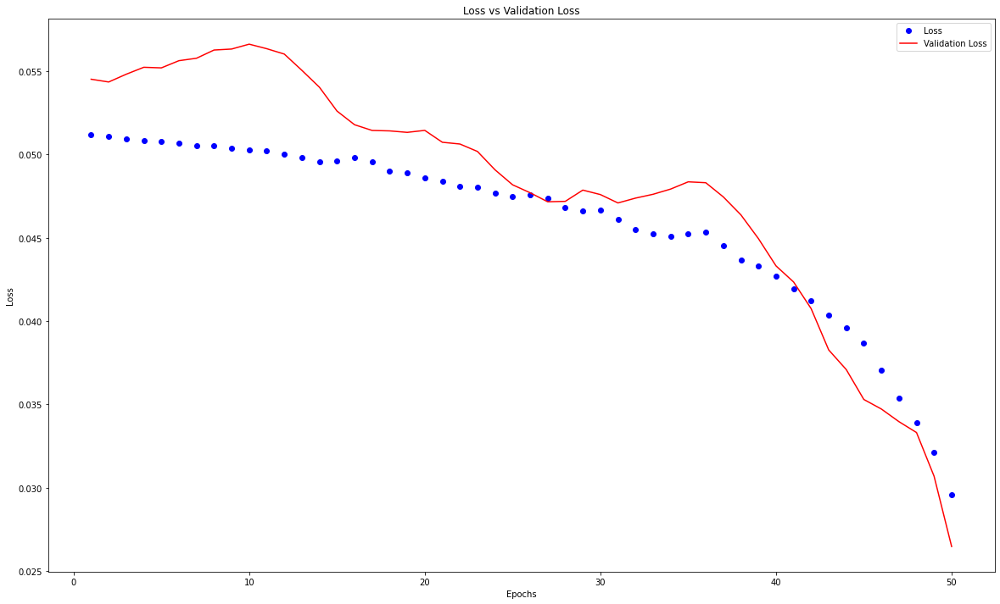

In [226]:
# Modelin eğitim sırasında kayıp (loss) ve doğrulama kaybı (validation loss) değerleri
history = mlp.fit(X_train_N22, y_train_N22, epochs=50, batch_size=32, validation_split=0.1)

# Modelin eğitim sürecindeki kayıp (loss) değerleri
loss = history.history['loss']

# Modelin eğitim sürecindeki doğrulama kaybı (validation loss) değerleri
val_loss = history.history['val_loss']

# Eğitim ve doğrulama kaybı grafiği çizimi
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(20, 12))

plt.plot(epochs, loss, 'bo', label='Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Tüm modellerin grafiklerinin karşılaştırılması


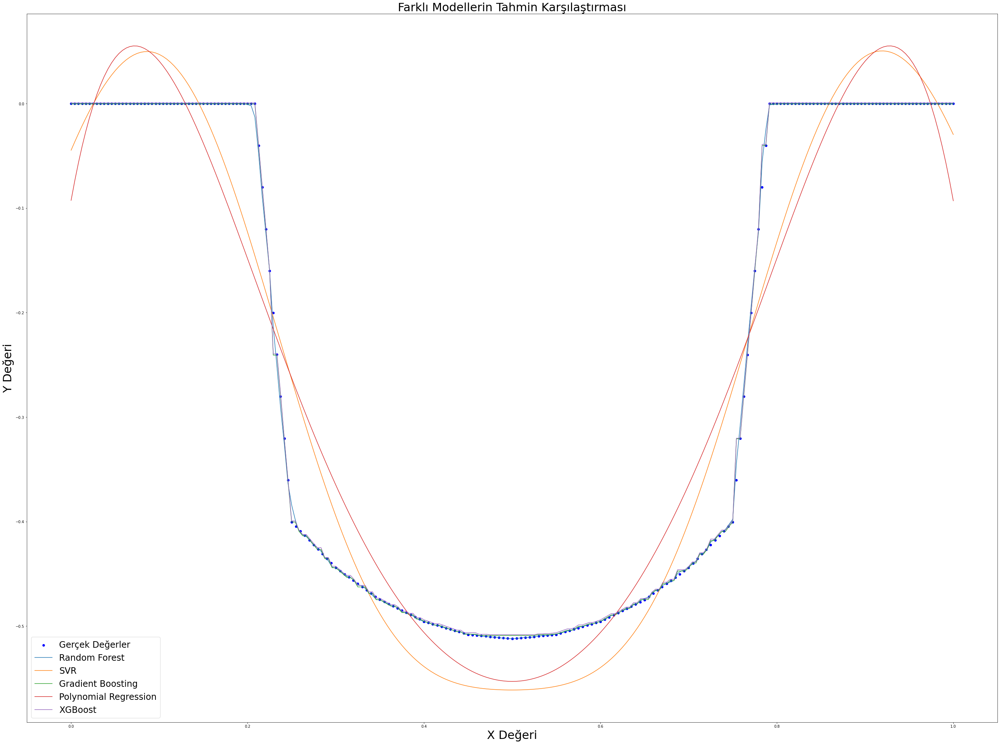

In [227]:
y_pred_rf_N22 = rf_reg_N22.predict(X_values_N22)
y_pred_svr_N22 = svr_reg_N22.predict(X_values_N22)  
y_pred_gb_N22 = gb_reg_N22.predict(X_values_N22)
y_pred_poly_N22 = poly_reg_N22.predict(X_values_N22)
y_pred_xgb_N22 = xgb_N22.predict(X_values_N22)

plt.figure(figsize=(48, 36))

# Gerçek değerler
plt.scatter(X_N22, y_N22, color='blue', label='Gerçek Değerler')

# Modellerin tahminleri
plt.plot(X_values_N22, y_pred_rf_N22, label='Random Forest')
plt.plot(X_values_N22, y_pred_svr_N22, label='SVR')
plt.plot(X_values_N22, y_pred_gb_N22, label='Gradient Boosting')
plt.plot(X_values_N22, y_pred_poly_N22, label='Polynomial Regression')
plt.plot(X_values_N22, y_pred_xgb_N22, label='XGBoost')

# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('Farklı Modellerin Tahmin Karşılaştırması',fontsize=32)
plt.legend(fontsize=24)
plt.show()

## Her N değeri için en iyi sonuçları veren modellerin grafiklerinin bir arada toplanması:

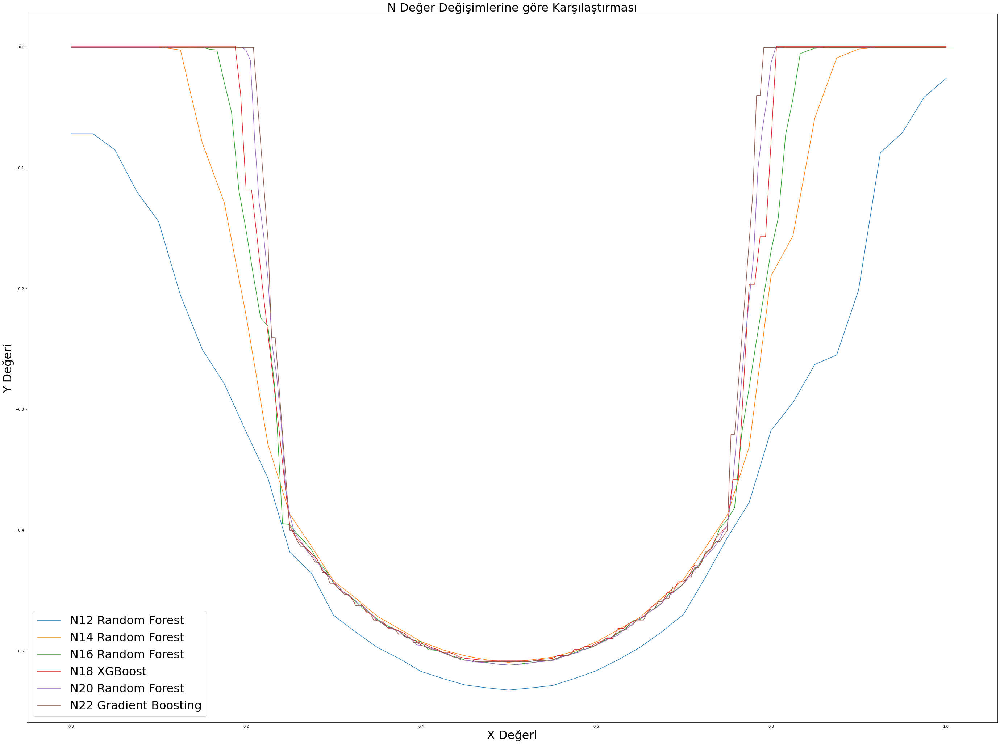

In [228]:
y_pred_rf_N12 = rf_reg_N12.predict(X_values_N12) 
y_pred_rf_N14 = rf_reg_N14.predict(X_values_N14)
y_pred_rf_N16 = rf_reg_N16.predict(X_values_N16)
y_pred_xgb_N18 = xgb_N18.predict(X_values_N18)
y_pred_rf_N20 = rf_reg_N20.predict(X_values_N20)
y_pred_gb_N22 = gb_reg_N22.predict(X_values_N22)

plt.figure(figsize=(48, 36))
# Modellerin tahminleri
plt.plot(X_values_N12, y_pred_rf_N12, label='N12 Random Forest')
plt.plot(X_values_N14, y_pred_rf_N14, label='N14 Random Forest')
plt.plot(X_values_N16, y_pred_rf_N16, label='N16 Random Forest')
plt.plot(X_values_N18, y_pred_xgb_N18, label='N18 XGBoost')
plt.plot(X_values_N20, y_pred_rf_N20, label='N20 Random Forest')
plt.plot(X_values_N22, y_pred_gb_N22, label='N22 Gradient Boosting')
# Etiketler ve başlık
plt.xlabel('X Değeri',fontsize=32)
plt.ylabel('Y Değeri',fontsize=32)
plt.title('N Değer Değişimlerine göre Karşılaştırması',fontsize=32)
plt.legend(fontsize=32)
plt.show()